In [1]:
import os
import sys
import psutil

import pandas as pd
import numpy as np

import keras
import random

from keras.models import Sequential,Model
from keras.layers import Dense,LSTM,Activation,Dropout,BatchNormalization,Input,Embedding
from keras.layers import Flatten,Conv2D,MaxPooling2D,Bidirectional,concatenate

from keras.utils import to_categorical
from keras.callbacks import EarlyStopping
from keras import regularizers
from keras import optimizers
import keras_metrics as km

import matplotlib
import matplotlib.pyplot as plt
import math
from multiprocessing import cpu_count,Pool 
import multiprocessing


from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler

from keras.utils import np_utils
from sklearn.metrics import recall_score,precision_score,f1_score,accuracy_score
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import ShuffleSplit
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report

from sklearn.metrics import make_scorer
from keras.wrappers.scikit_learn import KerasClassifier


from sklearn.metrics import roc_curve, auc

from scipy import interp
import matplotlib.pyplot as plt
from itertools import cycle

from keras_self_attention import SeqSelfAttention


/usr/local/anaconda5/lib/python3.6/site-packages/h5py/__init__.py:34: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


In [2]:
from keras import backend as K
def weighted_categorical_crossentropy(weights):
    """
    A weighted version of keras.objectives.categorical_crossentropy
    
    Variables:
        weights: numpy array of shape (C,) where C is the number of classes
    
    Usage:
        weights = np.array([0.5,2,10]) # Class one at 0.5, class 2 twice the normal weights, class 3 10x.
        loss = weighted_categorical_crossentropy(weights)
        model.compile(loss=loss,optimizer='adam')
    """
    weights = K.variable(weights)      
    def loss(y_true, y_pred):
        # scale predictions so that the class probas of each sample sum to 1
        y_pred /= K.sum(y_pred, axis=-1, keepdims=True)
        # clip to prevent NaN's and Inf's
        y_pred = K.clip(y_pred, K.epsilon(), 1 - K.epsilon())
        # calc
        loss = y_true * K.log(y_pred) * weights
        loss = -K.sum(loss, -1)
        return loss
    
    return loss

In [3]:
SEQ=8
verbose = 2
dropout=0.3
ACT_POSTERIOR = 'relu'
weights = np.array([0.2,0.8])
patience = 10
weight_decay = 0.0001
lr=0.1
lr_decay=1e-6

LSTM_UNIT = 128
GEOHASH_UNIT = 32
EMBEDDING_UNIT = 128
NLP_UNIT = 128
SEQ_UNIT = 256
ACT_PRIOR = 'sigmoid'
DENSE_CONCAT = 256
VAL_SPLIT = 0.2
CONV_UNIT = 32
ADD_ON_LAYERS = True
Embedding_outdim = 100

In [4]:
def reshape_cat(array,category):
    l=[]
    b = array[:,0:-114]
    if category!='geohash' and  category!='NLP' :
        for i in range(SEQ):
            c = b[:,i*25:i*25+25]
            if category == 'traffic':
                #d = np.concatenate((c[:,0:9],c[:,-5:]),axis=1)
                d = np.concatenate([c[:,1:2],c[:,3:10]],axis=1)
            elif category=='weather':
                d = c[:,10:-5]
            elif category=='time':
                d = np.concatenate([c[:,0:1],c[:,2:3],c[:,-5:]],axis=1) 
            else:
                d = c
            l.append(d)        
        n = np.concatenate(l,axis=1)
        #if category!='no_geohash':
        #    return np.concatenate((n,array[:,-14:]),axis=1)
        return n
    elif category=='NLP':
        return array[:,-100:]
    else:
        return array[:,-114:-100]

In [5]:
# Compute ROC curve and ROC area for each class
def roc_auc_compute(y_test,y_score,n_classes=2):
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_score[:, i],pos_label=1)
        roc_auc[i] = auc(fpr[i], tpr[i])

    # Compute micro-average ROC curve and ROC area
    fpr["micro"], tpr["micro"], _ = roc_curve(y_test.ravel(), y_score.ravel(),pos_label=1)
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

    # Compute macro-average ROC curve and ROC area

    # First aggregate all false positive rates
    all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

    # Then interpolate all ROC curves at this points
    mean_tpr = np.zeros_like(all_fpr)
    for i in range(n_classes):
        mean_tpr += interp(all_fpr, fpr[i], tpr[i])

    # Finally average it and compute AUC
    mean_tpr /= n_classes

    fpr["macro"] = all_fpr
    tpr["macro"] = mean_tpr
    roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])
    return fpr,tpr,roc_auc
def plot_roc(fpr,tpr,roc_auc,n_classes=2):
    lw = 2
# Plot all ROC curves
    plt.figure(1)
    plt.plot(fpr["micro"], tpr["micro"],
             label='micro-average ROC curve (area = {0:0.2f})'
                   ''.format(roc_auc["micro"]),
             color='deeppink', linestyle=':', linewidth=4)

    plt.plot(fpr["macro"], tpr["macro"],
             label='macro-average ROC curve (area = {0:0.2f})'
                   ''.format(roc_auc["macro"]),
             color='navy', linestyle=':', linewidth=4)
    plt.plot([0, 1], [0, 1], 'k--', lw=lw)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    #plt.title('Some extension of Receiver operating characteristic to multi-class')
    plt.legend(loc="lower right")
    plt.show()
    
    plt.figure(2)
    colors = cycle(['aqua', 'darkorange', 'cornflowerblue'])
    for i, color in zip(range(n_classes), colors):
        plt.plot(fpr[i], tpr[i], color=color, lw=lw,
                 label='ROC curve of class {0} (area = {1:0.2f})'
                 ''.format(i, roc_auc[i]))

    plt.plot([0, 1], [0, 1], 'k--', lw=lw)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    #plt.title('Some extension of Receiver operating characteristic to multi-class')
    plt.legend(loc="lower right")
    plt.show()

In [6]:
class base_model(object):        
    def __init__(self,n_jobs=10,act=ACT_POSTERIOR,city='Atlanta'): 
        self.n_jobs=n_jobs
        self.CITY=city
        self.act=act
   
    def load_data(self,category=None,with_geocode=False):
        self.X_train = np.load('train_set/X_train_'+self.CITY+'.npy')
        self.y_train = np.load('train_set/y_train_'+self.CITY+'.npy')
        self.X_test = np.load('train_set/X_test_'+self.CITY+'.npy')
        self.y_test = np.load('train_set/y_test_'+self.CITY+'.npy')
        
        if not with_geocode:
            self.X_train = self.X_train[:,0:-1]    
            self.X_test = self.X_test[:,0:-1]     
        self.update_y()   
        
        if category!=None:
            if with_geocode:
                temp_train = self.X_train[:,0:-1]    
                temp_test = self.X_test[:,0:-1]   
            else:
                temp_train = self.X_train 
                temp_test = self.X_test  
            l_train=[]
            l_test=[]
            for cat in category:
                l_train.append(reshape_cat(temp_train,cat))
                l_test.append(reshape_cat(temp_test,cat))
            temp_train = np.concatenate(l_train,axis=1)
            temp_test = np.concatenate(l_test,axis=1)
            if with_geocode:
                #print (self.X_train[:,-1:])
                self.X_train = np.concatenate((temp_train,self.X_train[:,-1:]),axis=1)
                self.X_test = np.concatenate((temp_test,self.X_test[:,-1:]),axis=1)
            else:
                self.X_train = temp_train
                self.X_test = temp_test
                
        print ('load and test: shapes for train and test, X/Y')
        print (self.X_train.shape)
        print (self.y_train.shape)
        print (self.X_test.shape)
        print (self.y_test.shape)
    
    def update_y(self):
        self.y_train = to_categorical(self.y_train,2)
        self.y_test = to_categorical(self.y_test,2)
    def last_layers(self,model_in):
        model_in = Dense(DENSE_CONCAT,
                    kernel_regularizer=regularizers.l2(self.weight_decay),
                    activation=self.act)(model_in)
        
        model_in = Dense(units=int(DENSE_CONCAT/2),
                    kernel_regularizer=regularizers.l2(self.weight_decay),
                    activation=None)(model_in)
        if ADD_ON_LAYERS:
            model_in = BatchNormalization()(model_in)
        model_in = Activation(self.act)(model_in)
        model_in = Dropout(dropout)(model_in)
        
        model_in = Dense(units=int(DENSE_CONCAT/8),
                    kernel_regularizer=regularizers.l2(self.weight_decay),
                    activation=None)(model_in)
        if ADD_ON_LAYERS:
            model_in = BatchNormalization()(model_in)
        model_in = Activation(self.act)(model_in)
        #model_in = Dropout(dropout)(model_in)
        ######################################
        main_output = Dense(self.output_dim, activation=self.activation)(model_in)
        return main_output
        
class keras_model(base_model):
    def __init__(self,city='Atlanta',activation='softmax',batch_size=256,epoch = 60,n_jobs=1,act=ACT_POSTERIOR):
        super(keras_model,self).__init__(act=act,city=city)
        self.output_dim = 2
        self.activation=activation
        self.batch_size = batch_size
        self.epoch = epoch
        self.n_jobs=n_jobs
        self.weight_decay = weight_decay
        self.lr=lr
        self.lr_decay=lr_decay
        
    def reshape(self,x):
        x = x[:,0:-114]
        x = x.reshape((x.shape[0],SEQ,int(x.shape[1]/SEQ)))
        return x
    
    def compile_model(self,model=None):
        #precision = km.categorical_precision(label=1)
        #recall = km.categorical_recall(label=1)
        f1_score = km.categorical_f1_score(label=1)
        self.earlyStopping = EarlyStopping(monitor='val_f1_score', 
                                           #monitor = 'val_categorical_f1_score',
                                           restore_best_weights=True,
                                           patience=patience, verbose=0, mode='max'#,baseline=0.1
                                          )
        adam  = optimizers.Adam(lr=self.lr, decay=self.lr_decay)
        loss=weighted_categorical_crossentropy(weights)
        self.model.compile(optimizer=adam, loss=loss#'categorical_crossentropy'
                           ,metrics=[f1_score])
    def create_model(self):
        self.model = KerasClassifier(build_fn=self.build_model, epochs=self.epoch, batch_size=self.batch_size, verbose=1)
    def make_report(self,y_true,y_pred):
        data_frame = classification_report(y_true.argmax(axis=-1), y_pred.argmax(axis=-1),output_dict=True)
        df = pd.DataFrame(data_frame)
        df = df.reset_index()
        roc_dict = self.roc_auc(y_true,y_pred)
        df = df.append({'index':'auc','0': roc_dict[0], '1': roc_dict[1],
                   'micro avg': roc_dict['micro'],
                   'macro avg':roc_dict['macro']}, ignore_index=True)
        df = df.set_index('index')
        display(df)
        return df
        
    def roc_auc(self,y_test,y_score):
        fpr,tpr,roc_auc = roc_auc_compute(y_test,y_score)
        plot_roc(fpr,tpr,roc_auc)
        return roc_auc
         
        

In [7]:
class DNN(keras_model):
        
    def create_model(self):
        input1 = Input(shape=(self.X_train.shape[1],),dtype='float32',name='main_input')
        main_output = self.last_layers(input1)
        
        self.model = Model(inputs=[input1], outputs=main_output)
        
        
        #keras.layers.Dense(units, activation=None, use_bias=True, 
        #kernel_initializer='glorot_uniform', bias_initializer='zeros', 
        #kernel_regularizer=None, bias_regularizer=None, activity_regularizer=None, 
        #kernel_constraint=None, bias_constraint=None)
        print(self.model.summary())
        
    def train(self):
        history = self.model.fit(self.X_train, self.y_train, batch_size=self.batch_size, 
                                 epochs=self.epoch,verbose=verbose,validation_split=VAL_SPLIT, callbacks=[self.earlyStopping])        
    def evaluate(self):    
        y_true, y_pred =  self.y_test, self.model.predict(self.X_test,verbose=verbose)
        return self.make_report(y_true, y_pred)
        

In [8]:
class model_LSTM_aug(keras_model):       
    def load_data(self,category):
        super(model_LSTM_aug,self).load_data(category)
        
        self.X_train1 = self.reshape(self.X_train)
        self.X_test1 = self.reshape(self.X_test)
        
        self.X_train2 = reshape_cat(self.X_train,'geohash')
        self.X_train3 = reshape_cat(self.X_train,'NLP')
        
        self.X_test2 = reshape_cat(self.X_test,'geohash')
        self.X_test3 = reshape_cat(self.X_test,'NLP')
        
        print (self.X_train1.shape)
        print (self.X_train2.shape)
        print (self.X_train3.shape)
        
    def create_model(self):
        
        input1 = Input(shape=(self.X_train1.shape[1], self.X_train1.shape[2]),dtype='float32', 
                           name='main_input')
        lstm = LSTM(units = LSTM_UNIT, return_sequences = True,
                     kernel_regularizer=regularizers.l2(self.weight_decay),
                     recurrent_regularizer = regularizers.l2(self.weight_decay),
                     dropout=dropout,
                     recurrent_dropout=dropout,
                     unroll = True)(input1)
        
        lstm = LSTM(units = LSTM_UNIT, return_sequences = False,
                     kernel_regularizer=regularizers.l2(self.weight_decay),
                     recurrent_regularizer = regularizers.l2(self.weight_decay),
                     dropout=dropout,
                     recurrent_dropout=dropout,
                     unroll = True)(lstm)
        ######################################
        input2 = Input(shape=(self.X_train2.shape[1],), dtype='float32', name='geohash_input')
        geohash_vec = Dense(GEOHASH_UNIT, activation=ACT_PRIOR)(input2)
        ######################################
        input3 = Input(shape=(self.X_train3.shape[1],), dtype='float32', name='nlp_input')
        nlp_vec = Dense(NLP_UNIT, activation=ACT_PRIOR)(input3)
        ######################################
        level_2 = concatenate([lstm, geohash_vec,nlp_vec])
        
        main_output = self.last_layers(level_2)
        
        self.model = Model(inputs=[input1,input2,input3], outputs=main_output)
        
        print(self.model.summary())
        
    def train(self):
        history = self.model.fit([self.X_train1,self.X_train2,self.X_train3], self.y_train, batch_size=self.batch_size, 
                                 epochs=self.epoch,verbose=verbose,validation_split=VAL_SPLIT, callbacks=[self.earlyStopping])        
    def evaluate(self):    
        y_true, y_pred =  self.y_test, self.model.predict([self.X_test1,self.X_test2,self.X_test3],verbose=verbose)
        return self.make_report(y_true, y_pred)
        

In [9]:
class model_LSTM_aug_wo_geohash(keras_model):       
    def load_data(self,category):
        super(model_LSTM_aug_wo_geohash,self).load_data(category)
        
        self.X_train1 = self.reshape(self.X_train)
        self.X_test1 = self.reshape(self.X_test)
        
        #self.X_train2 = reshape_cat(self.X_train,'geohash')
        self.X_train3 = reshape_cat(self.X_train,'NLP')
        
        #self.X_test2 = reshape_cat(self.X_test,'geohash')
        self.X_test3 = reshape_cat(self.X_test,'NLP')
        
        print (self.X_train1.shape)
        #print (self.X_train2.shape)
        print (self.X_train3.shape)
        
    def create_model(self):
        
        input1 = Input(shape=(self.X_train1.shape[1], self.X_train1.shape[2]),dtype='float32', 
                           name='main_input')
        lstm = LSTM(units = LSTM_UNIT, return_sequences = True,
                     kernel_regularizer=regularizers.l2(self.weight_decay),
                     recurrent_regularizer = regularizers.l2(self.weight_decay),
                     dropout=dropout,
                     recurrent_dropout=dropout,
                     unroll = True)(input1)
        
        lstm = LSTM(units = LSTM_UNIT, return_sequences = False,
                     kernel_regularizer=regularizers.l2(self.weight_decay),
                     recurrent_regularizer = regularizers.l2(self.weight_decay),
                     dropout=dropout,
                     recurrent_dropout=dropout,
                     unroll = True)(lstm)
        ######################################
        #input2 = Input(shape=(self.X_train2.shape[1],), dtype='float32', name='geohash_input')
        #geohash_vec = Dense(GEOHASH_UNIT, activation=ACT_PRIOR)(input2)
        ######################################
        input3 = Input(shape=(self.X_train3.shape[1],), dtype='float32', name='nlp_input')
        nlp_vec = Dense(NLP_UNIT, activation=ACT_PRIOR)(input3)
        ######################################
        level_2 = concatenate([lstm, nlp_vec])
        
        main_output = self.last_layers(level_2)
        
        self.model = Model(inputs=[input1,input3], outputs=main_output)
        
        print(self.model.summary())
        
    def train(self):
        history = self.model.fit([self.X_train1,self.X_train3], self.y_train, batch_size=self.batch_size, 
                                 epochs=self.epoch,verbose=verbose,validation_split=VAL_SPLIT, callbacks=[self.earlyStopping])        
    def evaluate(self):    
        y_true, y_pred =  self.y_test, self.model.predict([self.X_test1,self.X_test3],verbose=verbose)
        return self.make_report(y_true, y_pred)
        

In [10]:
class model_LSTM_aug_wo_NLP(keras_model):       
    def load_data(self,category):
        super(model_LSTM_aug_wo_NLP,self).load_data(category)
        
        self.X_train1 = self.reshape(self.X_train)
        self.X_test1 = self.reshape(self.X_test)
        
        self.X_train2 = reshape_cat(self.X_train,'geohash')
        #self.X_train3 = reshape_cat(self.X_train,'NLP')
        
        self.X_test2 = reshape_cat(self.X_test,'geohash')
        #self.X_test3 = reshape_cat(self.X_test,'NLP')
        
        print (self.X_train1.shape)
        print (self.X_train2.shape)
        #print (self.X_train3.shape)
        
    def create_model(self):
        
        input1 = Input(shape=(self.X_train1.shape[1], self.X_train1.shape[2]),dtype='float32', 
                           name='main_input')
        lstm = LSTM(units = LSTM_UNIT, return_sequences = True,
                     kernel_regularizer=regularizers.l2(self.weight_decay),
                     recurrent_regularizer = regularizers.l2(self.weight_decay),
                     dropout=dropout,
                     recurrent_dropout=dropout,
                     unroll = True)(input1)
        
        lstm = LSTM(units = LSTM_UNIT, return_sequences = False,
                     kernel_regularizer=regularizers.l2(self.weight_decay),
                     recurrent_regularizer = regularizers.l2(self.weight_decay),
                     dropout=dropout,
                     recurrent_dropout=dropout,
                     unroll = True)(lstm)
        ######################################
        input2 = Input(shape=(self.X_train2.shape[1],), dtype='float32', name='geohash_input')
        geohash_vec = Dense(GEOHASH_UNIT, activation=ACT_PRIOR)(input2)
        ######################################
        #input3 = Input(shape=(self.X_train3.shape[1],), dtype='float32', name='nlp_input')
        #nlp_vec = Dense(NLP_UNIT, activation=ACT_PRIOR)(input3)
        ######################################
        level_2 = concatenate([lstm, geohash_vec])
        
        main_output = self.last_layers(level_2)
        
        self.model = Model(inputs=[input1,input2], outputs=main_output)
        
        print(self.model.summary())
        
    def train(self):
        history = self.model.fit([self.X_train1,self.X_train2], self.y_train, batch_size=self.batch_size, 
                                 epochs=self.epoch,verbose=verbose,validation_split=VAL_SPLIT, callbacks=[self.earlyStopping])        
    def evaluate(self):    
        y_true, y_pred =  self.y_test, self.model.predict([self.X_test1,self.X_test2],verbose=verbose)
        return self.make_report(y_true, y_pred)
        

In [11]:
class model_LSTM_aug_wo_geo(keras_model):       
    def load_data(self,category):
        super(model_LSTM_aug_wo_geo,self).load_data(category)
        
        self.X_train1 = self.reshape(self.X_train)
        self.X_test1 = self.reshape(self.X_test)
        
        #self.X_train2 = reshape_cat(self.X_train,'geohash')
        #self.X_train3 = reshape_cat(self.X_train,'NLP')
        
        #self.X_test2 = reshape_cat(self.X_test,'geohash')
        #self.X_test3 = reshape_cat(self.X_test,'NLP')
        
        print (self.X_train1.shape)
        #print (self.X_train2.shape)
        #print (self.X_train3.shape)
        
    def create_model(self):
        
        input1 = Input(shape=(self.X_train1.shape[1], self.X_train1.shape[2]),dtype='float32', 
                           name='main_input')
        lstm = LSTM(units = LSTM_UNIT, return_sequences = True,
                     kernel_regularizer=regularizers.l2(self.weight_decay),
                     recurrent_regularizer = regularizers.l2(self.weight_decay),
                     dropout=dropout,
                     recurrent_dropout=dropout,
                     unroll = True)(input1)
        
        lstm = LSTM(units = LSTM_UNIT, return_sequences = False,
                     kernel_regularizer=regularizers.l2(self.weight_decay),
                     recurrent_regularizer = regularizers.l2(self.weight_decay),
                     dropout=dropout,
                     recurrent_dropout=dropout,
                     unroll = True)(lstm)
        ######################################
        #input2 = Input(shape=(self.X_train2.shape[1],), dtype='float32', name='geohash_input')
        #geohash_vec = Dense(GEOHASH_UNIT, activation=ACT_PRIOR)(input2)
        ######################################
        #input3 = Input(shape=(self.X_train3.shape[1],), dtype='float32', name='nlp_input')
        #nlp_vec = Dense(NLP_UNIT, activation=ACT_PRIOR)(input3)
        ######################################
        level_2 = lstm#concatenate([lstm, geohash_vec])
        
        main_output = self.last_layers(level_2)
        
        self.model = Model(inputs=[input1], outputs=main_output)
        
        print(self.model.summary())
        
    def train(self):
        history = self.model.fit([self.X_train1], self.y_train, batch_size=self.batch_size, 
                                 epochs=self.epoch,verbose=verbose,validation_split=VAL_SPLIT, callbacks=[self.earlyStopping])        
    def evaluate(self):    
        y_true, y_pred =  self.y_test, self.model.predict([self.X_test1],verbose=verbose)
        return self.make_report(y_true, y_pred)
        

In [12]:
class model_LSTM_aug_embed(keras_model):
    
    def load_data(self,category):
        super(model_LSTM_aug_embed,self).load_data(category,with_geocode=True)
        
        self.X_train1 = self.reshape(self.X_train[:,:-1])
        self.X_test1 = self.reshape(self.X_test[:,:-1])
        
        self.X_train2 = reshape_cat(self.X_train[:,:-1],'geohash')
        self.X_train3 = reshape_cat(self.X_train[:,:-1],'NLP')
        
        self.X_test2 = reshape_cat(self.X_test[:,:-1],'geohash')
        self.X_test3 = reshape_cat(self.X_test[:,:-1],'NLP')
        
        self.X_train4 = self.X_train[:,-1]
        self.X_test4 = self.X_test[:,-1]
        
        print (self.X_train1.shape)
        print (self.X_train2.shape)
        print (self.X_train3.shape)
        print (self.X_train4.shape)
        
    def create_model(self):
        
        input1 = Input(shape=(self.X_train1.shape[1], self.X_train1.shape[2]),dtype='float32', 
                           name='main_input')
        lstm = LSTM(units = LSTM_UNIT, return_sequences = True,
                     kernel_regularizer=regularizers.l2(self.weight_decay),
                     recurrent_regularizer = regularizers.l2(self.weight_decay),
                     dropout=dropout,
                     recurrent_dropout=dropout,
                     unroll = True)(input1)
        
        lstm = LSTM(units = LSTM_UNIT, return_sequences = False,
                     kernel_regularizer=regularizers.l2(self.weight_decay),
                     recurrent_regularizer = regularizers.l2(self.weight_decay),
                     dropout=dropout,
                     recurrent_dropout=dropout,
                     unroll = True)(lstm)
        ######################################
        input2 = Input(shape=(self.X_train2.shape[1],), dtype='float32', name='geohash_input')
        geohash_vec = Dense(GEOHASH_UNIT, activation=ACT_PRIOR)(input2)
        ######################################
        input3 = Input(shape=(self.X_train3.shape[1],), dtype='float32', name='nlp_input')
        nlp_vec = Dense(NLP_UNIT, activation=ACT_PRIOR)(input3)
        ######################################
        input4 = Input(shape=(1,),dtype='int32',name='geo_code')
        embeding = Embedding(input_dim=935, output_dim=Embedding_outdim, embeddings_initializer='uniform',input_length=1)(input4)
        embeding = Flatten()(embeding)
        embeding = Dense(EMBEDDING_UNIT, activation=ACT_PRIOR)(embeding)
        ######################################
        level_3 = concatenate([lstm,geohash_vec,nlp_vec,embeding])
        
        main_output = self.last_layers(level_3)
        
        self.model = Model(inputs=[input1,input2,input3,input4], outputs=main_output)
        
        print(self.model.summary())
        
    def train(self):
        history = self.model.fit([self.X_train1,self.X_train2,self.X_train3,self.X_train4], self.y_train, batch_size=self.batch_size, 
                                 epochs=self.epoch,verbose=verbose,validation_split=VAL_SPLIT, callbacks=[self.earlyStopping])        
    def evaluate(self):    
        y_true, y_pred =  self.y_test, self.model.predict([self.X_test1,self.X_test2,self.X_test3,self.X_test4],verbose=verbose)
        return self.make_report(y_true, y_pred)
        
        


In [13]:
class model_LSTM_aug_embed_wo_geohash(keras_model):
    
    def load_data(self,category):
        super(model_LSTM_aug_embed_wo_geohash,self).load_data(category,with_geocode=True)
        
        self.X_train1 = self.reshape(self.X_train[:,:-1])
        self.X_test1 = self.reshape(self.X_test[:,:-1])
        
        #self.X_train2 = reshape_cat(self.X_train[:,:-1],'geohash')
        self.X_train3 = reshape_cat(self.X_train[:,:-1],'NLP')
        
        #self.X_test2 = reshape_cat(self.X_test[:,:-1],'geohash')
        self.X_test3 = reshape_cat(self.X_test[:,:-1],'NLP')
        
        self.X_train4 = self.X_train[:,-1]
        self.X_test4 = self.X_test[:,-1]
        
        print (self.X_train1.shape)
        #print (self.X_train2.shape)
        print (self.X_train3.shape)
        print (self.X_train4.shape)
        
    def create_model(self):
        
        input1 = Input(shape=(self.X_train1.shape[1], self.X_train1.shape[2]),dtype='float32', 
                           name='main_input')
        lstm = LSTM(units = LSTM_UNIT, return_sequences = True,
                     kernel_regularizer=regularizers.l2(self.weight_decay),
                     recurrent_regularizer = regularizers.l2(self.weight_decay),
                     dropout=dropout,
                     recurrent_dropout=dropout,
                     unroll = True)(input1)
        
        lstm = LSTM(units = LSTM_UNIT, return_sequences = False,
                     kernel_regularizer=regularizers.l2(self.weight_decay),
                     recurrent_regularizer = regularizers.l2(self.weight_decay),
                     dropout=dropout,
                     recurrent_dropout=dropout,
                     unroll = True)(lstm)
        ######################################
        #input2 = Input(shape=(self.X_train2.shape[1],), dtype='float32', name='geohash_input')
        #geohash_vec = Dense(GEOHASH_UNIT, activation=ACT_PRIOR)(input2)
        ######################################
        input3 = Input(shape=(self.X_train3.shape[1],), dtype='float32', name='nlp_input')
        nlp_vec = Dense(NLP_UNIT, activation=ACT_PRIOR)(input3)
        ######################################
        input4 = Input(shape=(1,),dtype='int32',name='geo_code')
        embeding = Embedding(input_dim=935, output_dim=Embedding_outdim, embeddings_initializer='uniform',input_length=1)(input4)
        embeding = Flatten()(embeding)
        embeding = Dense(EMBEDDING_UNIT, activation=ACT_PRIOR)(embeding)
        ######################################
        level_3 = concatenate([lstm,nlp_vec,embeding])
        
        main_output = self.last_layers(level_3)
        
        self.model = Model(inputs=[input1,input3,input4], outputs=main_output)
        
        print(self.model.summary())
        
    def train(self):
        history = self.model.fit([self.X_train1,self.X_train3,self.X_train4], self.y_train, batch_size=self.batch_size, 
                                 epochs=self.epoch,verbose=verbose,validation_split=VAL_SPLIT, callbacks=[self.earlyStopping])        
    def evaluate(self):    
        y_true, y_pred =  self.y_test, self.model.predict([self.X_test1,self.X_test3,self.X_test4],verbose=verbose)
        return self.make_report(y_true, y_pred)
        
        


In [14]:
class model_LSTM_aug_embed_wo_NLP(keras_model):
    
    def load_data(self,category):
        super(model_LSTM_aug_embed_wo_NLP,self).load_data(category,with_geocode=True)
        
        self.X_train1 = self.reshape(self.X_train[:,:-1])
        self.X_test1 = self.reshape(self.X_test[:,:-1])
        
        self.X_train2 = reshape_cat(self.X_train[:,:-1],'geohash')
        #self.X_train3 = reshape_cat(self.X_train[:,:-1],'NLP')
        
        self.X_test2 = reshape_cat(self.X_test[:,:-1],'geohash')
        #self.X_test3 = reshape_cat(self.X_test[:,:-1],'NLP')
        
        self.X_train4 = self.X_train[:,-1]
        self.X_test4 = self.X_test[:,-1]
        
        print (self.X_train1.shape)
        print (self.X_train2.shape)
        #print (self.X_train3.shape)
        print (self.X_train4.shape)
        
    def create_model(self):
        
        input1 = Input(shape=(self.X_train1.shape[1], self.X_train1.shape[2]),dtype='float32', 
                           name='main_input')
        lstm = LSTM(units = LSTM_UNIT, return_sequences = True,
                     kernel_regularizer=regularizers.l2(self.weight_decay),
                     recurrent_regularizer = regularizers.l2(self.weight_decay),
                     dropout=dropout,
                     recurrent_dropout=dropout,
                     unroll = True)(input1)
        
        lstm = LSTM(units = LSTM_UNIT, return_sequences = False,
                     kernel_regularizer=regularizers.l2(self.weight_decay),
                     recurrent_regularizer = regularizers.l2(self.weight_decay),
                     dropout=dropout,
                     recurrent_dropout=dropout,
                     unroll = True)(lstm)
        ######################################
        input2 = Input(shape=(self.X_train2.shape[1],), dtype='float32', name='geohash_input')
        geohash_vec = Dense(GEOHASH_UNIT, activation=ACT_PRIOR)(input2)
        ######################################
        #input3 = Input(shape=(self.X_train3.shape[1],), dtype='float32', name='nlp_input')
        #nlp_vec = Dense(NLP_UNIT, activation=ACT_PRIOR)(input3)
        ######################################
        input4 = Input(shape=(1,),dtype='int32',name='geo_code')
        embeding = Embedding(input_dim=935, output_dim=Embedding_outdim, embeddings_initializer='uniform',input_length=1)(input4)
        embeding = Flatten()(embeding)
        embeding = Dense(EMBEDDING_UNIT, activation=ACT_PRIOR)(embeding)
        ######################################
        level_3 = concatenate([lstm,geohash_vec,embeding])
        
        main_output = self.last_layers(level_3)
        
        self.model = Model(inputs=[input1,input2,input4], outputs=main_output)
        
        print(self.model.summary())
        
    def train(self):
        history = self.model.fit([self.X_train1,self.X_train2,self.X_train4], self.y_train, batch_size=self.batch_size, 
                                 epochs=self.epoch,verbose=verbose,validation_split=VAL_SPLIT, callbacks=[self.earlyStopping])        
    def evaluate(self):    
        y_true, y_pred =  self.y_test, self.model.predict([self.X_test1,self.X_test2,self.X_test4],verbose=verbose)
        return self.make_report(y_true, y_pred)
        
        


In [15]:
class model_LSTM_aug_embed_wo_geo(keras_model):
    
    def load_data(self,category):
        super(model_LSTM_aug_embed_wo_geo,self).load_data(category,with_geocode=True)
        
        self.X_train1 = self.reshape(self.X_train[:,:-1])
        self.X_test1 = self.reshape(self.X_test[:,:-1])
        
        #self.X_train2 = reshape_cat(self.X_train[:,:-1],'geohash')
        #self.X_train3 = reshape_cat(self.X_train[:,:-1],'NLP')
        
        #self.X_test2 = reshape_cat(self.X_test[:,:-1],'geohash')
        #self.X_test3 = reshape_cat(self.X_test[:,:-1],'NLP')
        
        self.X_train4 = self.X_train[:,-1]
        self.X_test4 = self.X_test[:,-1]
        
        print (self.X_train1.shape)
        #print (self.X_train2.shape)
        #print (self.X_train3.shape)
        print (self.X_train4.shape)
        
    def create_model(self):
        
        input1 = Input(shape=(self.X_train1.shape[1], self.X_train1.shape[2]),dtype='float32', 
                           name='main_input')
        lstm = LSTM(units = LSTM_UNIT, return_sequences = True,
                     kernel_regularizer=regularizers.l2(self.weight_decay),
                     recurrent_regularizer = regularizers.l2(self.weight_decay),
                     dropout=dropout,
                     recurrent_dropout=dropout,
                     unroll = True)(input1)
        
        lstm = LSTM(units = LSTM_UNIT, return_sequences = False,
                     kernel_regularizer=regularizers.l2(self.weight_decay),
                     recurrent_regularizer = regularizers.l2(self.weight_decay),
                     dropout=dropout,
                     recurrent_dropout=dropout,
                     unroll = True)(lstm)
        ######################################
        #input2 = Input(shape=(self.X_train2.shape[1],), dtype='float32', name='geohash_input')
        #geohash_vec = Dense(GEOHASH_UNIT, activation=ACT_PRIOR)(input2)
        ######################################
        #input3 = Input(shape=(self.X_train3.shape[1],), dtype='float32', name='nlp_input')
        #nlp_vec = Dense(NLP_UNIT, activation=ACT_PRIOR)(input3)
        ######################################
        input4 = Input(shape=(1,),dtype='int32',name='geo_code')
        embeding = Embedding(input_dim=935, output_dim=Embedding_outdim, embeddings_initializer='uniform',input_length=1)(input4)
        embeding = Flatten()(embeding)
        embeding = Dense(EMBEDDING_UNIT, activation=ACT_PRIOR)(embeding)
        ######################################
        level_3 = concatenate([lstm,embeding])
        
        main_output = self.last_layers(level_3)
        
        self.model = Model(inputs=[input1,input4], outputs=main_output)
        
        print(self.model.summary())
        
    def train(self):
        history = self.model.fit([self.X_train1,self.X_train4], self.y_train, batch_size=self.batch_size, 
                                 epochs=self.epoch,verbose=verbose,validation_split=VAL_SPLIT, callbacks=[self.earlyStopping])        
    def evaluate(self):    
        y_true, y_pred =  self.y_test, self.model.predict([self.X_test1,self.X_test4],verbose=verbose)
        return self.make_report(y_true, y_pred)
        
        


In [16]:

    
def compare_models(city='Atlanta',vr=2,drop=0.2,val_split=0.2,p=15,w_d=0,LR=0.01,lr_dc=1e-6,
                   add_on_layer=True,
                   w=[1,1],
                   act_prior = 'sigmoid',act_posterior='relu',
                   lstm_unit=128,geohash_unit=128,embedding_unit=128,nlp_unit=128,seq_unit=256,
                   dense_concat=512,conv_unit=32,classname='DNN'
                  ):

    #global SEQ=8
    global verbose
    global dropout
    global ACT_POSTERIOR
    global ACT_PRIOR
    global weights
    global patience
    global weight_decay
    global lr
    global lr_decay
    
    global GEOHASH_UNIT
    global EMBEDDING_UNIT 
    global NLP_UNIT
    global SEQ_UNIT
    
    global LSTM_UNIT
    global DENSE_CONCAT
    global CONV_UNIT
    global ADD_ON_LAYER
    global VAL_SPLIT
    global Embedding_outdim
    verbose = vr
    dropout=drop
    weights = np.array(w)
    patience = p
    weight_decay = w_d
    lr=LR
    lr_decay=lr_dc
    
    ACT_PRIOR = act_prior
    ACT_POSTERIOR = act_posterior
    
    LSTM_UNIT = lstm_unit
    GEOHASH_UNIT = geohash_unit
    EMBEDDING_UNIT = embedding_unit
    NLP_UNIT = nlp_unit
    SEQ_UNIT = seq_unit
    DENSE_CONCAT = dense_concat
    CONV_UNIT = conv_unit
    Embedding_outdim = embedding_unit
    
    ADD_ON_LAYER = add_on_layer
    VAL_SPLIT = val_split
    def initialte_class(classname):
        if classname=='DNN':
            mypred = DNN(city=city)
            return mypred
        if classname=='RNN':
            mypred = model_LSTM_aug(city=city)
            return mypred
        if classname=='RNN_wo_geohash':
            mypred = model_LSTM_aug_wo_geohash(city=city)
            return mypred
        if classname=='RNN_wo_NLP':
            mypred = model_LSTM_aug_wo_NLP(city=city)
            return mypred
        
        if classname=='RNN_wo_geo':
            mypred = model_LSTM_aug_wo_geo(city=city)
            return mypred
        
        
        if classname=='RNN_embed':
            mypred = model_LSTM_aug_embed(city=city)
            return mypred
        
        if classname=='RNN_embed_wo_geohash':
            mypred = model_LSTM_aug_embed_wo_geohash(city=city)
            return mypred
        
        if classname=='RNN_embed_wo_NLP':
            mypred = model_LSTM_aug_embed_wo_NLP(city=city)
            return mypred
        if classname=='RNN_embed_wo_geo':
            mypred = model_LSTM_aug_embed_wo_geo(city=city)
            return mypred
        
        print ('error in name')
        raise
        return None        
    def do_rest(pred,category):
        pred.load_data(category)
        pred.create_model()
        pred.compile_model()
        pred.train()
        return pred
    
    def process_frame(df,i):
        new_df = df[['0','1','weighted avg','micro avg','macro avg']].drop('support',axis=0)
        new_df=new_df.stack().swaplevel()
        new_df.index=new_df.index.map('{0[0]}_{0[1]}'.format) 
        new_df = new_df.to_frame().T
        new_df['run'] = i
        new_df = new_df.set_index('run')
        return new_df
    def rerun(classname,category,name):
        df_list=[]
        for i in range(3):
            print ("*"*20,classname,"*"*20)
            print ('*'*10,' round ', i)
            mypred = initialte_class(classname)
            mypred = do_rest(mypred,category)
            res  = mypred.evaluate()
            df_list.append(process_frame(res,i))
        df = pd.concat(df_list)
        return pd.DataFrame(df.mean(),columns=[classname+' '+name])
    def post_process(df):
        df.columns=['NL','geohash','traffic','weather','time','geo']
        return df
    if classname=='DNN': 
        list_res=[]
        list_res.append(rerun('DNN',['traffic','weather','time','geohash'],'wo NLP'))
        list_res.append(rerun('DNN',['traffic','weather','time','NLP'],'wo geohash'))
        list_res.append(rerun('DNN',['weather','time','geohash','NLP'],'wo traffic'))
        list_res.append(rerun('DNN',['traffic','time','geohash','NLP'],'wo weather'))
        list_res.append(rerun('DNN',['traffic','weather','geohash','NLP'],'wo time'))
        list_res.append(rerun('DNN',['weather','time'],'wo geo'))
        return post_process(pd.concat(list_res,axis=1))
    if classname=='RNN':
        list_res=[]
        list_res.append(rerun('RNN_wo_NLP',None,'wo NLP'))
        list_res.append(rerun('RNN_wo_geohash',None,'wo geohash'))
        list_res.append(rerun('RNN',['weather','time','geohash','NLP'],'wo traffic'))
        list_res.append(rerun('RNN',['traffic','time','geohash','NLP'],'wo weather'))
        list_res.append(rerun('RNN',['traffic','weather','geohash','NLP'],'wo time'))
        list_res.append(rerun('RNN_wo_geo',['weather','time','geohash','NLP'],'wo geo'))
        return post_process(pd.concat(list_res,axis=1))
    if classname=='RNN_embed':
        list_res=[]
        list_res.append(rerun('RNN_embed_wo_NLP',None,'wo NLP'))
        list_res.append(rerun('RNN_embed_wo_geohash',None,'wo geohash'))
        list_res.append(rerun('RNN_embed',['weather','time','geohash','NLP'],'wo traffic'))
        list_res.append(rerun('RNN_embed',['traffic','time','geohash','NLP'],'wo weather'))
        list_res.append(rerun('RNN_embed',['traffic','weather','geohash','NLP'],'wo time'))
        list_res.append(rerun('RNN_embed_wo_geo',['weather','time','geohash','NLP'],'wo geo'))
        return post_process(pd.concat(list_res,axis=1))
    #list_res.append(rerun('RNN'))
    #list_res.append(rerun('RNN_embed'))
   
        
    

# Atlanta

******************** DNN ********************
**********  round  0
load and test: shapes for train and test, X/Y
(12085, 214)
(12085, 2)
(2515, 214)
(2515, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 214)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 512)               110080    
_________________________________________________________________
dense_2 (Dense)              (None, 256)               131328    
_________________________________________________________________
batch_normalization_1 (Batch (None, 256)               1024      
_________________________________________________________________
activation_1 (Activation)    (None, 256)               0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 256)         

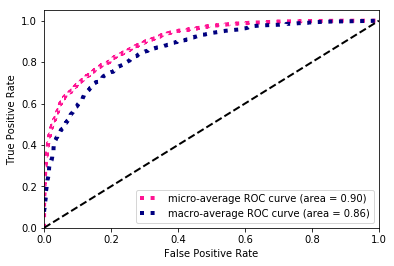

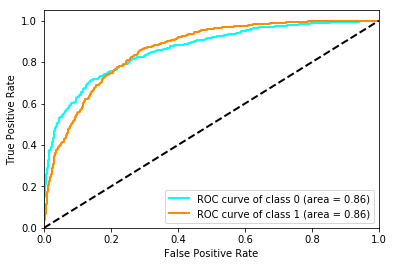

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.869726,0.600969,0.735348,0.803579,0.812982
precision,0.912058,0.526167,0.719112,0.803579,0.830583
recall,0.831149,0.700565,0.765857,0.803579,0.803579
support,1984.000000,531.000000,2515.000000,2515.000000,2515.000000
auc,0.862007,0.862007,0.862481,0.903185,NaN


******************** DNN ********************
**********  round  1
load and test: shapes for train and test, X/Y
(12085, 214)
(12085, 2)
(2515, 214)
(2515, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 214)               0         
_________________________________________________________________
dense_5 (Dense)              (None, 512)               110080    
_________________________________________________________________
dense_6 (Dense)              (None, 256)               131328    
_________________________________________________________________
batch_normalization_3 (Batch (None, 256)               1024      
_________________________________________________________________
activation_3 (Activation)    (None, 256)               0         
_________________________________________________________________
dropout_2 (Dropout)          (None, 256)         

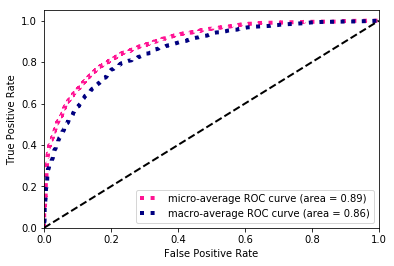

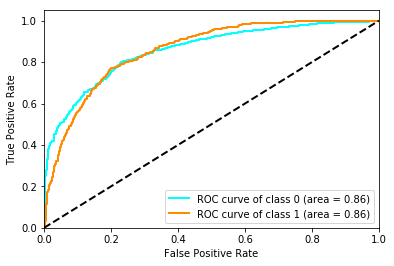

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.871146,0.604049,0.737597,0.805567,0.814753
precision,0.912755,0.529830,0.721292,0.805567,0.831907
recall,0.833165,0.702448,0.767807,0.805567,0.805567
support,1984.000000,531.000000,2515.000000,2515.000000,2515.000000
auc,0.857829,0.857829,0.858279,0.891199,NaN


******************** DNN ********************
**********  round  2
load and test: shapes for train and test, X/Y
(12085, 214)
(12085, 2)
(2515, 214)
(2515, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 214)               0         
_________________________________________________________________
dense_9 (Dense)              (None, 512)               110080    
_________________________________________________________________
dense_10 (Dense)             (None, 256)               131328    
_________________________________________________________________
batch_normalization_5 (Batch (None, 256)               1024      
_________________________________________________________________
activation_5 (Activation)    (None, 256)               0         
_________________________________________________________________
dropout_3 (Dropout)          (None, 256)         

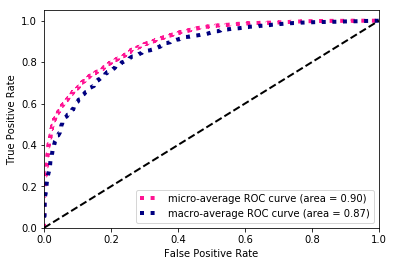

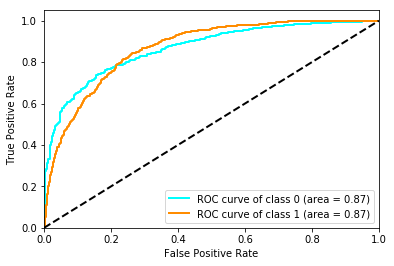

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.866259,0.603625,0.734942,0.800000,0.810808
precision,0.916714,0.518970,0.717842,0.800000,0.832737
recall,0.821069,0.721281,0.771175,0.800000,0.800000
support,1984.000000,531.000000,2515.000000,2515.000000,2515.000000
auc,0.866535,0.866535,0.866992,0.896516,NaN


******************** DNN ********************
**********  round  0
load and test: shapes for train and test, X/Y
(12085, 300)
(12085, 2)
(2515, 300)
(2515, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 300)               0         
_________________________________________________________________
dense_13 (Dense)             (None, 512)               154112    
_________________________________________________________________
dense_14 (Dense)             (None, 256)               131328    
_________________________________________________________________
batch_normalization_7 (Batch (None, 256)               1024      
_________________________________________________________________
activation_7 (Activation)    (None, 256)               0         
_________________________________________________________________
dropout_4 (Dropout)          (None, 256)         

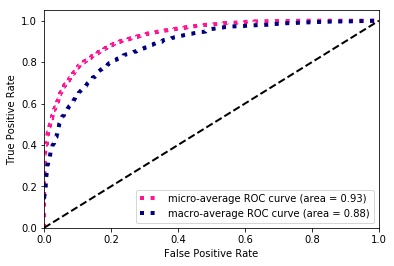

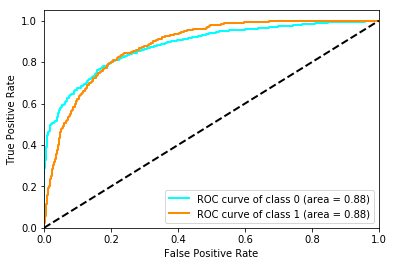

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.900596,0.602386,0.751491,0.840954,0.837634
precision,0.888235,0.637895,0.763065,0.840954,0.835380
recall,0.913306,0.570621,0.741964,0.840954,0.840954
support,1984.000000,531.000000,2515.000000,2515.000000,2515.000000
auc,0.881081,0.881081,0.881522,0.926733,NaN


******************** DNN ********************
**********  round  1
load and test: shapes for train and test, X/Y
(12085, 300)
(12085, 2)
(2515, 300)
(2515, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 300)               0         
_________________________________________________________________
dense_17 (Dense)             (None, 512)               154112    
_________________________________________________________________
dense_18 (Dense)             (None, 256)               131328    
_________________________________________________________________
batch_normalization_9 (Batch (None, 256)               1024      
_________________________________________________________________
activation_9 (Activation)    (None, 256)               0         
_________________________________________________________________
dropout_5 (Dropout)          (None, 256)         

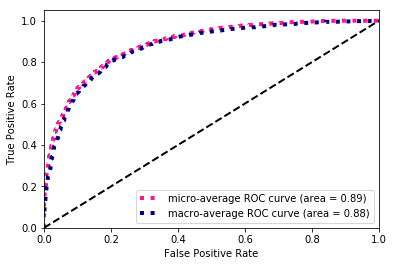

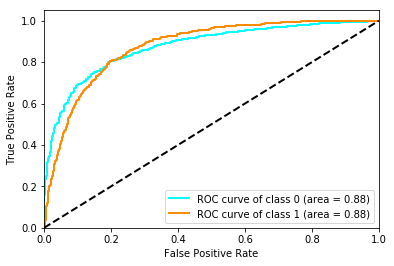

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.868556,0.632453,0.750504,0.806362,0.818707
precision,0.934922,0.527708,0.731315,0.806362,0.848945
recall,0.810988,0.789077,0.800033,0.806362,0.806362
support,1984.000000,531.000000,2515.000000,2515.000000,2515.000000
auc,0.875730,0.875730,0.876185,0.888380,NaN


******************** DNN ********************
**********  round  2
load and test: shapes for train and test, X/Y
(12085, 300)
(12085, 2)
(2515, 300)
(2515, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 300)               0         
_________________________________________________________________
dense_21 (Dense)             (None, 512)               154112    
_________________________________________________________________
dense_22 (Dense)             (None, 256)               131328    
_________________________________________________________________
batch_normalization_11 (Batc (None, 256)               1024      
_________________________________________________________________
activation_11 (Activation)   (None, 256)               0         
_________________________________________________________________
dropout_6 (Dropout)          (None, 256)         

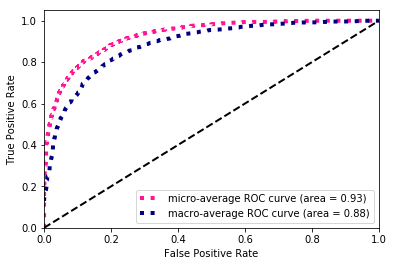

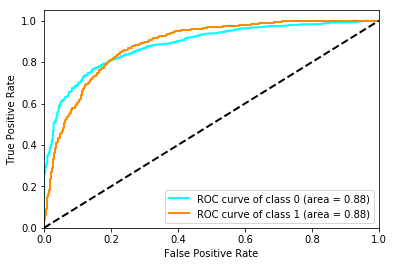

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.900349,0.606299,0.753324,0.840954,0.838265
precision,0.890148,0.635052,0.762600,0.840954,0.836288
recall,0.910786,0.580038,0.745412,0.840954,0.840954
support,1984.000000,531.000000,2515.000000,2515.000000,2515.000000
auc,0.883753,0.883752,0.884222,0.928080,NaN


******************** DNN ********************
**********  round  0
load and test: shapes for train and test, X/Y
(12085, 250)
(12085, 2)
(2515, 250)
(2515, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 250)               0         
_________________________________________________________________
dense_25 (Dense)             (None, 512)               128512    
_________________________________________________________________
dense_26 (Dense)             (None, 256)               131328    
_________________________________________________________________
batch_normalization_13 (Batc (None, 256)               1024      
_________________________________________________________________
activation_13 (Activation)   (None, 256)               0         
_________________________________________________________________
dropout_7 (Dropout)          (None, 256)         

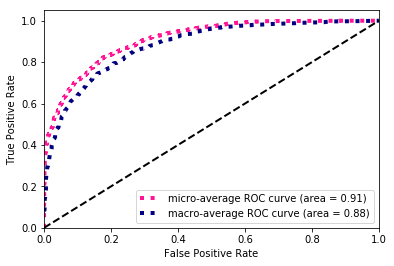

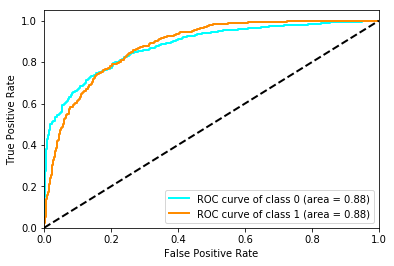

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.882585,0.634505,0.758545,0.822266,0.830207
precision,0.921558,0.560694,0.741126,0.822266,0.845367
recall,0.846774,0.730697,0.788735,0.822266,0.822266
support,1984.000000,531.000000,2515.000000,2515.000000,2515.000000
auc,0.880288,0.880288,0.880744,0.909550,NaN


******************** DNN ********************
**********  round  1
load and test: shapes for train and test, X/Y
(12085, 250)
(12085, 2)
(2515, 250)
(2515, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 250)               0         
_________________________________________________________________
dense_29 (Dense)             (None, 512)               128512    
_________________________________________________________________
dense_30 (Dense)             (None, 256)               131328    
_________________________________________________________________
batch_normalization_15 (Batc (None, 256)               1024      
_________________________________________________________________
activation_15 (Activation)   (None, 256)               0         
_________________________________________________________________
dropout_8 (Dropout)          (None, 256)         

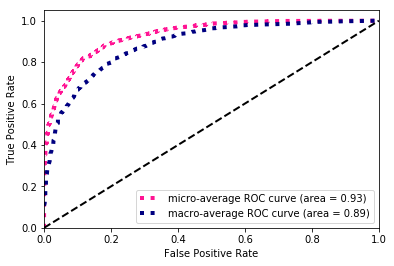

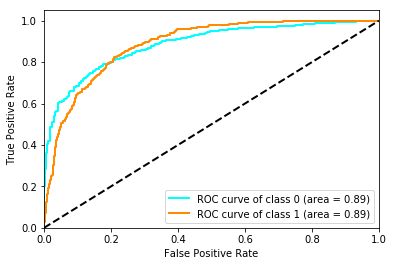

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.905185,0.608163,0.756674,0.847316,0.842474
precision,0.887222,0.663697,0.775459,0.847316,0.840028
recall,0.923891,0.561205,0.742548,0.847316,0.847316
support,1984.000000,531.000000,2515.000000,2515.000000,2515.000000
auc,0.885944,0.885944,0.886375,0.930002,NaN


******************** DNN ********************
**********  round  2
load and test: shapes for train and test, X/Y
(12085, 250)
(12085, 2)
(2515, 250)
(2515, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 250)               0         
_________________________________________________________________
dense_33 (Dense)             (None, 512)               128512    
_________________________________________________________________
dense_34 (Dense)             (None, 256)               131328    
_________________________________________________________________
batch_normalization_17 (Batc (None, 256)               1024      
_________________________________________________________________
activation_17 (Activation)   (None, 256)               0         
_________________________________________________________________
dropout_9 (Dropout)          (None, 256)         

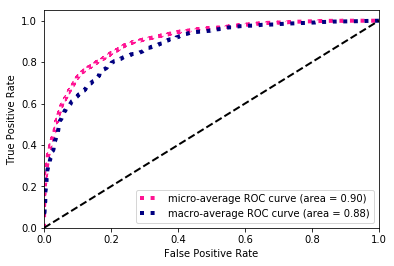

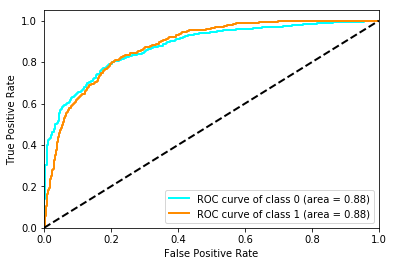

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.882230,0.620805,0.751518,0.820278,0.827035
precision,0.913161,0.559758,0.736459,0.820278,0.838546
recall,0.853327,0.696798,0.775063,0.820278,0.820278
support,1984.000000,531.000000,2515.000000,2515.000000,2515.000000
auc,0.876933,0.876933,0.877373,0.904678,NaN


******************** DNN ********************
**********  round  0
load and test: shapes for train and test, X/Y
(12085, 234)
(12085, 2)
(2515, 234)
(2515, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 234)               0         
_________________________________________________________________
dense_37 (Dense)             (None, 512)               120320    
_________________________________________________________________
dense_38 (Dense)             (None, 256)               131328    
_________________________________________________________________
batch_normalization_19 (Batc (None, 256)               1024      
_________________________________________________________________
activation_19 (Activation)   (None, 256)               0         
_________________________________________________________________
dropout_10 (Dropout)         (None, 256)         

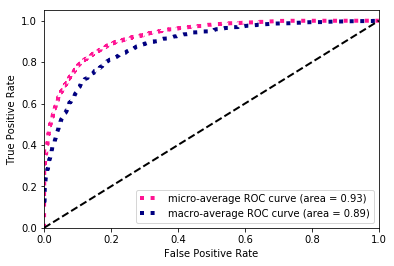

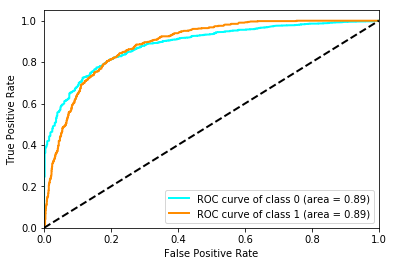

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.904192,0.624266,0.764229,0.847316,0.845090
precision,0.895257,0.649695,0.772476,0.847316,0.843411
recall,0.913306,0.600753,0.757030,0.847316,0.847316
support,1984.000000,531.000000,2515.000000,2515.000000,2515.000000
auc,0.886077,0.886077,0.886367,0.927117,NaN


******************** DNN ********************
**********  round  1
load and test: shapes for train and test, X/Y
(12085, 234)
(12085, 2)
(2515, 234)
(2515, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 234)               0         
_________________________________________________________________
dense_41 (Dense)             (None, 512)               120320    
_________________________________________________________________
dense_42 (Dense)             (None, 256)               131328    
_________________________________________________________________
batch_normalization_21 (Batc (None, 256)               1024      
_________________________________________________________________
activation_21 (Activation)   (None, 256)               0         
_________________________________________________________________
dropout_11 (Dropout)         (None, 256)         

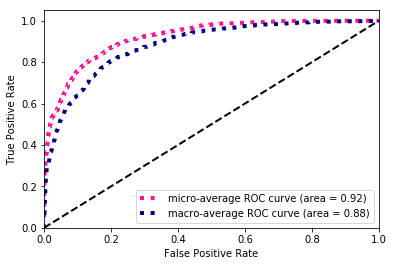

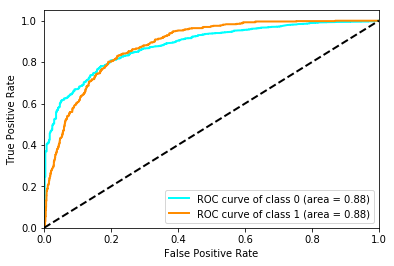

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.892457,0.618445,0.755451,0.832207,0.834604
precision,0.902577,0.594783,0.748680,0.832207,0.837592
recall,0.882560,0.644068,0.763314,0.832207,0.832207
support,1984.000000,531.000000,2515.000000,2515.000000,2515.000000
auc,0.882121,0.882121,0.882420,0.920083,NaN


******************** DNN ********************
**********  round  2
load and test: shapes for train and test, X/Y
(12085, 234)
(12085, 2)
(2515, 234)
(2515, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 234)               0         
_________________________________________________________________
dense_45 (Dense)             (None, 512)               120320    
_________________________________________________________________
dense_46 (Dense)             (None, 256)               131328    
_________________________________________________________________
batch_normalization_23 (Batc (None, 256)               1024      
_________________________________________________________________
activation_23 (Activation)   (None, 256)               0         
_________________________________________________________________
dropout_12 (Dropout)         (None, 256)         

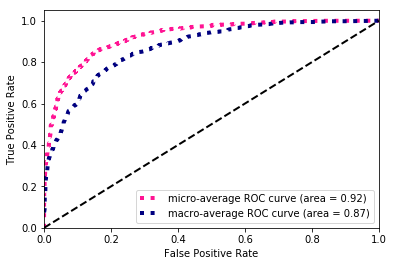

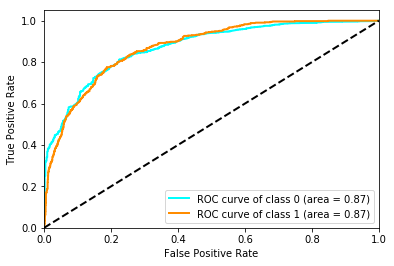

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.905697,0.599165,0.752431,0.847316,0.840978
precision,0.883142,0.672131,0.777636,0.847316,0.838590
recall,0.929435,0.540490,0.734963,0.847316,0.847316
support,1984.000000,531.000000,2515.000000,2515.000000,2515.000000
auc,0.871365,0.871365,0.871654,0.923684,NaN


******************** DNN ********************
**********  round  0
load and test: shapes for train and test, X/Y
(12085, 258)
(12085, 2)
(2515, 258)
(2515, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 258)               0         
_________________________________________________________________
dense_49 (Dense)             (None, 512)               132608    
_________________________________________________________________
dense_50 (Dense)             (None, 256)               131328    
_________________________________________________________________
batch_normalization_25 (Batc (None, 256)               1024      
_________________________________________________________________
activation_25 (Activation)   (None, 256)               0         
_________________________________________________________________
dropout_13 (Dropout)         (None, 256)         

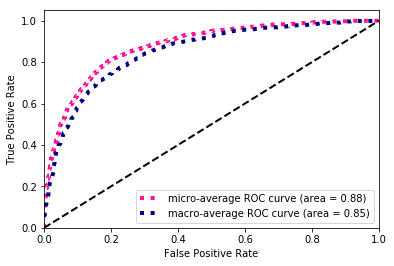

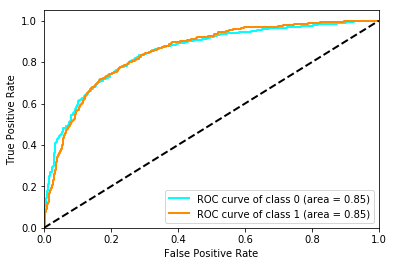

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.870899,0.609600,0.740250,0.805964,0.815730
precision,0.916481,0.529903,0.723192,0.805964,0.834862
recall,0.829637,0.717514,0.773576,0.805964,0.805964
support,1984.000000,531.000000,2515.000000,2515.000000,2515.000000
auc,0.849467,0.849467,0.849928,0.877948,NaN


******************** DNN ********************
**********  round  1
load and test: shapes for train and test, X/Y
(12085, 258)
(12085, 2)
(2515, 258)
(2515, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 258)               0         
_________________________________________________________________
dense_53 (Dense)             (None, 512)               132608    
_________________________________________________________________
dense_54 (Dense)             (None, 256)               131328    
_________________________________________________________________
batch_normalization_27 (Batc (None, 256)               1024      
_________________________________________________________________
activation_27 (Activation)   (None, 256)               0         
_________________________________________________________________
dropout_14 (Dropout)         (None, 256)         

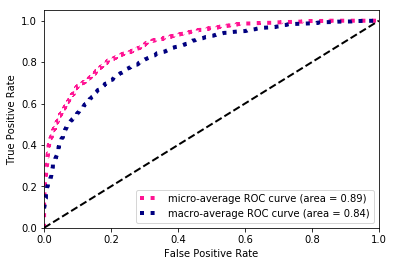

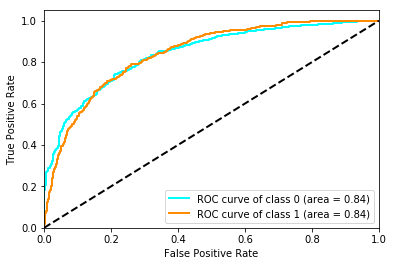

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.874448,0.591716,0.733082,0.807952,0.814754
precision,0.902845,0.536810,0.719827,0.807952,0.825563
recall,0.847782,0.659134,0.753458,0.807952,0.807952
support,1984.000000,531.000000,2515.000000,2515.000000,2515.000000
auc,0.841864,0.841864,0.842353,0.893570,NaN


******************** DNN ********************
**********  round  2
load and test: shapes for train and test, X/Y
(12085, 258)
(12085, 2)
(2515, 258)
(2515, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 258)               0         
_________________________________________________________________
dense_57 (Dense)             (None, 512)               132608    
_________________________________________________________________
dense_58 (Dense)             (None, 256)               131328    
_________________________________________________________________
batch_normalization_29 (Batc (None, 256)               1024      
_________________________________________________________________
activation_29 (Activation)   (None, 256)               0         
_________________________________________________________________
dropout_15 (Dropout)         (None, 256)         

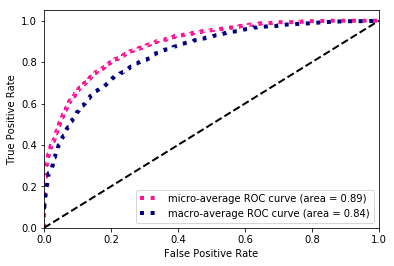

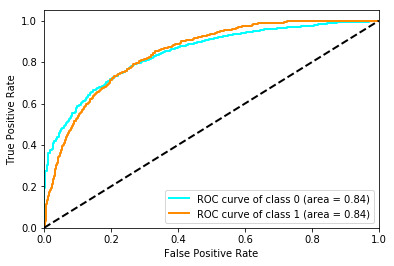

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.868634,0.581182,0.724908,0.800000,0.807943
precision,0.901355,0.520896,0.711125,0.800000,0.821027
recall,0.838206,0.657250,0.747728,0.800000,0.800000
support,1984.000000,531.000000,2515.000000,2515.000000,2515.000000
auc,0.843823,0.843823,0.844324,0.886675,NaN


******************** DNN ********************
**********  round  0
load and test: shapes for train and test, X/Y
(12085, 136)
(12085, 2)
(2515, 136)
(2515, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 136)               0         
_________________________________________________________________
dense_61 (Dense)             (None, 512)               70144     
_________________________________________________________________
dense_62 (Dense)             (None, 256)               131328    
_________________________________________________________________
batch_normalization_31 (Batc (None, 256)               1024      
_________________________________________________________________
activation_31 (Activation)   (None, 256)               0         
_________________________________________________________________
dropout_16 (Dropout)         (None, 256)         

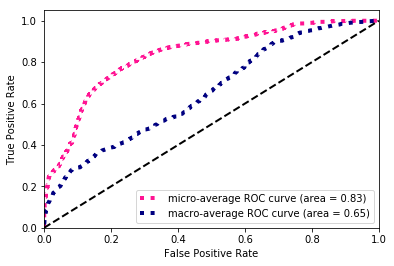

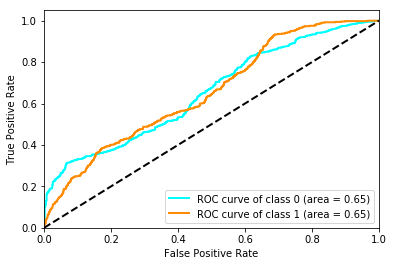

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.861237,0.310795,0.586016,0.768986,0.745021
precision,0.818429,0.419872,0.619151,0.768986,0.734281
recall,0.908770,0.246704,0.577737,0.768986,0.768986
support,1984.000000,531.000000,2515.000000,2515.000000,2515.000000
auc,0.654197,0.654197,0.654589,0.833514,NaN


******************** DNN ********************
**********  round  1
load and test: shapes for train and test, X/Y
(12085, 136)
(12085, 2)
(2515, 136)
(2515, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 136)               0         
_________________________________________________________________
dense_65 (Dense)             (None, 512)               70144     
_________________________________________________________________
dense_66 (Dense)             (None, 256)               131328    
_________________________________________________________________
batch_normalization_33 (Batc (None, 256)               1024      
_________________________________________________________________
activation_33 (Activation)   (None, 256)               0         
_________________________________________________________________
dropout_17 (Dropout)         (None, 256)         

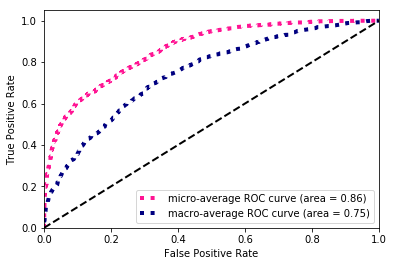

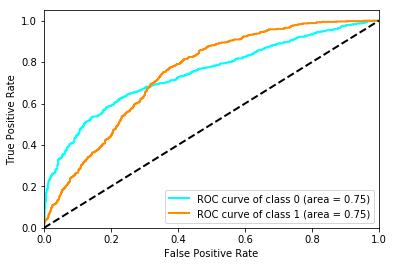

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.851816,0.366876,0.609346,0.759841,0.749429
precision,0.829828,0.413712,0.621770,0.759841,0.741972
recall,0.875000,0.329567,0.602283,0.759841,0.759841
support,1984.000000,531.000000,2515.000000,2515.000000,2515.000000
auc,0.745739,0.745739,0.746133,0.860029,NaN


******************** DNN ********************
**********  round  2
load and test: shapes for train and test, X/Y
(12085, 136)
(12085, 2)
(2515, 136)
(2515, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 136)               0         
_________________________________________________________________
dense_69 (Dense)             (None, 512)               70144     
_________________________________________________________________
dense_70 (Dense)             (None, 256)               131328    
_________________________________________________________________
batch_normalization_35 (Batc (None, 256)               1024      
_________________________________________________________________
activation_35 (Activation)   (None, 256)               0         
_________________________________________________________________
dropout_18 (Dropout)         (None, 256)         

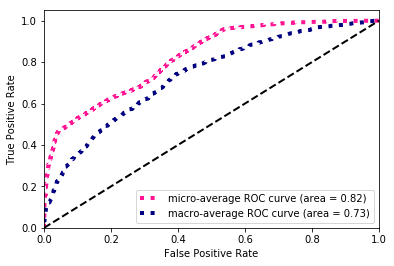

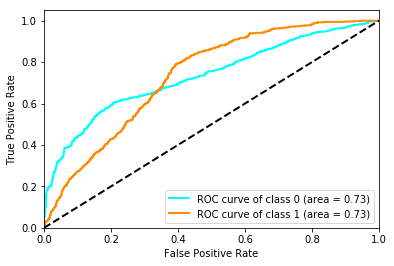

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.797855,0.420000,0.608928,0.700199,0.718077
precision,0.852234,0.355007,0.603620,0.700199,0.747253
recall,0.750000,0.514124,0.632062,0.700199,0.700199
support,1984.000000,531.000000,2515.000000,2515.000000,2515.000000
auc,0.733358,0.733358,0.733779,0.822207,NaN


In [17]:
Atlanta = compare_models(classname='DNN')

In [18]:
Atlanta.to_hdf('Atlanta.h5',key='DNN')
Atlanta

,NL,geohash,traffic,weather,time,geo
0_f1-score,0.869044,0.889834,0.890000,0.900782,0.871327,0.836969
1_f1-score,0.602881,0.613713,0.621158,0.613959,0.594166,0.365890
weighted avg_f1-score,0.812848,0.831535,0.833239,0.840224,0.812809,0.737509
micro avg_f1-score,0.803048,0.829423,0.829954,0.842280,0.804639,0.743009
macro avg_f1-score,0.735962,0.751773,0.755579,0.757370,0.732747,0.601430
0_precision,0.913842,0.904435,0.907313,0.893659,0.906894,0.833497
1_precision,0.524989,0.600218,0.594716,0.638869,0.529203,0.396197
weighted avg_precision,0.831742,0.840205,0.841314,0.839864,0.827151,0.741168
micro avg_precision,0.803048,0.829423,0.829954,0.842280,0.804639,0.743009
macro avg_precision,0.719416,0.752326,0.751015,0.766264,0.718048,0.614847


******************** RNN_wo_NLP ********************
**********  round  0
load and test: shapes for train and test, X/Y
(12085, 314)
(12085, 2)
(2515, 314)
(2515, 2)
(12085, 8, 25)
(12085, 14)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 25)        0                                            
__________________________________________________________________________________________________
lstm_1 (LSTM)                   (None, 8, 128)       78848       main_input[0][0]                 
__________________________________________________________________________________________________
geohash_input (InputLayer)      (None, 14)           0                                            
__________________________________________________________________________________________________
lstm_2 (LSTM)  

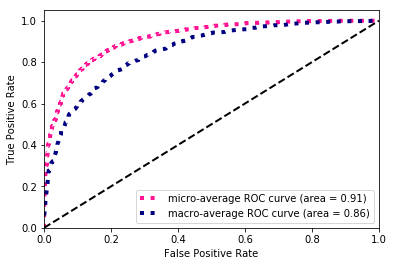

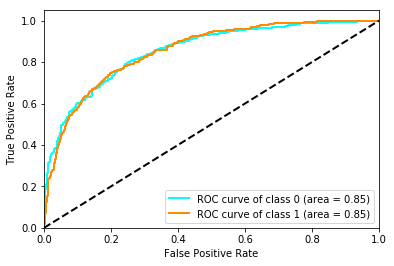

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.893350,0.593301,0.743326,0.831014,0.830000
precision,0.889555,0.603113,0.746334,0.831014,0.829078
recall,0.897177,0.583804,0.740491,0.831014,0.831014
support,1984.000000,531.000000,2515.000000,2515.000000,2515.000000
auc,0.854674,0.854674,0.855181,0.914531,NaN


******************** RNN_wo_NLP ********************
**********  round  1
load and test: shapes for train and test, X/Y
(12085, 314)
(12085, 2)
(2515, 314)
(2515, 2)
(12085, 8, 25)
(12085, 14)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 25)        0                                            
__________________________________________________________________________________________________
lstm_3 (LSTM)                   (None, 8, 128)       78848       main_input[0][0]                 
__________________________________________________________________________________________________
geohash_input (InputLayer)      (None, 14)           0                                            
__________________________________________________________________________________________________
lstm_4 (LSTM)  

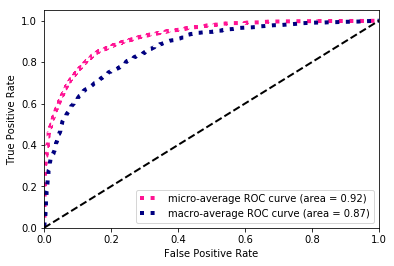

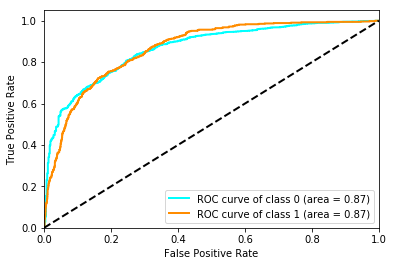

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.904164,0.599382,0.751773,0.845328,0.839814
precision,0.884337,0.661364,0.772850,0.845328,0.837260
recall,0.924899,0.548023,0.736461,0.845328,0.845328
support,1984.000000,531.000000,2515.000000,2515.000000,2515.000000
auc,0.865781,0.865781,0.866271,0.920923,NaN


******************** RNN_wo_NLP ********************
**********  round  2
load and test: shapes for train and test, X/Y
(12085, 314)
(12085, 2)
(2515, 314)
(2515, 2)
(12085, 8, 25)
(12085, 14)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 25)        0                                            
__________________________________________________________________________________________________
lstm_5 (LSTM)                   (None, 8, 128)       78848       main_input[0][0]                 
__________________________________________________________________________________________________
geohash_input (InputLayer)      (None, 14)           0                                            
__________________________________________________________________________________________________
lstm_6 (LSTM)  

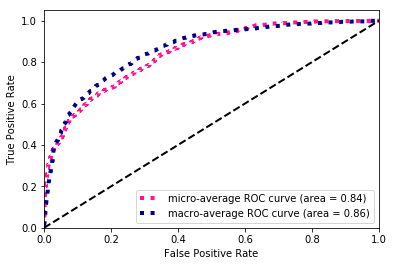

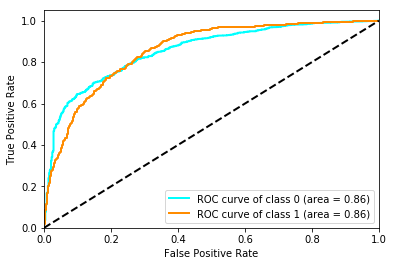

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.811785,0.571056,0.691420,0.738370,0.760959
precision,0.938492,0.436690,0.687591,0.738370,0.832545
recall,0.715222,0.824859,0.770040,0.738370,0.738370
support,1984.000000,531.000000,2515.000000,2515.000000,2515.000000
auc,0.856160,0.856160,0.856702,0.841756,NaN


******************** RNN_wo_geohash ********************
**********  round  0
load and test: shapes for train and test, X/Y
(12085, 314)
(12085, 2)
(2515, 314)
(2515, 2)
(12085, 8, 25)
(12085, 100)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 25)        0                                            
__________________________________________________________________________________________________
lstm_7 (LSTM)                   (None, 8, 128)       78848       main_input[0][0]                 
__________________________________________________________________________________________________
nlp_input (InputLayer)          (None, 100)          0                                            
__________________________________________________________________________________________________
lstm_8 (LS

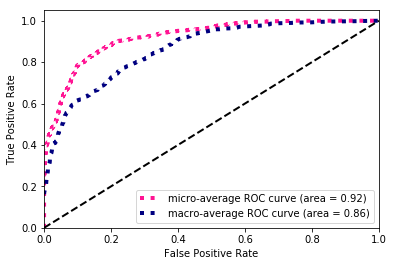

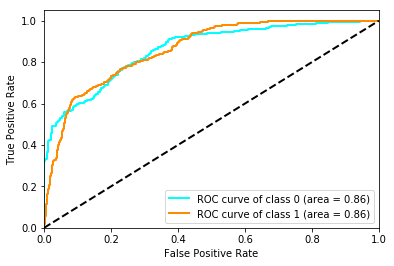

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.905095,0.557930,0.731513,0.843738,0.831797
precision,0.868799,0.692737,0.780768,0.843738,0.831627
recall,0.944556,0.467043,0.705800,0.843738,0.843738
support,1984.000000,531.000000,2515.000000,2515.000000,2515.000000
auc,0.861326,0.861326,0.861766,0.920151,NaN


******************** RNN_wo_geohash ********************
**********  round  1
load and test: shapes for train and test, X/Y
(12085, 314)
(12085, 2)
(2515, 314)
(2515, 2)
(12085, 8, 25)
(12085, 100)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 25)        0                                            
__________________________________________________________________________________________________
lstm_9 (LSTM)                   (None, 8, 128)       78848       main_input[0][0]                 
__________________________________________________________________________________________________
nlp_input (InputLayer)          (None, 100)          0                                            
__________________________________________________________________________________________________
lstm_10 (L

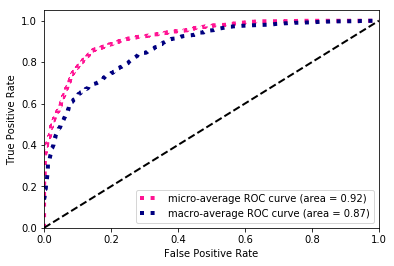

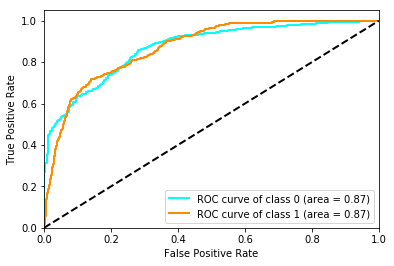

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.909363,0.641026,0.775194,0.855268,0.852708
precision,0.898622,0.672878,0.785750,0.855268,0.850960
recall,0.920363,0.612053,0.766208,0.855268,0.855268
support,1984.000000,531.000000,2515.000000,2515.000000,2515.000000
auc,0.871202,0.871202,0.871662,0.922648,NaN


******************** RNN_wo_geohash ********************
**********  round  2
load and test: shapes for train and test, X/Y
(12085, 314)
(12085, 2)
(2515, 314)
(2515, 2)
(12085, 8, 25)
(12085, 100)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 25)        0                                            
__________________________________________________________________________________________________
lstm_11 (LSTM)                  (None, 8, 128)       78848       main_input[0][0]                 
__________________________________________________________________________________________________
nlp_input (InputLayer)          (None, 100)          0                                            
__________________________________________________________________________________________________
lstm_12 (L

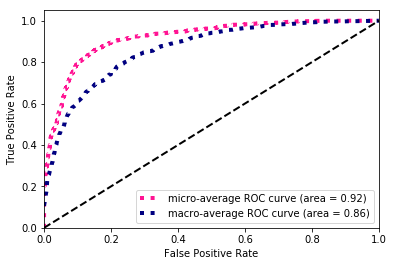

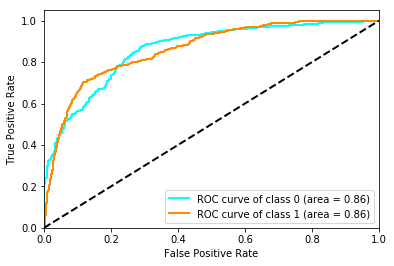

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.908552,0.623984,0.766268,0.852883,0.848470
precision,0.891368,0.677704,0.784536,0.852883,0.846256
recall,0.926411,0.578154,0.752283,0.852883,0.852883
support,1984.000000,531.000000,2515.000000,2515.000000,2515.000000
auc,0.861377,0.861377,0.861895,0.918325,NaN


******************** RNN ********************
**********  round  0
load and test: shapes for train and test, X/Y
(12085, 250)
(12085, 2)
(2515, 250)
(2515, 2)
(12085, 8, 17)
(12085, 14)
(12085, 100)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 17)        0                                            
__________________________________________________________________________________________________
lstm_13 (LSTM)                  (None, 8, 128)       74752       main_input[0][0]                 
__________________________________________________________________________________________________
geohash_input (InputLayer)      (None, 14)           0                                            
__________________________________________________________________________________________________
nlp_input

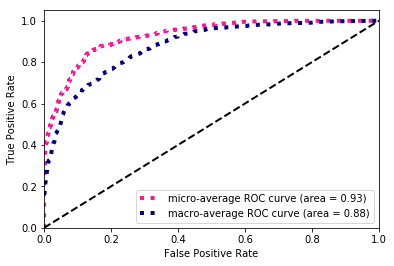

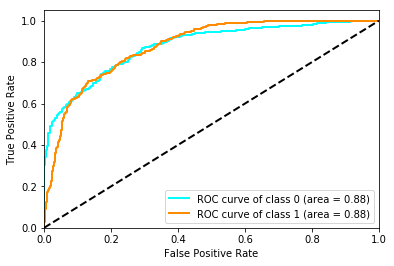

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.910979,0.634888,0.772934,0.856859,0.852687
precision,0.894175,0.687912,0.791043,0.856859,0.850626
recall,0.928427,0.589454,0.758941,0.856859,0.856859
support,1984.000000,531.000000,2515.000000,2515.000000,2515.000000
auc,0.876988,0.876988,0.877462,0.926610,NaN


******************** RNN ********************
**********  round  1
load and test: shapes for train and test, X/Y
(12085, 250)
(12085, 2)
(2515, 250)
(2515, 2)
(12085, 8, 17)
(12085, 14)
(12085, 100)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 17)        0                                            
__________________________________________________________________________________________________
lstm_15 (LSTM)                  (None, 8, 128)       74752       main_input[0][0]                 
__________________________________________________________________________________________________
geohash_input (InputLayer)      (None, 14)           0                                            
__________________________________________________________________________________________________
nlp_input

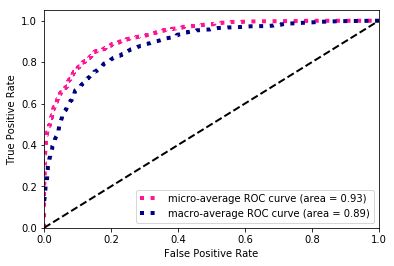

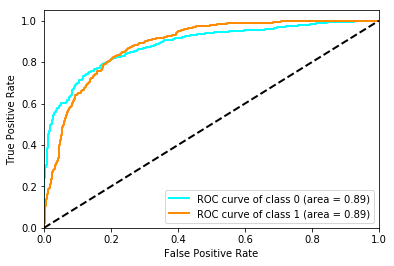

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.904702,0.640076,0.772389,0.849304,0.848831
precision,0.902659,0.645594,0.774127,0.849304,0.848384
recall,0.906754,0.634652,0.770703,0.849304,0.849304
support,1984.000000,531.000000,2515.000000,2515.000000,2515.000000
auc,0.885738,0.885738,0.886224,0.927404,NaN


******************** RNN ********************
**********  round  2
load and test: shapes for train and test, X/Y
(12085, 250)
(12085, 2)
(2515, 250)
(2515, 2)
(12085, 8, 17)
(12085, 14)
(12085, 100)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 17)        0                                            
__________________________________________________________________________________________________
lstm_17 (LSTM)                  (None, 8, 128)       74752       main_input[0][0]                 
__________________________________________________________________________________________________
geohash_input (InputLayer)      (None, 14)           0                                            
__________________________________________________________________________________________________
nlp_input

Epoch 42/60
 - 2s - loss: 0.2715 - f1_score: 0.6324 - val_loss: 0.3957 - val_f1_score: 0.5585
Epoch 43/60
 - 2s - loss: 0.2705 - f1_score: 0.6304 - val_loss: 0.4182 - val_f1_score: 0.5176
Epoch 44/60
 - 2s - loss: 0.2721 - f1_score: 0.6312 - val_loss: 0.4501 - val_f1_score: 0.4973
Epoch 45/60
 - 2s - loss: 0.2704 - f1_score: 0.6390 - val_loss: 0.3680 - val_f1_score: 0.2405
Epoch 46/60
 - 2s - loss: 0.2705 - f1_score: 0.6360 - val_loss: 0.3515 - val_f1_score: 0.5024
Epoch 47/60
 - 2s - loss: 0.2706 - f1_score: 0.6368 - val_loss: 0.7786 - val_f1_score: 0.0270
Epoch 48/60
 - 2s - loss: 0.2705 - f1_score: 0.6395 - val_loss: 0.3654 - val_f1_score: 0.5026
Epoch 49/60
 - 2s - loss: 0.2710 - f1_score: 0.6348 - val_loss: 0.3540 - val_f1_score: 0.5042
Epoch 50/60
 - 2s - loss: 0.2701 - f1_score: 0.6215 - val_loss: 0.3663 - val_f1_score: 0.5366
Epoch 51/60
 - 2s - loss: 0.2692 - f1_score: 0.6445 - val_loss: 0.3931 - val_f1_score: 0.4883
Epoch 52/60
 - 2s - loss: 0.2702 - f1_score: 0.6414 - val_lo

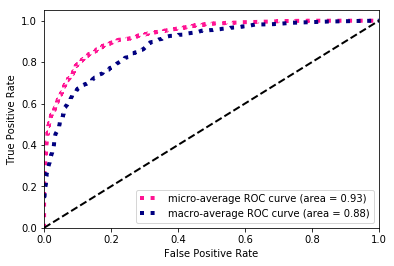

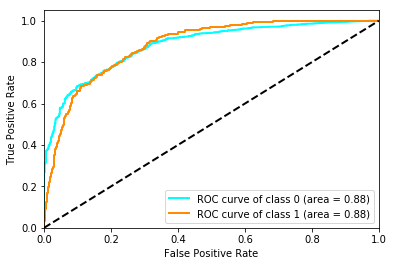

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.907166,0.610939,0.759052,0.850099,0.844622
precision,0.886856,0.675799,0.781328,0.850099,0.842295
recall,0.928427,0.557439,0.742933,0.850099,0.850099
support,1984.000000,531.000000,2515.000000,2515.000000,2515.000000
auc,0.881110,0.881110,0.881518,0.929324,NaN


******************** RNN ********************
**********  round  0
load and test: shapes for train and test, X/Y
(12085, 234)
(12085, 2)
(2515, 234)
(2515, 2)
(12085, 8, 15)
(12085, 14)
(12085, 100)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 15)        0                                            
__________________________________________________________________________________________________
lstm_19 (LSTM)                  (None, 8, 128)       73728       main_input[0][0]                 
__________________________________________________________________________________________________
geohash_input (InputLayer)      (None, 14)           0                                            
__________________________________________________________________________________________________
nlp_input

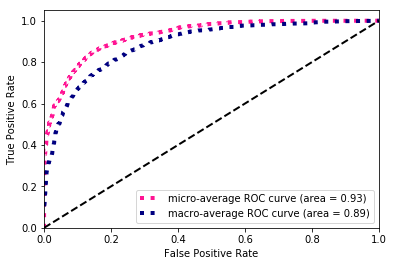

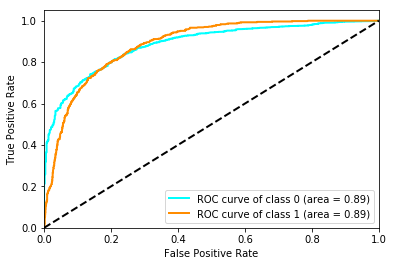

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.906227,0.636275,0.771251,0.850895,0.849231
precision,0.899256,0.656000,0.777628,0.850895,0.847896
recall,0.913306,0.617702,0.765504,0.850895,0.850895
support,1984.000000,531.000000,2515.000000,2515.000000,2515.000000
auc,0.885908,0.885908,0.886193,0.928802,NaN


******************** RNN ********************
**********  round  1
load and test: shapes for train and test, X/Y
(12085, 234)
(12085, 2)
(2515, 234)
(2515, 2)
(12085, 8, 15)
(12085, 14)
(12085, 100)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 15)        0                                            
__________________________________________________________________________________________________
lstm_21 (LSTM)                  (None, 8, 128)       73728       main_input[0][0]                 
__________________________________________________________________________________________________
geohash_input (InputLayer)      (None, 14)           0                                            
__________________________________________________________________________________________________
nlp_input

Epoch 43/60
 - 2s - loss: 0.2680 - f1_score: 0.6445 - val_loss: 0.3773 - val_f1_score: 0.4939
Epoch 44/60
 - 2s - loss: 0.2718 - f1_score: 0.6386 - val_loss: 0.3497 - val_f1_score: 0.4423
Epoch 45/60
 - 2s - loss: 0.2695 - f1_score: 0.6327 - val_loss: 0.5135 - val_f1_score: 0.1481
Epoch 46/60
 - 2s - loss: 0.2634 - f1_score: 0.6461 - val_loss: 0.4222 - val_f1_score: 0.5201
Epoch 47/60
 - 2s - loss: 0.2660 - f1_score: 0.6336 - val_loss: 0.5402 - val_f1_score: 0.0000e+00
Epoch 48/60
 - 2s - loss: 0.2670 - f1_score: 0.6420 - val_loss: 0.4093 - val_f1_score: 0.0000e+00
Epoch 49/60
 - 2s - loss: 0.2723 - f1_score: 0.6232 - val_loss: 0.9132 - val_f1_score: 0.0000e+00
Epoch 50/60
 - 2s - loss: 0.2695 - f1_score: 0.6328 - val_loss: 0.8036 - val_f1_score: 0.0000e+00
Epoch 51/60
 - 2s - loss: 0.2663 - f1_score: 0.6428 - val_loss: 0.3452 - val_f1_score: 0.1128
Epoch 52/60
 - 2s - loss: 0.2680 - f1_score: 0.6266 - val_loss: 0.3783 - val_f1_score: 0.3978


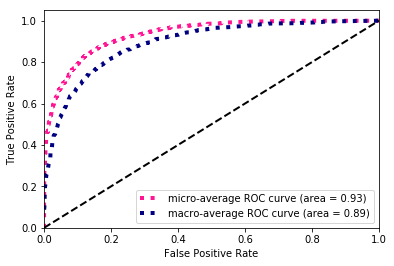

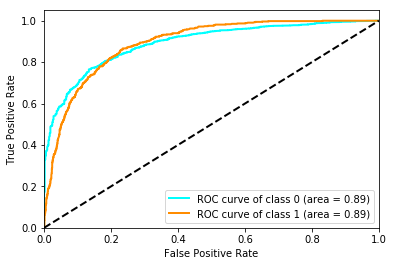

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.909804,0.612632,0.761218,0.853678,0.847061
precision,0.885496,0.694511,0.790003,0.853678,0.845173
recall,0.935484,0.548023,0.741753,0.853678,0.853678
support,1984.000000,531.000000,2515.000000,2515.000000,2515.000000
auc,0.891017,0.891012,0.891300,0.933997,NaN


******************** RNN ********************
**********  round  2
load and test: shapes for train and test, X/Y
(12085, 234)
(12085, 2)
(2515, 234)
(2515, 2)
(12085, 8, 15)
(12085, 14)
(12085, 100)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 15)        0                                            
__________________________________________________________________________________________________
lstm_23 (LSTM)                  (None, 8, 128)       73728       main_input[0][0]                 
__________________________________________________________________________________________________
geohash_input (InputLayer)      (None, 14)           0                                            
__________________________________________________________________________________________________
nlp_input

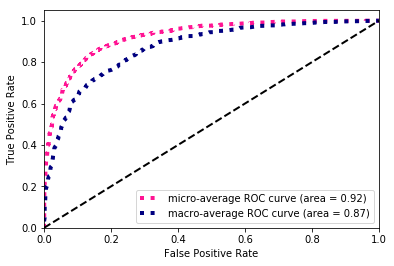

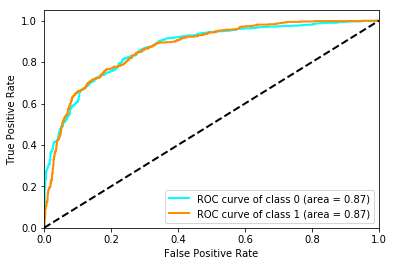

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.907689,0.565267,0.736478,0.847714,0.835392
precision,0.869746,0.711429,0.790587,0.847714,0.836320
recall,0.949093,0.468927,0.709010,0.847714,0.847714
support,1984.000000,531.000000,2515.000000,2515.000000,2515.000000
auc,0.869398,0.869399,0.869722,0.924117,NaN


******************** RNN ********************
**********  round  0
load and test: shapes for train and test, X/Y
(12085, 258)
(12085, 2)
(2515, 258)
(2515, 2)
(12085, 8, 18)
(12085, 14)
(12085, 100)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 18)        0                                            
__________________________________________________________________________________________________
lstm_25 (LSTM)                  (None, 8, 128)       75264       main_input[0][0]                 
__________________________________________________________________________________________________
geohash_input (InputLayer)      (None, 14)           0                                            
__________________________________________________________________________________________________
nlp_input

Epoch 43/60
 - 2s - loss: 0.3046 - f1_score: 0.5678 - val_loss: 0.3478 - val_f1_score: 0.2268
Epoch 44/60
 - 2s - loss: 0.3022 - f1_score: 0.5711 - val_loss: 0.3676 - val_f1_score: 0.2675
Epoch 45/60
 - 2s - loss: 0.3032 - f1_score: 0.5828 - val_loss: 0.3383 - val_f1_score: 0.2018
Epoch 46/60
 - 2s - loss: 0.3014 - f1_score: 0.5733 - val_loss: 0.3685 - val_f1_score: 0.2632
Epoch 47/60
 - 2s - loss: 0.3021 - f1_score: 0.5785 - val_loss: 0.3664 - val_f1_score: 0.0771
Epoch 48/60
 - 2s - loss: 0.2995 - f1_score: 0.5884 - val_loss: 0.3995 - val_f1_score: 0.4448
Epoch 49/60
 - 2s - loss: 0.3033 - f1_score: 0.5767 - val_loss: 0.3890 - val_f1_score: 0.2409
Epoch 50/60
 - 2s - loss: 0.3021 - f1_score: 0.5729 - val_loss: 0.3437 - val_f1_score: 0.2612
Epoch 51/60
 - 2s - loss: 0.3018 - f1_score: 0.5856 - val_loss: 0.4911 - val_f1_score: 0.2262
Epoch 52/60
 - 2s - loss: 0.3022 - f1_score: 0.5707 - val_loss: 0.3656 - val_f1_score: 0.3027


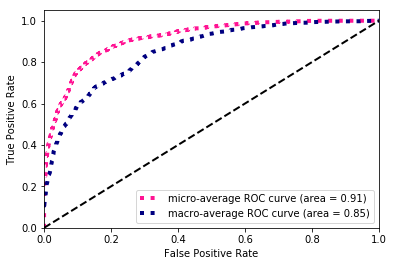

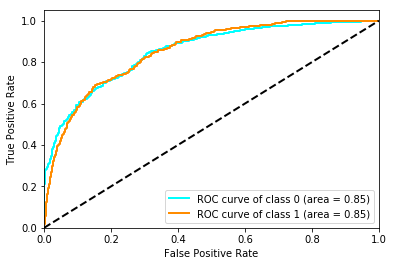

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.900662,0.575026,0.737844,0.838966,0.831910
precision,0.877210,0.649289,0.763249,0.838966,0.829088
recall,0.925403,0.516008,0.720705,0.838966,0.838966
support,1984.000000,531.000000,2515.000000,2515.000000,2515.000000
auc,0.852476,0.852476,0.852930,0.914676,NaN


******************** RNN ********************
**********  round  1
load and test: shapes for train and test, X/Y
(12085, 258)
(12085, 2)
(2515, 258)
(2515, 2)
(12085, 8, 18)
(12085, 14)
(12085, 100)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 18)        0                                            
__________________________________________________________________________________________________
lstm_27 (LSTM)                  (None, 8, 128)       75264       main_input[0][0]                 
__________________________________________________________________________________________________
geohash_input (InputLayer)      (None, 14)           0                                            
__________________________________________________________________________________________________
nlp_input

Epoch 43/60
 - 2s - loss: 0.3058 - f1_score: 0.5655 - val_loss: 0.4376 - val_f1_score: 0.4898
Epoch 44/60
 - 2s - loss: 0.3048 - f1_score: 0.5810 - val_loss: 0.3897 - val_f1_score: 0.2304
Epoch 45/60
 - 2s - loss: 0.3041 - f1_score: 0.5738 - val_loss: 0.4308 - val_f1_score: 0.4639
Epoch 46/60
 - 2s - loss: 0.3069 - f1_score: 0.5748 - val_loss: 0.4064 - val_f1_score: 0.4000
Epoch 47/60
 - 2s - loss: 0.3079 - f1_score: 0.5666 - val_loss: 0.4286 - val_f1_score: 0.4904
Epoch 48/60
 - 2s - loss: 0.3041 - f1_score: 0.5823 - val_loss: 0.3557 - val_f1_score: 0.2105
Epoch 49/60
 - 2s - loss: 0.3055 - f1_score: 0.5727 - val_loss: 0.3752 - val_f1_score: 0.4331
Epoch 50/60
 - 2s - loss: 0.3041 - f1_score: 0.5677 - val_loss: 0.3921 - val_f1_score: 0.2198


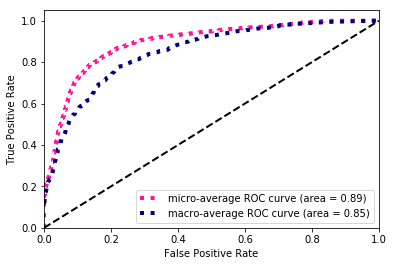

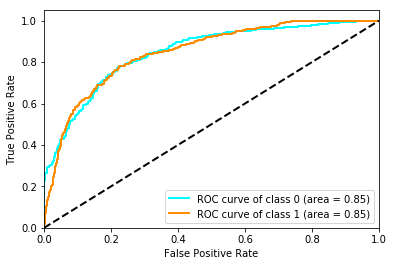

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.888267,0.601272,0.744769,0.825447,0.827673
precision,0.897172,0.580702,0.738937,0.825447,0.830355
recall,0.879536,0.623352,0.751444,0.825447,0.825447
support,1984.000000,531.000000,2515.000000,2515.000000,2515.000000
auc,0.847762,0.847762,0.848259,0.892895,NaN


******************** RNN ********************
**********  round  2
load and test: shapes for train and test, X/Y
(12085, 258)
(12085, 2)
(2515, 258)
(2515, 2)
(12085, 8, 18)
(12085, 14)
(12085, 100)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 18)        0                                            
__________________________________________________________________________________________________
lstm_29 (LSTM)                  (None, 8, 128)       75264       main_input[0][0]                 
__________________________________________________________________________________________________
geohash_input (InputLayer)      (None, 14)           0                                            
__________________________________________________________________________________________________
nlp_input

Epoch 43/60
 - 2s - loss: 0.3099 - f1_score: 0.5625 - val_loss: 0.3491 - val_f1_score: 0.3705
Epoch 44/60
 - 2s - loss: 0.3066 - f1_score: 0.5775 - val_loss: 0.6061 - val_f1_score: 0.2267
Epoch 45/60
 - 2s - loss: 0.3056 - f1_score: 0.5696 - val_loss: 0.3569 - val_f1_score: 0.3327
Epoch 46/60
 - 2s - loss: 0.3085 - f1_score: 0.5649 - val_loss: 0.4388 - val_f1_score: 0.4599
Epoch 47/60
 - 2s - loss: 0.3064 - f1_score: 0.5714 - val_loss: 0.3595 - val_f1_score: 0.3320
Epoch 48/60
 - 2s - loss: 0.3059 - f1_score: 0.5780 - val_loss: 0.4114 - val_f1_score: 0.2380
Epoch 49/60
 - 2s - loss: 0.3084 - f1_score: 0.5656 - val_loss: 0.3973 - val_f1_score: 0.3804
Epoch 50/60
 - 2s - loss: 0.3045 - f1_score: 0.5778 - val_loss: 0.5188 - val_f1_score: 0.4682
Epoch 51/60
 - 2s - loss: 0.3048 - f1_score: 0.5792 - val_loss: 0.4273 - val_f1_score: 0.4384
Epoch 52/60
 - 2s - loss: 0.3044 - f1_score: 0.5810 - val_loss: 0.3557 - val_f1_score: 0.2041
Epoch 53/60
 - 2s - loss: 0.3055 - f1_score: 0.5689 - val_lo

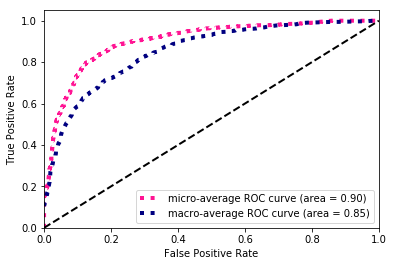

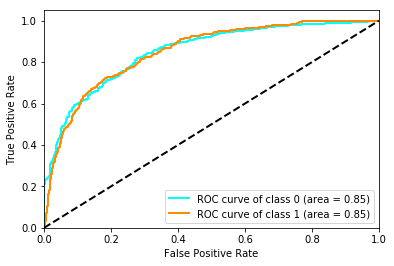

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.897747,0.583249,0.740498,0.835785,0.831346
precision,0.882238,0.628261,0.755250,0.835785,0.828615
recall,0.913810,0.544256,0.729033,0.835785,0.835785
support,1984.000000,531.000000,2515.000000,2515.000000,2515.000000
auc,0.850713,0.850713,0.851166,0.903154,NaN


******************** RNN_wo_geo ********************
**********  round  0
load and test: shapes for train and test, X/Y
(12085, 250)
(12085, 2)
(2515, 250)
(2515, 2)
(12085, 8, 17)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 8, 17)             0         
_________________________________________________________________
lstm_31 (LSTM)               (None, 8, 128)            74752     
_________________________________________________________________
lstm_32 (LSTM)               (None, 128)               131584    
_________________________________________________________________
dense_157 (Dense)            (None, 512)               66048     
_________________________________________________________________
dense_158 (Dense)            (None, 256)               131328    
_________________________________________________________________
batch_normalization_67 (Bat

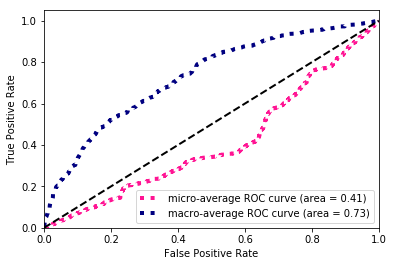

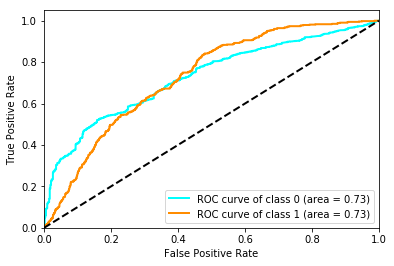

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.387409,0.405172,0.396291,0.396421,0.391160
precision,0.971660,0.255814,0.613737,0.396421,0.820521
recall,0.241935,0.973635,0.607785,0.396421,0.396421
support,1984.000000,531.000000,2515.000000,2515.000000,2515.000000
auc,0.728525,0.728525,0.728924,0.410357,NaN


******************** RNN_wo_geo ********************
**********  round  1
load and test: shapes for train and test, X/Y
(12085, 250)
(12085, 2)
(2515, 250)
(2515, 2)
(12085, 8, 17)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 8, 17)             0         
_________________________________________________________________
lstm_33 (LSTM)               (None, 8, 128)            74752     
_________________________________________________________________
lstm_34 (LSTM)               (None, 128)               131584    
_________________________________________________________________
dense_161 (Dense)            (None, 512)               66048     
_________________________________________________________________
dense_162 (Dense)            (None, 256)               131328    
_________________________________________________________________
batch_normalization_69 (Bat

/users/PAS0536/osu9965/.local/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


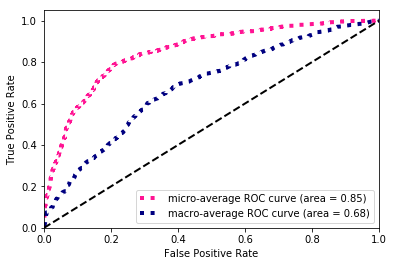

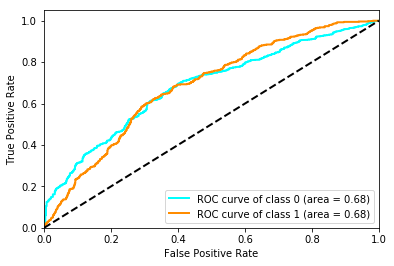

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.881974,0.00000,0.440987,0.788867,0.695760
precision,0.788867,0.00000,0.394433,0.788867,0.622311
recall,1.000000,0.00000,0.500000,0.788867,0.788867
support,1984.000000,531.00000,2515.000000,2515.000000,2515.000000
auc,0.682750,0.68275,0.683141,0.849743,NaN


******************** RNN_wo_geo ********************
**********  round  2
load and test: shapes for train and test, X/Y
(12085, 250)
(12085, 2)
(2515, 250)
(2515, 2)
(12085, 8, 17)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 8, 17)             0         
_________________________________________________________________
lstm_35 (LSTM)               (None, 8, 128)            74752     
_________________________________________________________________
lstm_36 (LSTM)               (None, 128)               131584    
_________________________________________________________________
dense_165 (Dense)            (None, 512)               66048     
_________________________________________________________________
dense_166 (Dense)            (None, 256)               131328    
_________________________________________________________________
batch_normalization_71 (Bat

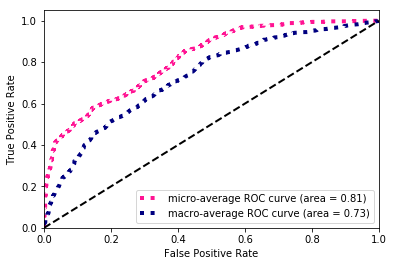

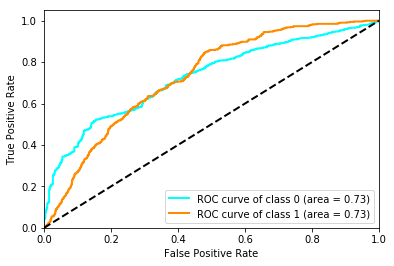

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.798260,0.451183,0.624722,0.704970,0.724981
precision,0.866588,0.371498,0.619043,0.704970,0.762058
recall,0.739919,0.574388,0.657154,0.704970,0.704970
support,1984.000000,531.000000,2515.000000,2515.000000,2515.000000
auc,0.726737,0.726738,0.727126,0.814621,NaN


In [19]:
Atlanta = compare_models(classname='RNN')

In [20]:
Atlanta.to_hdf('Atlanta.h5',key='RNN')
Atlanta

,NL,geohash,traffic,weather,time,geo
0_f1-score,0.869766,0.907670,0.907616,0.907906,0.895559,0.689214
1_f1-score,0.587913,0.607647,0.628635,0.604725,0.586516,0.285452
weighted avg_f1-score,0.810258,0.844325,0.848713,0.843895,0.830309,0.603967
micro avg_f1-score,0.804904,0.850630,0.852087,0.850762,0.833400,0.630086
macro avg_f1-score,0.728840,0.757658,0.768125,0.756315,0.741037,0.487333
0_precision,0.904128,0.886263,0.894563,0.884833,0.885540,0.875705
1_precision,0.567055,0.681106,0.669768,0.687313,0.619417,0.209104
weighted avg_precision,0.832961,0.842948,0.847102,0.843130,0.829353,0.734963
micro avg_precision,0.804904,0.850630,0.852087,0.850762,0.833400,0.630086
macro avg_precision,0.735592,0.783685,0.782166,0.786073,0.752479,0.542404


******************** RNN_embed_wo_NLP ********************
**********  round  0
load and test: shapes for train and test, X/Y
(12085, 315)
(12085, 2)
(2515, 315)
(2515, 2)
(12085, 8, 25)
(12085, 14)
(12085,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 25)        0                                            
__________________________________________________________________________________________________
embedding_1 (Embedding)         (None, 1, 128)       119680      geo_code[0][0]                   
__________________________________________________________________________________________________


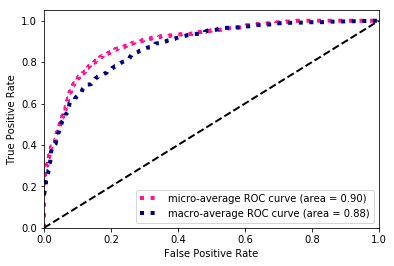

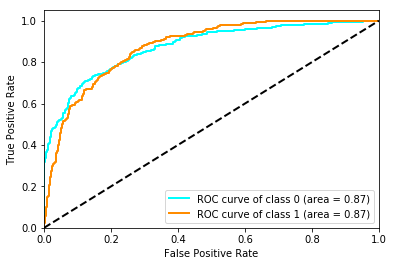

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.888317,0.620629,0.754473,0.827435,0.831799
precision,0.907466,0.579119,0.743292,0.827435,0.838141
recall,0.869960,0.668550,0.769255,0.827435,0.827435
support,1984.000000,531.000000,2515.000000,2515.000000,2515.000000
auc,0.874595,0.874595,0.875043,0.898980,NaN


******************** RNN_embed_wo_NLP ********************
**********  round  1
load and test: shapes for train and test, X/Y
(12085, 315)
(12085, 2)
(2515, 315)
(2515, 2)
(12085, 8, 25)
(12085, 14)
(12085,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 25)        0                                            
__________________________________________________________________________________________________
embedding_2 (Embedding)         (None, 1, 128)       119680      geo_code[0][0]                   
__________________________________________________________________________________________________


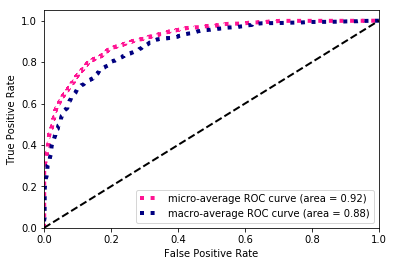

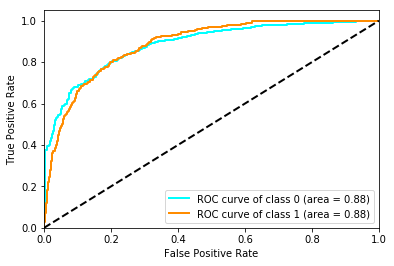

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.888658,0.639123,0.763890,0.829821,0.835973
precision,0.918280,0.578626,0.748453,0.829821,0.846567
recall,0.860887,0.713748,0.787317,0.829821,0.829821
support,1984.000000,531.000000,2515.000000,2515.000000,2515.000000
auc,0.884397,0.884397,0.884839,0.916306,NaN


******************** RNN_embed_wo_NLP ********************
**********  round  2
load and test: shapes for train and test, X/Y
(12085, 315)
(12085, 2)
(2515, 315)
(2515, 2)
(12085, 8, 25)
(12085, 14)
(12085,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 25)        0                                            
__________________________________________________________________________________________________
embedding_3 (Embedding)         (None, 1, 128)       119680      geo_code[0][0]                   
__________________________________________________________________________________________________


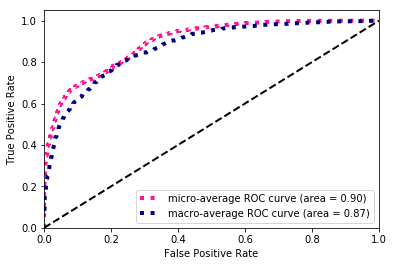

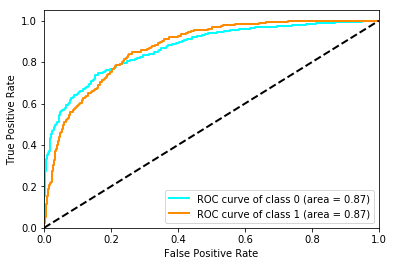

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.854501,0.604582,0.729542,0.787276,0.801735
precision,0.927939,0.497567,0.712753,0.787276,0.837073
recall,0.791835,0.770245,0.781040,0.787276,0.787276
support,1984.000000,531.000000,2515.000000,2515.000000,2515.000000
auc,0.869690,0.869690,0.870176,0.896430,NaN


******************** RNN_embed_wo_geohash ********************
**********  round  0
load and test: shapes for train and test, X/Y
(12085, 315)
(12085, 2)
(2515, 315)
(2515, 2)
(12085, 8, 25)
(12085, 100)
(12085,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 25)        0                                            
__________________________________________________________________________________________________
embedding_4 (Embedding)         (None, 1, 128)       119680      geo_code[0][0]                   
______________________________________________________________________________________________

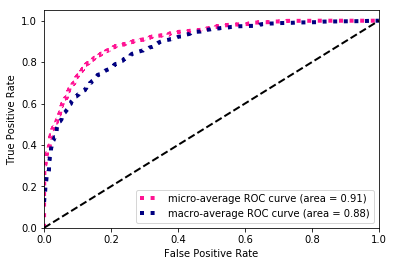

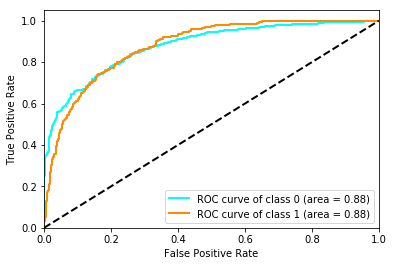

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.893541,0.625337,0.759439,0.834195,0.836914
precision,0.905329,0.597938,0.751633,0.834195,0.840428
recall,0.882056,0.655367,0.768712,0.834195,0.834195
support,1984.000000,531.000000,2515.000000,2515.000000,2515.000000
auc,0.878163,0.878163,0.878634,0.910922,NaN


******************** RNN_embed_wo_geohash ********************
**********  round  1
load and test: shapes for train and test, X/Y
(12085, 315)
(12085, 2)
(2515, 315)
(2515, 2)
(12085, 8, 25)
(12085, 100)
(12085,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 25)        0                                            
__________________________________________________________________________________________________
embedding_5 (Embedding)         (None, 1, 128)       119680      geo_code[0][0]                   
______________________________________________________________________________________________

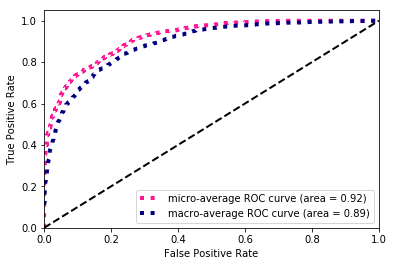

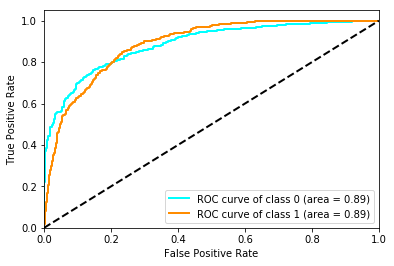

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.881534,0.631235,0.756384,0.820676,0.828688
precision,0.920461,0.557803,0.739132,0.820676,0.843892
recall,0.845766,0.726930,0.786348,0.820676,0.820676
support,1984.000000,531.000000,2515.000000,2515.000000,2515.000000
auc,0.886513,0.886513,0.886964,0.917852,NaN


******************** RNN_embed_wo_geohash ********************
**********  round  2
load and test: shapes for train and test, X/Y
(12085, 315)
(12085, 2)
(2515, 315)
(2515, 2)
(12085, 8, 25)
(12085, 100)
(12085,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 25)        0                                            
__________________________________________________________________________________________________
embedding_6 (Embedding)         (None, 1, 128)       119680      geo_code[0][0]                   
______________________________________________________________________________________________

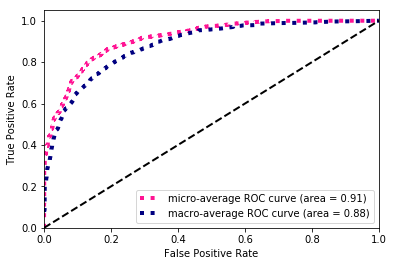

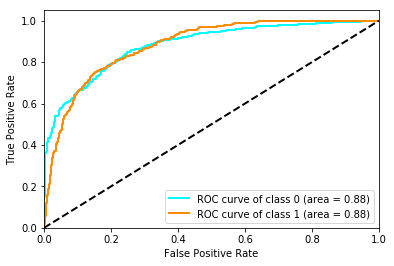

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.891885,0.644501,0.768193,0.834195,0.839654
precision,0.918313,0.588785,0.753549,0.834195,0.848739
recall,0.866935,0.711864,0.789400,0.834195,0.834195
support,1984.000000,531.000000,2515.000000,2515.000000,2515.000000
auc,0.882171,0.882171,0.882620,0.914186,NaN


******************** RNN_embed ********************
**********  round  0
load and test: shapes for train and test, X/Y
(12085, 251)
(12085, 2)
(2515, 251)
(2515, 2)
(12085, 8, 17)
(12085, 14)
(12085, 100)
(12085,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 17)        0                                            
__________________________________________________________________________________________________
embedding_7 (Embedding)         (None, 1, 128)       119680      geo_code[0][0]                   
_____________________________________________________________________________________________

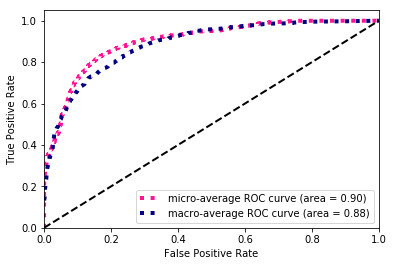

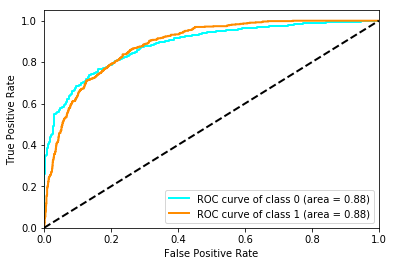

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.888773,0.641478,0.765125,0.830219,0.836561
precision,0.919677,0.578788,0.749232,0.830219,0.847704
recall,0.859879,0.719397,0.789638,0.830219,0.830219
support,1984.000000,531.000000,2515.000000,2515.000000,2515.000000
auc,0.884455,0.884456,0.884911,0.900447,NaN


******************** RNN_embed ********************
**********  round  1
load and test: shapes for train and test, X/Y
(12085, 251)
(12085, 2)
(2515, 251)
(2515, 2)
(12085, 8, 17)
(12085, 14)
(12085, 100)
(12085,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 17)        0                                            
__________________________________________________________________________________________________
embedding_8 (Embedding)         (None, 1, 128)       119680      geo_code[0][0]                   
_____________________________________________________________________________________________

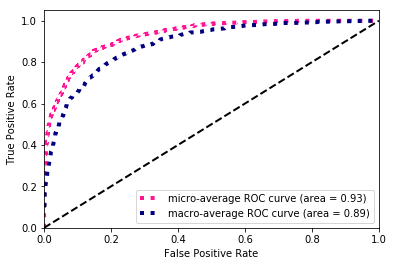

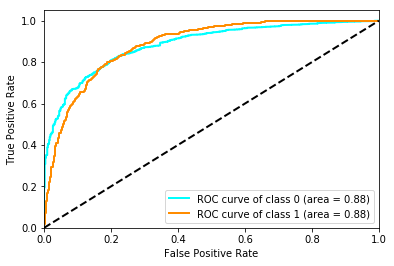

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.908419,0.615702,0.762061,0.852087,0.846617
precision,0.887873,0.681922,0.784898,0.852087,0.844390
recall,0.929940,0.561205,0.745572,0.852087,0.852087
support,1984.000000,531.000000,2515.000000,2515.000000,2515.000000
auc,0.884898,0.884897,0.885320,0.929073,NaN


******************** RNN_embed ********************
**********  round  2
load and test: shapes for train and test, X/Y
(12085, 251)
(12085, 2)
(2515, 251)
(2515, 2)
(12085, 8, 17)
(12085, 14)
(12085, 100)
(12085,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 17)        0                                            
__________________________________________________________________________________________________
embedding_9 (Embedding)         (None, 1, 128)       119680      geo_code[0][0]                   
_____________________________________________________________________________________________

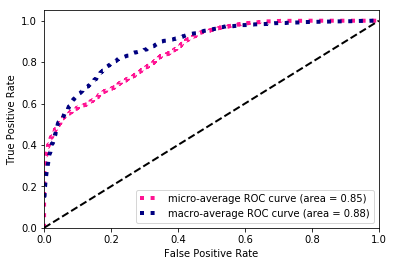

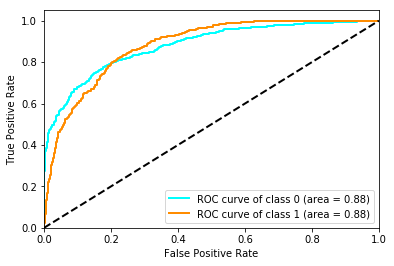

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.803163,0.584158,0.693661,0.732803,0.756924
precision,0.958741,0.435023,0.696882,0.732803,0.848167
recall,0.691028,0.888889,0.789959,0.732803,0.732803
support,1984.000000,531.000000,2515.000000,2515.000000,2515.000000
auc,0.880190,0.880190,0.880631,0.854564,NaN


******************** RNN_embed ********************
**********  round  0
load and test: shapes for train and test, X/Y
(12085, 235)
(12085, 2)
(2515, 235)
(2515, 2)
(12085, 8, 15)
(12085, 14)
(12085, 100)
(12085,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 15)        0                                            
__________________________________________________________________________________________________
embedding_10 (Embedding)        (None, 1, 128)       119680      geo_code[0][0]                   
_____________________________________________________________________________________________

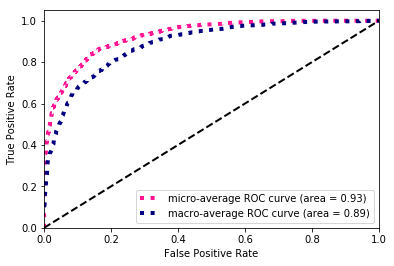

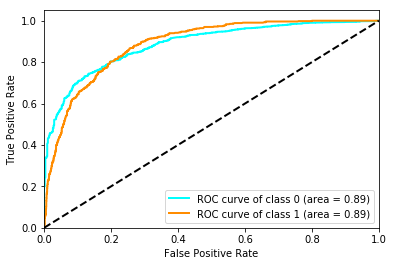

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.902396,0.636620,0.769508,0.846123,0.846282
precision,0.903079,0.634831,0.768955,0.846123,0.846443
recall,0.901714,0.638418,0.770066,0.846123,0.846123
support,1984.000000,531.000000,2515.000000,2515.000000,2515.000000
auc,0.885794,0.885794,0.886094,0.927599,NaN


******************** RNN_embed ********************
**********  round  1
load and test: shapes for train and test, X/Y
(12085, 235)
(12085, 2)
(2515, 235)
(2515, 2)
(12085, 8, 15)
(12085, 14)
(12085, 100)
(12085,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 15)        0                                            
__________________________________________________________________________________________________
embedding_11 (Embedding)        (None, 1, 128)       119680      geo_code[0][0]                   
_____________________________________________________________________________________________

Epoch 33/60
 - 2s - loss: 0.2689 - f1_score: 0.6409 - val_loss: 0.3580 - val_f1_score: 0.3232
Epoch 34/60
 - 2s - loss: 0.2706 - f1_score: 0.6372 - val_loss: 0.3823 - val_f1_score: 0.0322
Epoch 35/60
 - 2s - loss: 0.2694 - f1_score: 0.6326 - val_loss: 0.3923 - val_f1_score: 0.3034
Epoch 36/60
 - 2s - loss: 0.2709 - f1_score: 0.6251 - val_loss: 0.4351 - val_f1_score: 0.3782
Epoch 37/60
 - 2s - loss: 0.2705 - f1_score: 0.6365 - val_loss: 0.3745 - val_f1_score: 0.3770


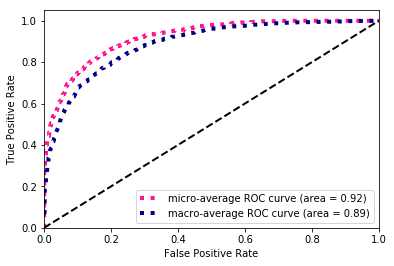

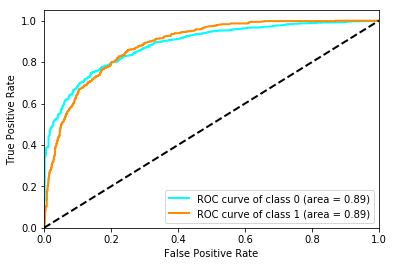

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.891647,0.639725,0.765686,0.833400,0.838458
precision,0.915560,0.588608,0.752084,0.833400,0.846530
recall,0.868952,0.700565,0.784758,0.833400,0.833400
support,1984.000000,531.000000,2515.000000,2515.000000,2515.000000
auc,0.885164,0.885164,0.885437,0.918874,NaN


******************** RNN_embed ********************
**********  round  2
load and test: shapes for train and test, X/Y
(12085, 235)
(12085, 2)
(2515, 235)
(2515, 2)
(12085, 8, 15)
(12085, 14)
(12085, 100)
(12085,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 15)        0                                            
__________________________________________________________________________________________________
embedding_12 (Embedding)        (None, 1, 128)       119680      geo_code[0][0]                   
_____________________________________________________________________________________________

Epoch 33/60
 - 2s - loss: 0.2715 - f1_score: 0.6461 - val_loss: 0.3777 - val_f1_score: 0.4197
Epoch 34/60
 - 2s - loss: 0.2759 - f1_score: 0.6315 - val_loss: 0.3495 - val_f1_score: 0.3454
Epoch 35/60
 - 2s - loss: 0.2724 - f1_score: 0.6407 - val_loss: 0.3568 - val_f1_score: 0.3426


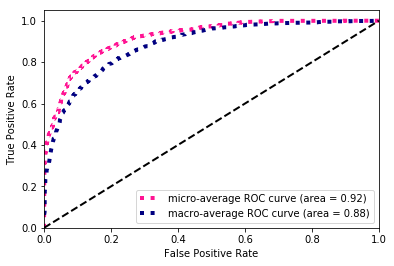

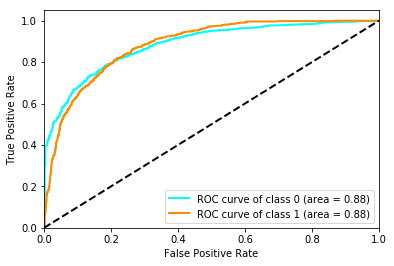

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.897397,0.638489,0.767943,0.840159,0.842733
precision,0.908997,0.611015,0.760006,0.840159,0.846083
recall,0.886089,0.668550,0.777319,0.840159,0.840159
support,1984.000000,531.000000,2515.000000,2515.000000,2515.000000
auc,0.884233,0.884236,0.884530,0.920303,NaN


******************** RNN_embed ********************
**********  round  0
load and test: shapes for train and test, X/Y
(12085, 259)
(12085, 2)
(2515, 259)
(2515, 2)
(12085, 8, 18)
(12085, 14)
(12085, 100)
(12085,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 18)        0                                            
__________________________________________________________________________________________________
embedding_13 (Embedding)        (None, 1, 128)       119680      geo_code[0][0]                   
_____________________________________________________________________________________________

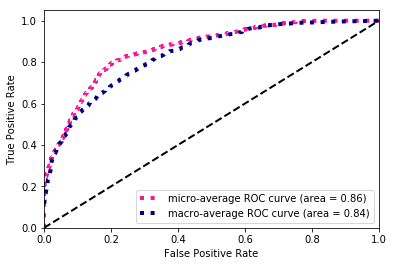

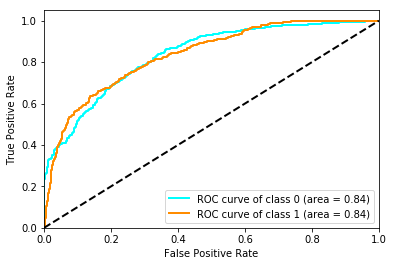

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.865460,0.578472,0.721966,0.796024,0.804867
precision,0.902132,0.513120,0.707626,0.796024,0.819999
recall,0.831653,0.662900,0.747277,0.796024,0.796024
support,1984.000000,531.000000,2515.000000,2515.000000,2515.000000
auc,0.835033,0.835033,0.835509,0.862808,NaN


******************** RNN_embed ********************
**********  round  1
load and test: shapes for train and test, X/Y
(12085, 259)
(12085, 2)
(2515, 259)
(2515, 2)
(12085, 8, 18)
(12085, 14)
(12085, 100)
(12085,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 18)        0                                            
__________________________________________________________________________________________________
embedding_14 (Embedding)        (None, 1, 128)       119680      geo_code[0][0]                   
_____________________________________________________________________________________________

 - 2s - loss: 0.3083 - f1_score: 0.5656 - val_loss: 0.3727 - val_f1_score: 0.3470
Epoch 34/60
 - 2s - loss: 0.3065 - f1_score: 0.5724 - val_loss: 0.3799 - val_f1_score: 0.2036
Epoch 35/60
 - 2s - loss: 0.3080 - f1_score: 0.5594 - val_loss: 0.3832 - val_f1_score: 0.3789
Epoch 36/60
 - 2s - loss: 0.3043 - f1_score: 0.5851 - val_loss: 0.4738 - val_f1_score: 0.4316
Epoch 37/60
 - 2s - loss: 0.3086 - f1_score: 0.5642 - val_loss: 0.3657 - val_f1_score: 0.2582


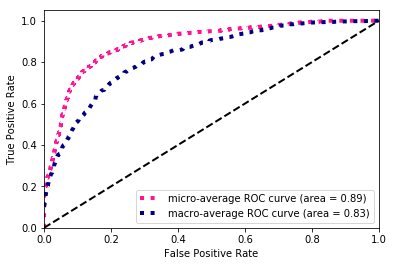

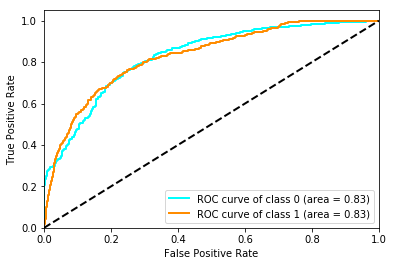

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.892697,0.569721,0.731209,0.828231,0.824506
precision,0.880020,0.604651,0.742335,0.828231,0.821880
recall,0.905746,0.538606,0.722176,0.828231,0.828231
support,1984.000000,531.000000,2515.000000,2515.000000,2515.000000
auc,0.828788,0.828788,0.829319,0.894454,NaN


******************** RNN_embed ********************
**********  round  2
load and test: shapes for train and test, X/Y
(12085, 259)
(12085, 2)
(2515, 259)
(2515, 2)
(12085, 8, 18)
(12085, 14)
(12085, 100)
(12085,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 18)        0                                            
__________________________________________________________________________________________________
embedding_15 (Embedding)        (None, 1, 128)       119680      geo_code[0][0]                   
_____________________________________________________________________________________________

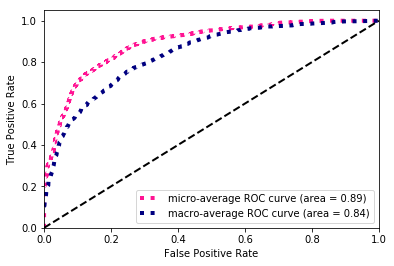

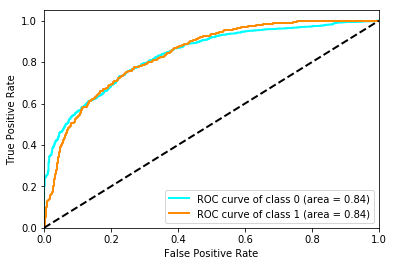

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.876572,0.575463,0.726018,0.808748,0.812998
precision,0.892838,0.541528,0.717183,0.808748,0.818665
recall,0.860887,0.613936,0.737412,0.808748,0.808748
support,1984.000000,531.000000,2515.000000,2515.000000,2515.000000
auc,0.837118,0.837119,0.837619,0.891072,NaN


******************** RNN_embed_wo_geo ********************
**********  round  0
load and test: shapes for train and test, X/Y
(12085, 251)
(12085, 2)
(2515, 251)
(2515, 2)
(12085, 8, 17)
(12085,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 17)        0                                            
__________________________________________________________________________________________________
embedding_16 (Embedding)        (None, 1, 128)       119680      geo_code[0][0]                   
__________________________________________________________________________________________________
lstm_67 (LST

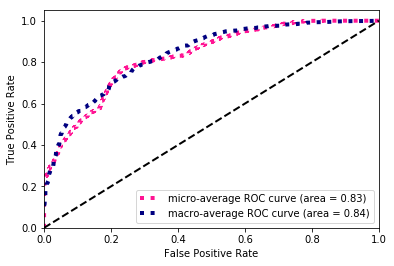

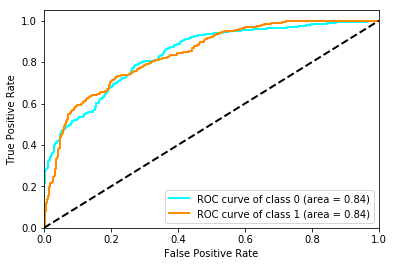

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.838251,0.567883,0.703067,0.764612,0.781168
precision,0.915274,0.463647,0.689461,0.764612,0.819921
recall,0.773185,0.732580,0.752883,0.764612,0.764612
support,1984.000000,531.000000,2515.000000,2515.000000,2515.000000
auc,0.838131,0.838131,0.838666,0.828285,NaN


******************** RNN_embed_wo_geo ********************
**********  round  1
load and test: shapes for train and test, X/Y
(12085, 251)
(12085, 2)
(2515, 251)
(2515, 2)
(12085, 8, 17)
(12085,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 17)        0                                            
__________________________________________________________________________________________________
embedding_17 (Embedding)        (None, 1, 128)       119680      geo_code[0][0]                   
__________________________________________________________________________________________________
lstm_69 (LST

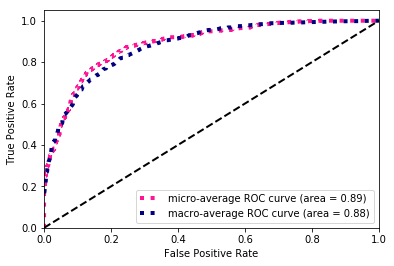

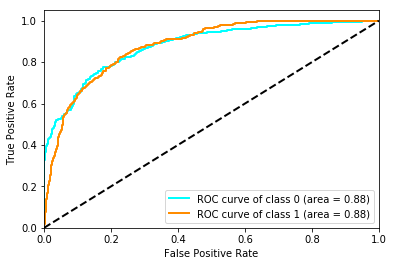

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.873210,0.620635,0.746922,0.80994,0.819883
precision,0.921613,0.536351,0.728982,0.80994,0.840271
recall,0.829637,0.736347,0.782992,0.80994,0.809940
support,1984.000000,531.000000,2515.000000,2515.00000,2515.000000
auc,0.879420,0.879420,0.879862,0.88828,NaN


******************** RNN_embed_wo_geo ********************
**********  round  2
load and test: shapes for train and test, X/Y
(12085, 251)
(12085, 2)
(2515, 251)
(2515, 2)
(12085, 8, 17)
(12085,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 17)        0                                            
__________________________________________________________________________________________________
embedding_18 (Embedding)        (None, 1, 128)       119680      geo_code[0][0]                   
__________________________________________________________________________________________________
lstm_71 (LST

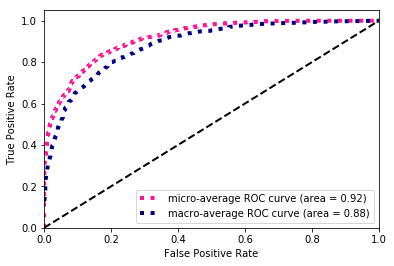

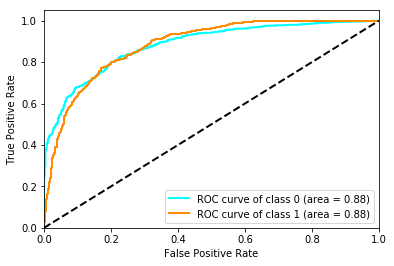

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.889694,0.635274,0.762484,0.830616,0.835978
precision,0.914803,0.582418,0.748610,0.830616,0.844625
recall,0.865927,0.698682,0.782305,0.830616,0.830616
support,1984.000000,531.000000,2515.000000,2515.000000,2515.000000
auc,0.882638,0.882636,0.883097,0.916875,NaN


In [21]:
Atlanta = compare_models(classname='RNN_embed')

In [22]:
Atlanta.to_hdf('Atlanta.h5',key='RNN_embed')
Atlanta

,NL,geohash,traffic,weather,time,geo
0_f1-score,0.877159,0.888987,0.866785,0.897147,0.878243,0.867052
1_f1-score,0.621445,0.633691,0.613780,0.638278,0.574552,0.607931
weighted avg_f1-score,0.823169,0.835085,0.813367,0.842491,0.814124,0.812343
micro avg_f1-score,0.814844,0.829689,0.805036,0.839894,0.811001,0.801723
macro avg_f1-score,0.749302,0.761339,0.740282,0.767712,0.726398,0.737491
0_precision,0.917895,0.914701,0.922097,0.909212,0.891663,0.917230
1_precision,0.551771,0.581509,0.565244,0.611485,0.553100,0.527472
weighted avg_precision,0.840594,0.844353,0.846754,0.846352,0.820181,0.834939
micro avg_precision,0.814844,0.829689,0.805036,0.839894,0.811001,0.801723
macro avg_precision,0.734833,0.748105,0.743671,0.760348,0.722382,0.722351


# LosAngeles

******************** DNN ********************
**********  round  0
load and test: shapes for train and test, X/Y
(30862, 214)
(30862, 2)
(6132, 214)
(6132, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 214)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 512)               110080    
_________________________________________________________________
dense_2 (Dense)              (None, 256)               131328    
_________________________________________________________________
batch_normalization_1 (Batch (None, 256)               1024      
_________________________________________________________________
activation_1 (Activation)    (None, 256)               0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 256)         

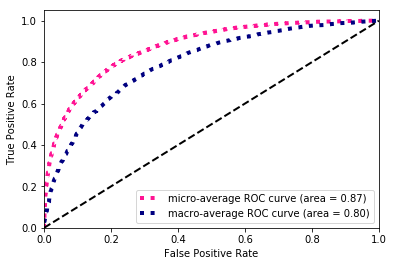

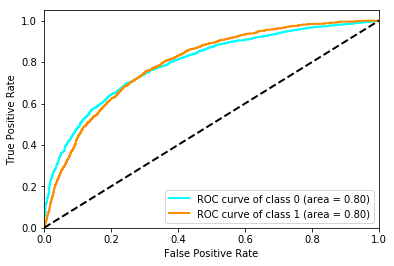

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.864972,0.513878,0.689425,0.788650,0.788421
precision,0.864252,0.515425,0.689838,0.788650,0.788195
recall,0.865693,0.512341,0.689017,0.788650,0.788650
support,4795.000000,1337.000000,6132.000000,6132.000000,6132.000000
auc,0.795099,0.795099,0.795307,0.871823,NaN


******************** DNN ********************
**********  round  1
load and test: shapes for train and test, X/Y
(30862, 214)
(30862, 2)
(6132, 214)
(6132, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 214)               0         
_________________________________________________________________
dense_5 (Dense)              (None, 512)               110080    
_________________________________________________________________
dense_6 (Dense)              (None, 256)               131328    
_________________________________________________________________
batch_normalization_3 (Batch (None, 256)               1024      
_________________________________________________________________
activation_3 (Activation)    (None, 256)               0         
_________________________________________________________________
dropout_2 (Dropout)          (None, 256)         

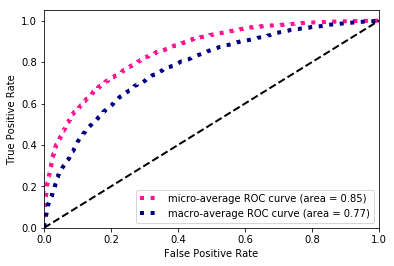

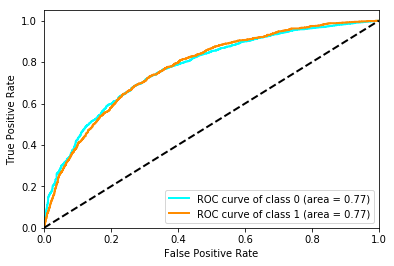

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.842817,0.503729,0.673273,0.761252,0.768884
precision,0.868555,0.460632,0.664594,0.761252,0.779613
recall,0.818561,0.555722,0.687141,0.761252,0.761252
support,4795.000000,1337.000000,6132.000000,6132.000000,6132.000000
auc,0.773514,0.773514,0.773732,0.850151,NaN


******************** DNN ********************
**********  round  2
load and test: shapes for train and test, X/Y
(30862, 214)
(30862, 2)
(6132, 214)
(6132, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 214)               0         
_________________________________________________________________
dense_9 (Dense)              (None, 512)               110080    
_________________________________________________________________
dense_10 (Dense)             (None, 256)               131328    
_________________________________________________________________
batch_normalization_5 (Batch (None, 256)               1024      
_________________________________________________________________
activation_5 (Activation)    (None, 256)               0         
_________________________________________________________________
dropout_3 (Dropout)          (None, 256)         

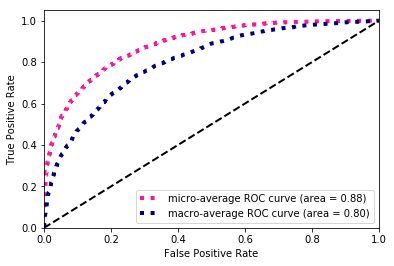

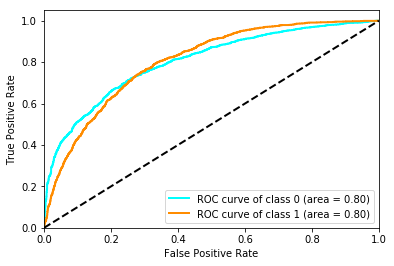

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.869752,0.490793,0.680272,0.792564,0.787125
precision,0.854355,0.527993,0.691174,0.792564,0.783196
recall,0.885714,0.458489,0.672102,0.792564,0.792564
support,4795.000000,1337.000000,6132.000000,6132.000000,6132.000000
auc,0.803139,0.803139,0.803340,0.882836,NaN


******************** DNN ********************
**********  round  0
load and test: shapes for train and test, X/Y
(30862, 300)
(30862, 2)
(6132, 300)
(6132, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 300)               0         
_________________________________________________________________
dense_13 (Dense)             (None, 512)               154112    
_________________________________________________________________
dense_14 (Dense)             (None, 256)               131328    
_________________________________________________________________
batch_normalization_7 (Batch (None, 256)               1024      
_________________________________________________________________
activation_7 (Activation)    (None, 256)               0         
_________________________________________________________________
dropout_4 (Dropout)          (None, 256)         

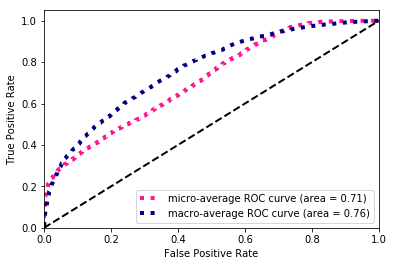

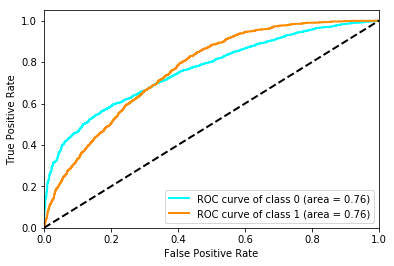

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.700362,0.488074,0.594218,0.621983,0.654075
precision,0.921115,0.346286,0.633701,0.621983,0.795782
recall,0.564964,0.826477,0.695720,0.621983,0.621983
support,4795.000000,1337.000000,6132.000000,6132.000000,6132.000000
auc,0.762196,0.762196,0.762408,0.713518,NaN


******************** DNN ********************
**********  round  1
load and test: shapes for train and test, X/Y
(30862, 300)
(30862, 2)
(6132, 300)
(6132, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 300)               0         
_________________________________________________________________
dense_17 (Dense)             (None, 512)               154112    
_________________________________________________________________
dense_18 (Dense)             (None, 256)               131328    
_________________________________________________________________
batch_normalization_9 (Batch (None, 256)               1024      
_________________________________________________________________
activation_9 (Activation)    (None, 256)               0         
_________________________________________________________________
dropout_5 (Dropout)          (None, 256)         

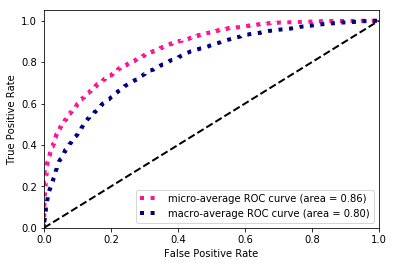

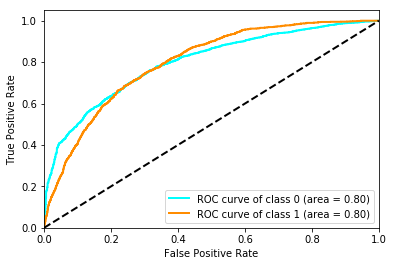

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.849575,0.530736,0.690155,0.772179,0.780056
precision,0.878228,0.481707,0.679968,0.772179,0.791772
recall,0.822732,0.590875,0.706804,0.772179,0.772179
support,4795.000000,1337.000000,6132.000000,6132.000000,6132.000000
auc,0.798568,0.798568,0.798769,0.864702,NaN


******************** DNN ********************
**********  round  2
load and test: shapes for train and test, X/Y
(30862, 300)
(30862, 2)
(6132, 300)
(6132, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 300)               0         
_________________________________________________________________
dense_21 (Dense)             (None, 512)               154112    
_________________________________________________________________
dense_22 (Dense)             (None, 256)               131328    
_________________________________________________________________
batch_normalization_11 (Batc (None, 256)               1024      
_________________________________________________________________
activation_11 (Activation)   (None, 256)               0         
_________________________________________________________________
dropout_6 (Dropout)          (None, 256)         

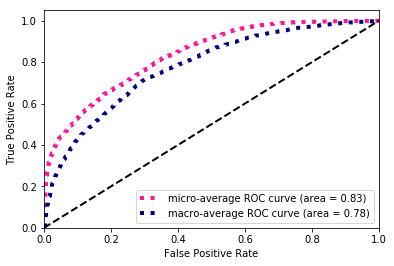

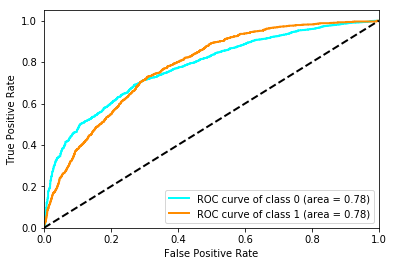

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.817068,0.500608,0.658838,0.732224,0.748068
precision,0.877063,0.421835,0.649449,0.732224,0.777807
recall,0.764755,0.615557,0.690156,0.732224,0.732224
support,4795.000000,1337.000000,6132.000000,6132.000000,6132.000000
auc,0.776138,0.776138,0.776352,0.832798,NaN


******************** DNN ********************
**********  round  0
load and test: shapes for train and test, X/Y
(30862, 250)
(30862, 2)
(6132, 250)
(6132, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 250)               0         
_________________________________________________________________
dense_25 (Dense)             (None, 512)               128512    
_________________________________________________________________
dense_26 (Dense)             (None, 256)               131328    
_________________________________________________________________
batch_normalization_13 (Batc (None, 256)               1024      
_________________________________________________________________
activation_13 (Activation)   (None, 256)               0         
_________________________________________________________________
dropout_7 (Dropout)          (None, 256)         

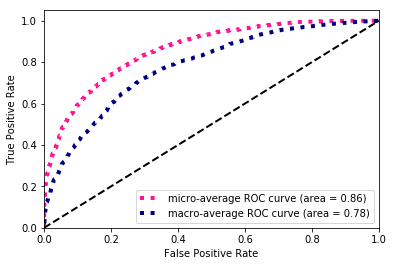

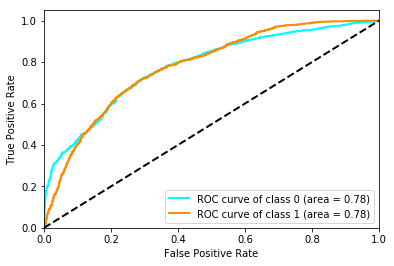

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.851190,0.499110,0.675150,0.770548,0.774424
precision,0.863519,0.476223,0.669871,0.770548,0.779075
recall,0.839208,0.524308,0.681758,0.770548,0.770548
support,4795.000000,1337.000000,6132.000000,6132.000000,6132.000000
auc,0.778662,0.778662,0.778874,0.859481,NaN


******************** DNN ********************
**********  round  1
load and test: shapes for train and test, X/Y
(30862, 250)
(30862, 2)
(6132, 250)
(6132, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 250)               0         
_________________________________________________________________
dense_29 (Dense)             (None, 512)               128512    
_________________________________________________________________
dense_30 (Dense)             (None, 256)               131328    
_________________________________________________________________
batch_normalization_15 (Batc (None, 256)               1024      
_________________________________________________________________
activation_15 (Activation)   (None, 256)               0         
_________________________________________________________________
dropout_8 (Dropout)          (None, 256)         

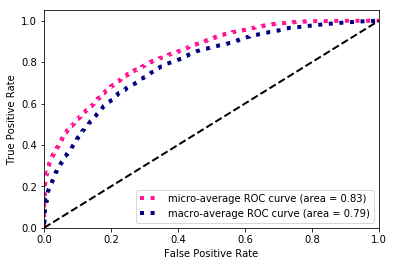

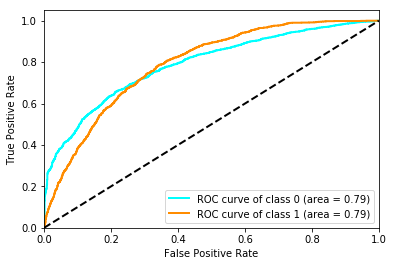

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.827448,0.523020,0.675234,0.746575,0.761072
precision,0.884825,0.443519,0.664172,0.746575,0.788605
recall,0.777059,0.637248,0.707154,0.746575,0.746575
support,4795.000000,1337.000000,6132.000000,6132.000000,6132.000000
auc,0.789574,0.789574,0.789776,0.834739,NaN


******************** DNN ********************
**********  round  2
load and test: shapes for train and test, X/Y
(30862, 250)
(30862, 2)
(6132, 250)
(6132, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 250)               0         
_________________________________________________________________
dense_33 (Dense)             (None, 512)               128512    
_________________________________________________________________
dense_34 (Dense)             (None, 256)               131328    
_________________________________________________________________
batch_normalization_17 (Batc (None, 256)               1024      
_________________________________________________________________
activation_17 (Activation)   (None, 256)               0         
_________________________________________________________________
dropout_9 (Dropout)          (None, 256)         

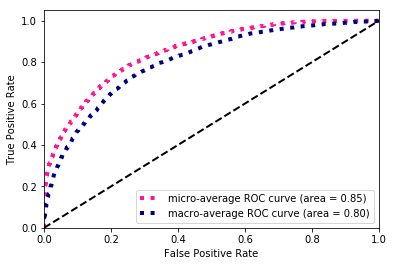

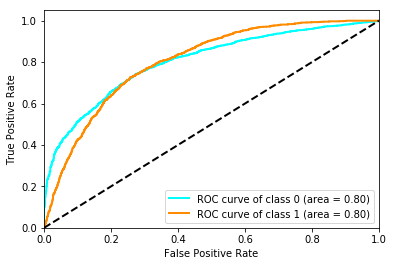

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.842013,0.541521,0.691767,0.765003,0.776495
precision,0.887656,0.471207,0.679432,0.765003,0.796855
recall,0.800834,0.636500,0.718667,0.765003,0.765003
support,4795.000000,1337.000000,6132.000000,6132.000000,6132.000000
auc,0.803405,0.803405,0.803607,0.849977,NaN


******************** DNN ********************
**********  round  0
load and test: shapes for train and test, X/Y
(30862, 234)
(30862, 2)
(6132, 234)
(6132, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 234)               0         
_________________________________________________________________
dense_37 (Dense)             (None, 512)               120320    
_________________________________________________________________
dense_38 (Dense)             (None, 256)               131328    
_________________________________________________________________
batch_normalization_19 (Batc (None, 256)               1024      
_________________________________________________________________
activation_19 (Activation)   (None, 256)               0         
_________________________________________________________________
dropout_10 (Dropout)         (None, 256)         

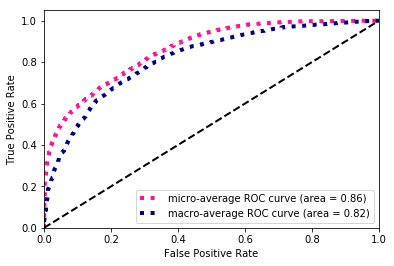

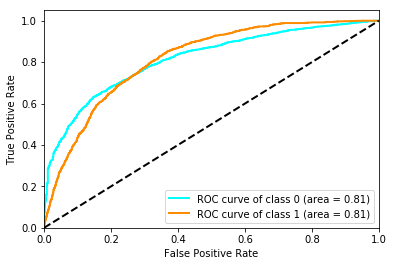

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.830184,0.552195,0.691189,0.753751,0.769572
precision,0.900903,0.457494,0.679198,0.753751,0.804224
recall,0.769760,0.696335,0.733048,0.753751,0.753751
support,4795.000000,1337.000000,6132.000000,6132.000000,6132.000000
auc,0.814918,0.814917,0.815052,0.859356,NaN


******************** DNN ********************
**********  round  1
load and test: shapes for train and test, X/Y
(30862, 234)
(30862, 2)
(6132, 234)
(6132, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 234)               0         
_________________________________________________________________
dense_41 (Dense)             (None, 512)               120320    
_________________________________________________________________
dense_42 (Dense)             (None, 256)               131328    
_________________________________________________________________
batch_normalization_21 (Batc (None, 256)               1024      
_________________________________________________________________
activation_21 (Activation)   (None, 256)               0         
_________________________________________________________________
dropout_11 (Dropout)         (None, 256)         

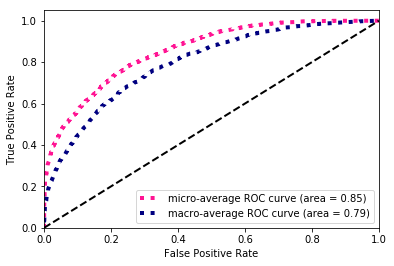

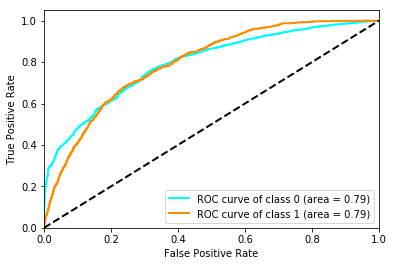

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.840991,0.530152,0.685571,0.762394,0.773217
precision,0.882097,0.465986,0.674042,0.762394,0.791370
recall,0.803545,0.614809,0.709177,0.762394,0.762394
support,4795.000000,1337.000000,6132.000000,6132.000000,6132.000000
auc,0.794550,0.794550,0.794691,0.854649,NaN


******************** DNN ********************
**********  round  2
load and test: shapes for train and test, X/Y
(30862, 234)
(30862, 2)
(6132, 234)
(6132, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 234)               0         
_________________________________________________________________
dense_45 (Dense)             (None, 512)               120320    
_________________________________________________________________
dense_46 (Dense)             (None, 256)               131328    
_________________________________________________________________
batch_normalization_23 (Batc (None, 256)               1024      
_________________________________________________________________
activation_23 (Activation)   (None, 256)               0         
_________________________________________________________________
dropout_12 (Dropout)         (None, 256)         

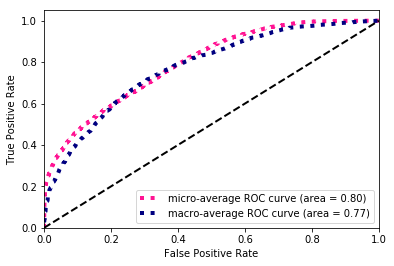

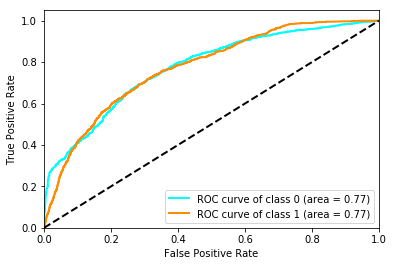

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.778788,0.506716,0.642752,0.694553,0.719467
precision,0.897876,0.391057,0.644466,0.694553,0.787371
recall,0.687591,0.719521,0.703556,0.694553,0.694553
support,4795.000000,1337.000000,6132.000000,6132.000000,6132.000000
auc,0.773694,0.773694,0.773843,0.795095,NaN


******************** DNN ********************
**********  round  0
load and test: shapes for train and test, X/Y
(30862, 258)
(30862, 2)
(6132, 258)
(6132, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 258)               0         
_________________________________________________________________
dense_49 (Dense)             (None, 512)               132608    
_________________________________________________________________
dense_50 (Dense)             (None, 256)               131328    
_________________________________________________________________
batch_normalization_25 (Batc (None, 256)               1024      
_________________________________________________________________
activation_25 (Activation)   (None, 256)               0         
_________________________________________________________________
dropout_13 (Dropout)         (None, 256)         

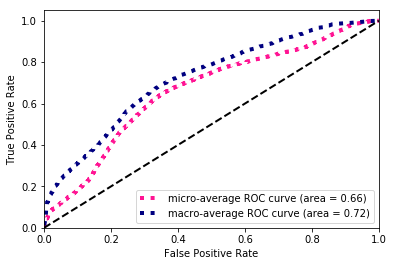

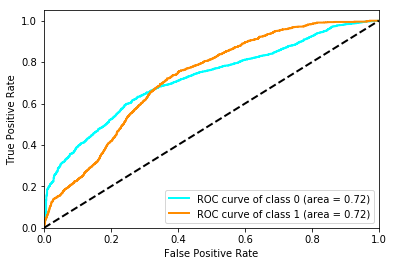

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.734469,0.471850,0.603159,0.646608,0.677208
precision,0.890374,0.349964,0.620169,0.646608,0.772545
recall,0.625026,0.724009,0.674518,0.646608,0.646608
support,4795.000000,1337.000000,6132.000000,6132.000000,6132.000000
auc,0.720592,0.720592,0.720816,0.662086,NaN


******************** DNN ********************
**********  round  1
load and test: shapes for train and test, X/Y
(30862, 258)
(30862, 2)
(6132, 258)
(6132, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 258)               0         
_________________________________________________________________
dense_53 (Dense)             (None, 512)               132608    
_________________________________________________________________
dense_54 (Dense)             (None, 256)               131328    
_________________________________________________________________
batch_normalization_27 (Batc (None, 256)               1024      
_________________________________________________________________
activation_27 (Activation)   (None, 256)               0         
_________________________________________________________________
dropout_14 (Dropout)         (None, 256)         

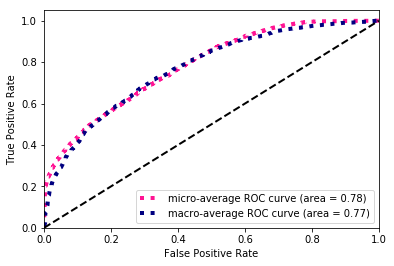

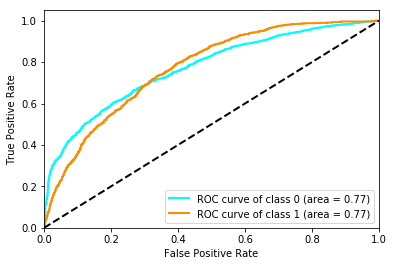

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.771476,0.497914,0.634695,0.68591,0.711830
precision,0.894853,0.382153,0.638503,0.68591,0.783065
recall,0.677998,0.714286,0.696142,0.68591,0.685910
support,4795.000000,1337.000000,6132.000000,6132.00000,6132.000000
auc,0.770188,0.770188,0.770398,0.78167,NaN


******************** DNN ********************
**********  round  2
load and test: shapes for train and test, X/Y
(30862, 258)
(30862, 2)
(6132, 258)
(6132, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 258)               0         
_________________________________________________________________
dense_57 (Dense)             (None, 512)               132608    
_________________________________________________________________
dense_58 (Dense)             (None, 256)               131328    
_________________________________________________________________
batch_normalization_29 (Batc (None, 256)               1024      
_________________________________________________________________
activation_29 (Activation)   (None, 256)               0         
_________________________________________________________________
dropout_15 (Dropout)         (None, 256)         

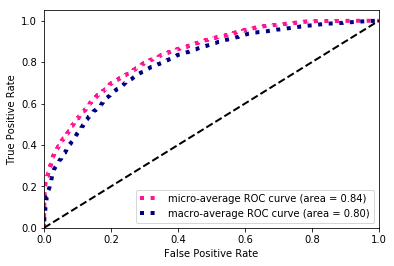

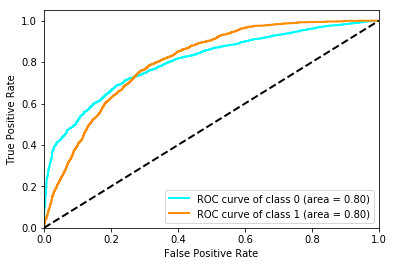

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.825521,0.534967,0.680244,0.746249,0.762170
precision,0.892797,0.445495,0.669146,0.746249,0.795268
recall,0.767675,0.669409,0.718542,0.746249,0.746249
support,4795.000000,1337.000000,6132.000000,6132.000000,6132.000000
auc,0.803982,0.803982,0.804172,0.836969,NaN


******************** DNN ********************
**********  round  0
load and test: shapes for train and test, X/Y
(30862, 136)
(30862, 2)
(6132, 136)
(6132, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 136)               0         
_________________________________________________________________
dense_61 (Dense)             (None, 512)               70144     
_________________________________________________________________
dense_62 (Dense)             (None, 256)               131328    
_________________________________________________________________
batch_normalization_31 (Batc (None, 256)               1024      
_________________________________________________________________
activation_31 (Activation)   (None, 256)               0         
_________________________________________________________________
dropout_16 (Dropout)         (None, 256)         

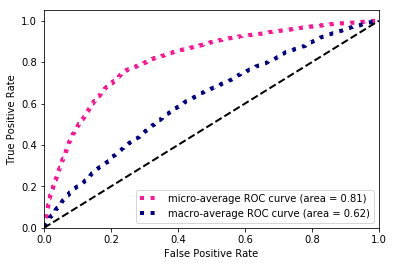

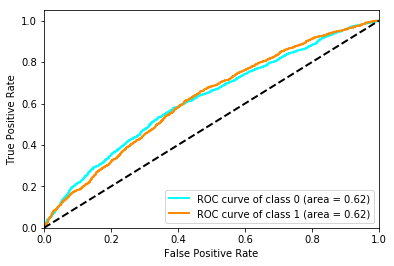

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.856040,0.214737,0.535388,0.756686,0.716213
precision,0.796552,0.362345,0.579448,0.756686,0.701879
recall,0.925130,0.152580,0.538855,0.756686,0.756686
support,4795.000000,1337.000000,6132.000000,6132.000000,6132.000000
auc,0.621096,0.621096,0.621275,0.814076,NaN


******************** DNN ********************
**********  round  1
load and test: shapes for train and test, X/Y
(30862, 136)
(30862, 2)
(6132, 136)
(6132, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 136)               0         
_________________________________________________________________
dense_65 (Dense)             (None, 512)               70144     
_________________________________________________________________
dense_66 (Dense)             (None, 256)               131328    
_________________________________________________________________
batch_normalization_33 (Batc (None, 256)               1024      
_________________________________________________________________
activation_33 (Activation)   (None, 256)               0         
_________________________________________________________________
dropout_17 (Dropout)         (None, 256)         

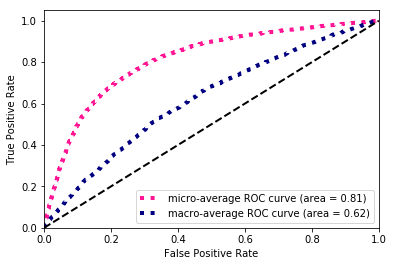

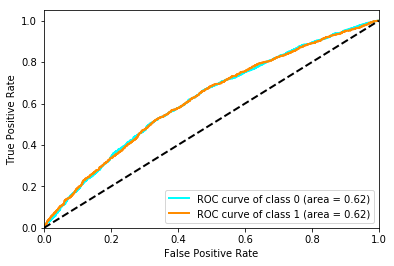

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.845821,0.251194,0.548507,0.744292,0.716171
precision,0.800186,0.347424,0.573805,0.744292,0.701467
recall,0.896976,0.196709,0.546843,0.744292,0.744292
support,4795.000000,1337.000000,6132.000000,6132.000000,6132.000000
auc,0.620185,0.620185,0.620373,0.810562,NaN


******************** DNN ********************
**********  round  2
load and test: shapes for train and test, X/Y
(30862, 136)
(30862, 2)
(6132, 136)
(6132, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 136)               0         
_________________________________________________________________
dense_69 (Dense)             (None, 512)               70144     
_________________________________________________________________
dense_70 (Dense)             (None, 256)               131328    
_________________________________________________________________
batch_normalization_35 (Batc (None, 256)               1024      
_________________________________________________________________
activation_35 (Activation)   (None, 256)               0         
_________________________________________________________________
dropout_18 (Dropout)         (None, 256)         

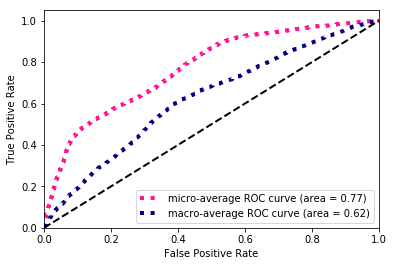

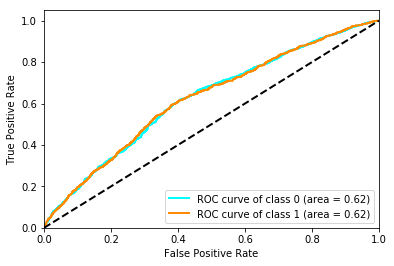

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.779850,0.347236,0.563543,0.670744,0.685524
precision,0.817185,0.305809,0.561497,0.670744,0.705686
recall,0.745777,0.401645,0.573711,0.670744,0.670744
support,4795.000000,1337.000000,6132.000000,6132.000000,6132.000000
auc,0.623230,0.623229,0.623408,0.768982,NaN


In [17]:
LosAngeles = compare_models(city='LosAngeles',classname='DNN')

In [ ]:
LosAngeles.to_hdf('LosAngeles.h5',key='DNN')
LosAngeles

,NL,geohash,traffic,weather,time,geo
0_f1-score,0.859180,0.789001,0.840217,0.816655,0.777155,0.827237
1_f1-score,0.502800,0.506473,0.521217,0.529687,0.501577,0.271055
weighted avg_f1-score,0.781476,0.727400,0.770663,0.754085,0.717069,0.705969
micro avg_f1-score,0.780822,0.708795,0.760709,0.736899,0.692922,0.723907
macro avg_f1-score,0.680990,0.647737,0.680717,0.673171,0.639366,0.549146
0_precision,0.862387,0.892135,0.878667,0.893625,0.892675,0.804641
1_precision,0.501350,0.416610,0.463650,0.438179,0.392537,0.338526
weighted avg_precision,0.783668,0.788453,0.788178,0.794321,0.783626,0.703011
micro avg_precision,0.780822,0.708795,0.760709,0.736899,0.692922,0.723907
macro avg_precision,0.681869,0.654372,0.671158,0.665902,0.642606,0.571583


******************** RNN_wo_NLP ********************
**********  round  0
load and test: shapes for train and test, X/Y
(30862, 314)
(30862, 2)
(6132, 314)
(6132, 2)
(30862, 8, 25)
(30862, 14)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 25)        0                                            
__________________________________________________________________________________________________
lstm_1 (LSTM)                   (None, 8, 128)       78848       main_input[0][0]                 
__________________________________________________________________________________________________
geohash_input (InputLayer)      (None, 14)           0                                            
__________________________________________________________________________________________________
lstm_2 (LSTM)  

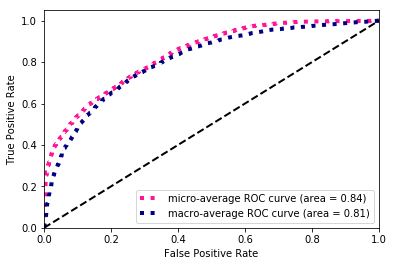

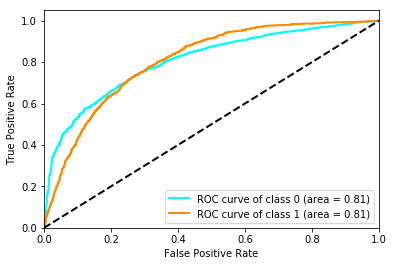

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.813684,0.543203,0.678443,0.735323,0.754709
precision,0.905005,0.435469,0.670237,0.735323,0.802629
recall,0.739103,0.721765,0.730434,0.735323,0.735323
support,4795.000000,1337.000000,6132.000000,6132.000000,6132.000000
auc,0.806608,0.806608,0.806804,0.836243,NaN


******************** RNN_wo_NLP ********************
**********  round  1
load and test: shapes for train and test, X/Y
(30862, 314)
(30862, 2)
(6132, 314)
(6132, 2)
(30862, 8, 25)
(30862, 14)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 25)        0                                            
__________________________________________________________________________________________________
lstm_3 (LSTM)                   (None, 8, 128)       78848       main_input[0][0]                 
__________________________________________________________________________________________________
geohash_input (InputLayer)      (None, 14)           0                                            
__________________________________________________________________________________________________
lstm_4 (LSTM)  

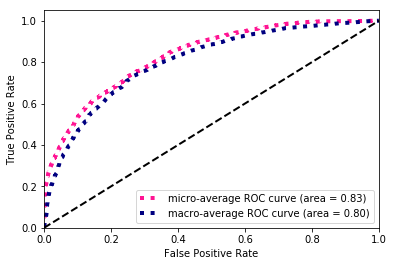

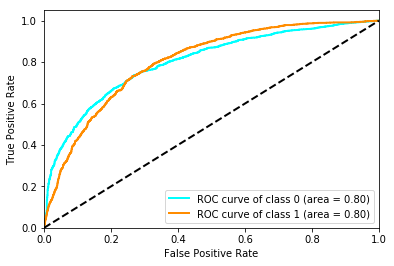

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.816966,0.544782,0.680874,0.738911,0.757620
precision,0.904099,0.439450,0.671774,0.738911,0.802789
recall,0.745151,0.716530,0.730840,0.738911,0.738911
support,4795.000000,1337.000000,6132.000000,6132.000000,6132.000000
auc,0.801597,0.801597,0.801808,0.831208,NaN


******************** RNN_wo_NLP ********************
**********  round  2
load and test: shapes for train and test, X/Y
(30862, 314)
(30862, 2)
(6132, 314)
(6132, 2)
(30862, 8, 25)
(30862, 14)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 25)        0                                            
__________________________________________________________________________________________________
lstm_5 (LSTM)                   (None, 8, 128)       78848       main_input[0][0]                 
__________________________________________________________________________________________________
geohash_input (InputLayer)      (None, 14)           0                                            
__________________________________________________________________________________________________
lstm_6 (LSTM)  

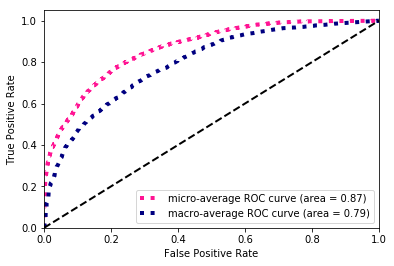

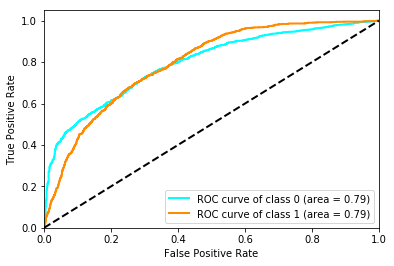

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.856872,0.509209,0.683041,0.778376,0.781069
precision,0.865532,0.492318,0.678925,0.778376,0.784158
recall,0.848384,0.527300,0.687842,0.778376,0.778376
support,4795.000000,1337.000000,6132.000000,6132.000000,6132.000000
auc,0.793697,0.793697,0.793904,0.865386,NaN


******************** RNN_wo_geohash ********************
**********  round  0
load and test: shapes for train and test, X/Y
(30862, 314)
(30862, 2)
(6132, 314)
(6132, 2)
(30862, 8, 25)
(30862, 100)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 25)        0                                            
__________________________________________________________________________________________________
lstm_7 (LSTM)                   (None, 8, 128)       78848       main_input[0][0]                 
__________________________________________________________________________________________________
nlp_input (InputLayer)          (None, 100)          0                                            
__________________________________________________________________________________________________
lstm_8 (LS

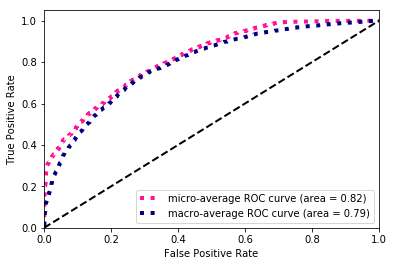

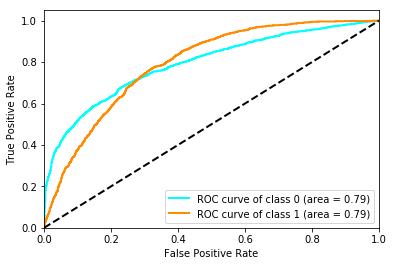

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.805661,0.527288,0.666475,0.724560,0.744966
precision,0.898614,0.421288,0.659951,0.724560,0.794539
recall,0.730136,0.704562,0.717349,0.724560,0.724560
support,4795.000000,1337.000000,6132.000000,6132.000000,6132.000000
auc,0.791933,0.791933,0.792140,0.818903,NaN


******************** RNN_wo_geohash ********************
**********  round  1
load and test: shapes for train and test, X/Y
(30862, 314)
(30862, 2)
(6132, 314)
(6132, 2)
(30862, 8, 25)
(30862, 100)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 25)        0                                            
__________________________________________________________________________________________________
lstm_9 (LSTM)                   (None, 8, 128)       78848       main_input[0][0]                 
__________________________________________________________________________________________________
nlp_input (InputLayer)          (None, 100)          0                                            
__________________________________________________________________________________________________
lstm_10 (L

Epoch 48/60
 - 4s - loss: 0.4045 - f1_score: 0.4739 - val_loss: 0.3745 - val_f1_score: 0.3823
Epoch 49/60
 - 4s - loss: 0.4048 - f1_score: 0.4726 - val_loss: 0.3751 - val_f1_score: 0.0043
Epoch 50/60
 - 4s - loss: 0.4045 - f1_score: 0.4762 - val_loss: 0.3439 - val_f1_score: 0.1932
Epoch 51/60
 - 4s - loss: 0.4035 - f1_score: 0.4813 - val_loss: 0.3897 - val_f1_score: 0.0382
Epoch 52/60
 - 4s - loss: 0.4044 - f1_score: 0.4814 - val_loss: 0.3619 - val_f1_score: 0.0729
Epoch 53/60
 - 4s - loss: 0.4033 - f1_score: 0.4745 - val_loss: 0.3962 - val_f1_score: 0.0417
Epoch 54/60
 - 4s - loss: 0.4033 - f1_score: 0.4704 - val_loss: 0.3754 - val_f1_score: 0.1197


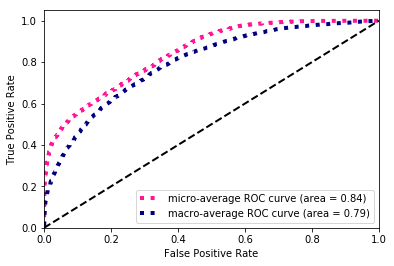

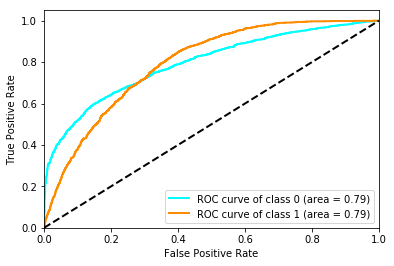

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.814103,0.518302,0.666202,0.731735,0.749608
precision,0.888505,0.425890,0.657198,0.731735,0.787638
recall,0.751199,0.661930,0.706564,0.731735,0.731735
support,4795.000000,1337.000000,6132.000000,6132.000000,6132.000000
auc,0.794116,0.794116,0.794314,0.842479,NaN


******************** RNN_wo_geohash ********************
**********  round  2
load and test: shapes for train and test, X/Y
(30862, 314)
(30862, 2)
(6132, 314)
(6132, 2)
(30862, 8, 25)
(30862, 100)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 25)        0                                            
__________________________________________________________________________________________________
lstm_11 (LSTM)                  (None, 8, 128)       78848       main_input[0][0]                 
__________________________________________________________________________________________________
nlp_input (InputLayer)          (None, 100)          0                                            
__________________________________________________________________________________________________
lstm_12 (L

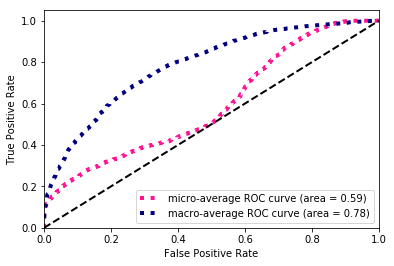

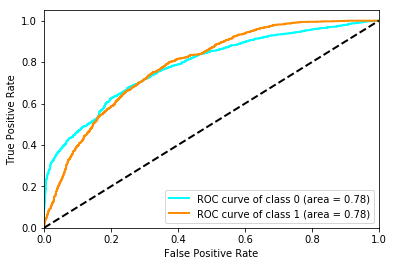

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.541935,0.454724,0.498330,0.502120,0.522920
precision,0.965775,0.298686,0.632231,0.502120,0.820326
recall,0.376642,0.952132,0.664387,0.502120,0.502120
support,4795.000000,1337.000000,6132.000000,6132.000000,6132.000000
auc,0.784408,0.784408,0.784606,0.592993,NaN


******************** RNN ********************
**********  round  0
load and test: shapes for train and test, X/Y
(30862, 250)
(30862, 2)
(6132, 250)
(6132, 2)
(30862, 8, 17)
(30862, 14)
(30862, 100)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 17)        0                                            
__________________________________________________________________________________________________
lstm_13 (LSTM)                  (None, 8, 128)       74752       main_input[0][0]                 
__________________________________________________________________________________________________
geohash_input (InputLayer)      (None, 14)           0                                            
__________________________________________________________________________________________________
nlp_input

Epoch 42/60
 - 4s - loss: 0.4053 - f1_score: 0.4567 - val_loss: 0.3517 - val_f1_score: 0.0859
Epoch 43/60
 - 4s - loss: 0.4055 - f1_score: 0.4635 - val_loss: 0.3611 - val_f1_score: 0.0334
Epoch 44/60
 - 4s - loss: 0.4052 - f1_score: 0.4668 - val_loss: 0.3303 - val_f1_score: 0.2156
Epoch 45/60
 - 4s - loss: 0.4037 - f1_score: 0.4768 - val_loss: 0.3256 - val_f1_score: 0.2847
Epoch 46/60
 - 4s - loss: 0.4031 - f1_score: 0.4638 - val_loss: 0.3688 - val_f1_score: 0.2746
Epoch 47/60
 - 4s - loss: 0.4043 - f1_score: 0.4720 - val_loss: 0.3398 - val_f1_score: 0.0849


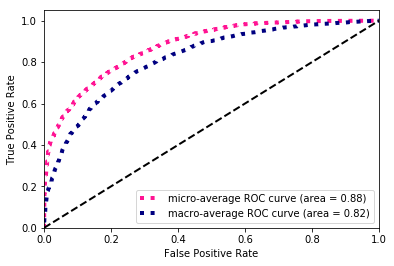

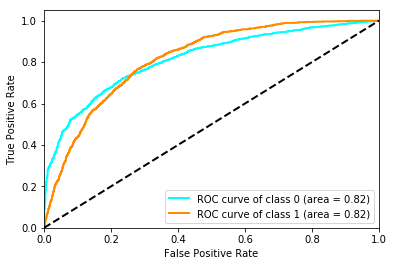

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.853419,0.543135,0.698277,0.778050,0.785766
precision,0.882405,0.492692,0.687549,0.778050,0.797434
recall,0.826277,0.605086,0.715682,0.778050,0.778050
support,4795.000000,1337.000000,6132.000000,6132.000000,6132.000000
auc,0.815773,0.815773,0.815972,0.876428,NaN


******************** RNN ********************
**********  round  1
load and test: shapes for train and test, X/Y
(30862, 250)
(30862, 2)
(6132, 250)
(6132, 2)
(30862, 8, 17)
(30862, 14)
(30862, 100)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 17)        0                                            
__________________________________________________________________________________________________
lstm_15 (LSTM)                  (None, 8, 128)       74752       main_input[0][0]                 
__________________________________________________________________________________________________
geohash_input (InputLayer)      (None, 14)           0                                            
__________________________________________________________________________________________________
nlp_input

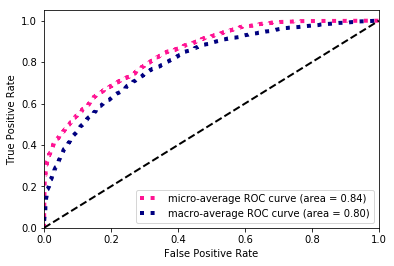

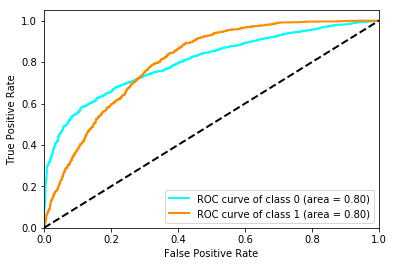

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.820771,0.514959,0.667865,0.738258,0.754092
precision,0.883413,0.432049,0.657731,0.738258,0.784999
recall,0.766423,0.637248,0.701835,0.738258,0.738258
support,4795.000000,1337.000000,6132.000000,6132.000000,6132.000000
auc,0.802096,0.802096,0.802301,0.844390,NaN


******************** RNN ********************
**********  round  2
load and test: shapes for train and test, X/Y
(30862, 250)
(30862, 2)
(6132, 250)
(6132, 2)
(30862, 8, 17)
(30862, 14)
(30862, 100)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 17)        0                                            
__________________________________________________________________________________________________
lstm_17 (LSTM)                  (None, 8, 128)       74752       main_input[0][0]                 
__________________________________________________________________________________________________
geohash_input (InputLayer)      (None, 14)           0                                            
__________________________________________________________________________________________________
nlp_input

Epoch 43/60
 - 4s - loss: 0.4062 - f1_score: 0.4635 - val_loss: 0.4355 - val_f1_score: 0.0650
Epoch 44/60
 - 4s - loss: 0.4061 - f1_score: 0.4636 - val_loss: 0.3492 - val_f1_score: 0.0249
Epoch 45/60
 - 4s - loss: 0.4074 - f1_score: 0.4539 - val_loss: 0.3348 - val_f1_score: 0.3078
Epoch 46/60
 - 4s - loss: 0.4062 - f1_score: 0.4576 - val_loss: 0.4851 - val_f1_score: 0.1209
Epoch 47/60
 - 4s - loss: 0.4054 - f1_score: 0.4501 - val_loss: 0.3407 - val_f1_score: 0.1025


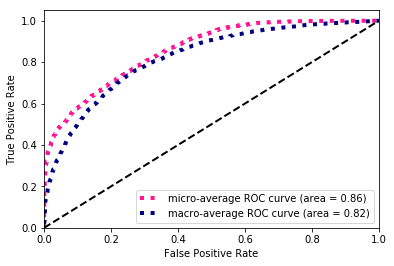

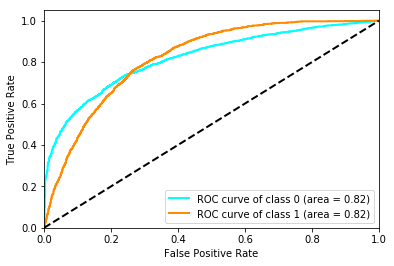

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.826501,0.553873,0.690187,0.750163,0.767058
precision,0.904337,0.453505,0.678921,0.750163,0.806039
recall,0.761001,0.711294,0.736147,0.750163,0.750163
support,4795.000000,1337.000000,6132.000000,6132.000000,6132.000000
auc,0.820031,0.820032,0.820237,0.857370,NaN


******************** RNN ********************
**********  round  0
load and test: shapes for train and test, X/Y
(30862, 234)
(30862, 2)
(6132, 234)
(6132, 2)
(30862, 8, 15)
(30862, 14)
(30862, 100)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 15)        0                                            
__________________________________________________________________________________________________
lstm_19 (LSTM)                  (None, 8, 128)       73728       main_input[0][0]                 
__________________________________________________________________________________________________
geohash_input (InputLayer)      (None, 14)           0                                            
__________________________________________________________________________________________________
nlp_input

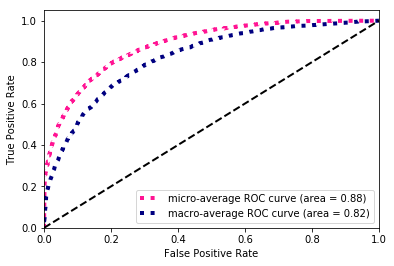

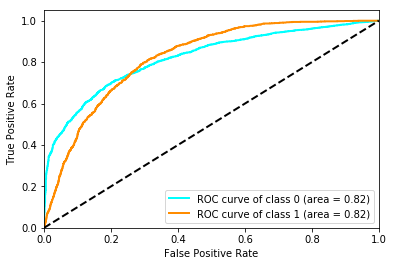

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.870135,0.529766,0.699951,0.796477,0.795922
precision,0.868328,0.533789,0.701059,0.796477,0.795386
recall,0.871950,0.525804,0.698877,0.796477,0.796477
support,4795.000000,1337.000000,6132.000000,6132.000000,6132.000000
auc,0.821294,0.821293,0.821436,0.882880,NaN


******************** RNN ********************
**********  round  1
load and test: shapes for train and test, X/Y
(30862, 234)
(30862, 2)
(6132, 234)
(6132, 2)
(30862, 8, 15)
(30862, 14)
(30862, 100)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 15)        0                                            
__________________________________________________________________________________________________
lstm_21 (LSTM)                  (None, 8, 128)       73728       main_input[0][0]                 
__________________________________________________________________________________________________
geohash_input (InputLayer)      (None, 14)           0                                            
__________________________________________________________________________________________________
nlp_input

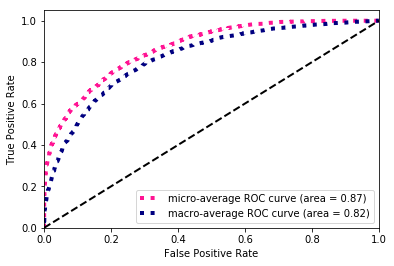

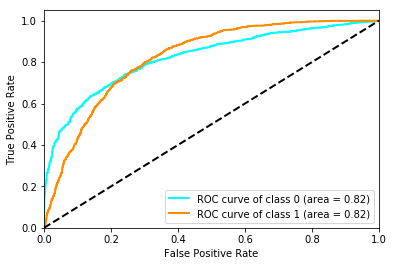

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.846392,0.565272,0.705832,0.772994,0.785097
precision,0.898758,0.485255,0.692006,0.772994,0.808599
recall,0.799791,0.676889,0.738340,0.772994,0.772994
support,4795.000000,1337.000000,6132.000000,6132.000000,6132.000000
auc,0.822291,0.822291,0.822430,0.867673,NaN


******************** RNN ********************
**********  round  2
load and test: shapes for train and test, X/Y
(30862, 234)
(30862, 2)
(6132, 234)
(6132, 2)
(30862, 8, 15)
(30862, 14)
(30862, 100)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 15)        0                                            
__________________________________________________________________________________________________
lstm_23 (LSTM)                  (None, 8, 128)       73728       main_input[0][0]                 
__________________________________________________________________________________________________
geohash_input (InputLayer)      (None, 14)           0                                            
__________________________________________________________________________________________________
nlp_input

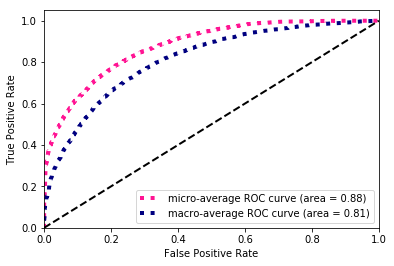

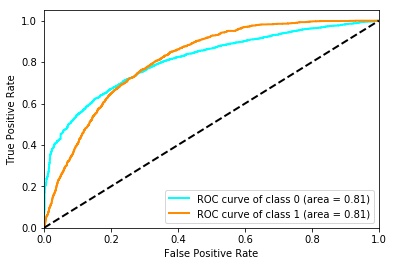

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.861645,0.520219,0.690932,0.785225,0.787202
precision,0.868120,0.507102,0.687611,0.785225,0.789405
recall,0.855266,0.534031,0.694649,0.785225,0.785225
support,4795.000000,1337.000000,6132.000000,6132.000000,6132.000000
auc,0.811000,0.811000,0.811129,0.877422,NaN


******************** RNN ********************
**********  round  0
load and test: shapes for train and test, X/Y
(30862, 258)
(30862, 2)
(6132, 258)
(6132, 2)
(30862, 8, 18)
(30862, 14)
(30862, 100)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 18)        0                                            
__________________________________________________________________________________________________
lstm_25 (LSTM)                  (None, 8, 128)       75264       main_input[0][0]                 
__________________________________________________________________________________________________
geohash_input (InputLayer)      (None, 14)           0                                            
__________________________________________________________________________________________________
nlp_input

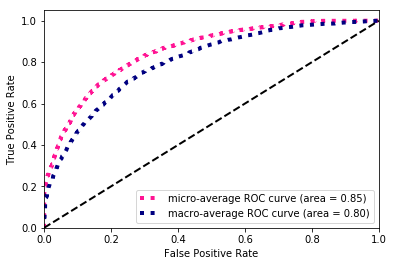

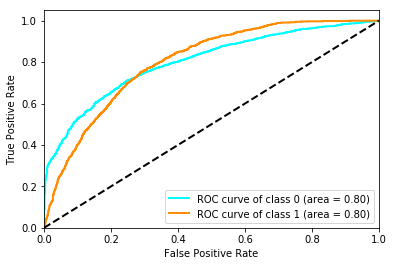

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.847545,0.511484,0.679515,0.767613,0.774271
precision,0.870167,0.472152,0.671159,0.767613,0.783385
recall,0.826069,0.557966,0.692017,0.767613,0.767613
support,4795.000000,1337.000000,6132.000000,6132.000000,6132.000000
auc,0.801914,0.801914,0.802100,0.853114,NaN


******************** RNN ********************
**********  round  1
load and test: shapes for train and test, X/Y
(30862, 258)
(30862, 2)
(6132, 258)
(6132, 2)
(30862, 8, 18)
(30862, 14)
(30862, 100)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 18)        0                                            
__________________________________________________________________________________________________
lstm_27 (LSTM)                  (None, 8, 128)       75264       main_input[0][0]                 
__________________________________________________________________________________________________
geohash_input (InputLayer)      (None, 14)           0                                            
__________________________________________________________________________________________________
nlp_input

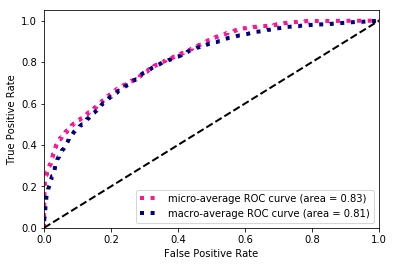

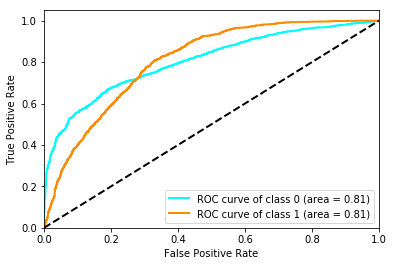

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.802778,0.529801,0.666290,0.722114,0.743259
precision,0.901951,0.419764,0.660857,0.722114,0.796816
recall,0.723253,0.718025,0.720639,0.722114,0.722114
support,4795.000000,1337.000000,6132.000000,6132.000000,6132.000000
auc,0.805056,0.805056,0.805250,0.825595,NaN


******************** RNN ********************
**********  round  2
load and test: shapes for train and test, X/Y
(30862, 258)
(30862, 2)
(6132, 258)
(6132, 2)
(30862, 8, 18)
(30862, 14)
(30862, 100)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 18)        0                                            
__________________________________________________________________________________________________
lstm_29 (LSTM)                  (None, 8, 128)       75264       main_input[0][0]                 
__________________________________________________________________________________________________
geohash_input (InputLayer)      (None, 14)           0                                            
__________________________________________________________________________________________________
nlp_input

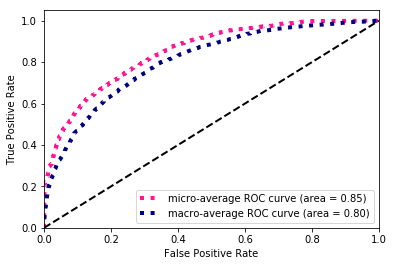

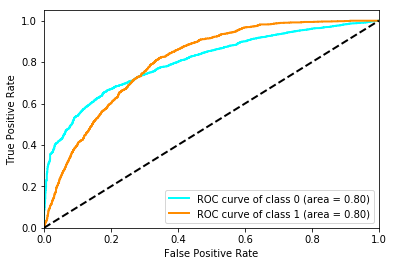

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.833242,0.520998,0.677120,0.752609,0.765161
precision,0.880986,0.450820,0.665903,0.752609,0.787194
recall,0.790407,0.617053,0.703730,0.752609,0.752609
support,4795.000000,1337.000000,6132.000000,6132.000000,6132.000000
auc,0.803856,0.803856,0.804054,0.848395,NaN


******************** RNN_wo_geo ********************
**********  round  0
load and test: shapes for train and test, X/Y
(30862, 250)
(30862, 2)
(6132, 250)
(6132, 2)
(30862, 8, 17)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 8, 17)             0         
_________________________________________________________________
lstm_31 (LSTM)               (None, 8, 128)            74752     
_________________________________________________________________
lstm_32 (LSTM)               (None, 128)               131584    
_________________________________________________________________
dense_85 (Dense)             (None, 512)               66048     
_________________________________________________________________
dense_86 (Dense)             (None, 256)               131328    
_________________________________________________________________
batch_normalization_31 (Bat

/users/PAS0536/osu9965/.local/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


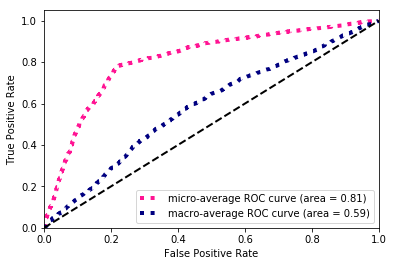

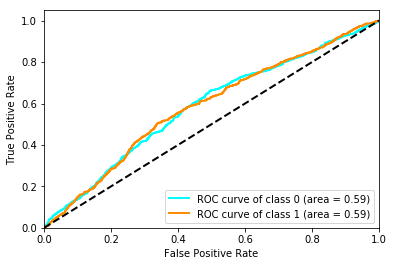

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.877643,0.000000,0.438821,0.781963,0.686284
precision,0.781963,0.000000,0.390982,0.781963,0.611467
recall,1.000000,0.000000,0.500000,0.781963,0.781963
support,4795.000000,1337.000000,6132.000000,6132.000000,6132.000000
auc,0.585106,0.585106,0.585280,0.810984,NaN


******************** RNN_wo_geo ********************
**********  round  1
load and test: shapes for train and test, X/Y
(30862, 250)
(30862, 2)
(6132, 250)
(6132, 2)
(30862, 8, 17)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 8, 17)             0         
_________________________________________________________________
lstm_33 (LSTM)               (None, 8, 128)            74752     
_________________________________________________________________
lstm_34 (LSTM)               (None, 128)               131584    
_________________________________________________________________
dense_89 (Dense)             (None, 512)               66048     
_________________________________________________________________
dense_90 (Dense)             (None, 256)               131328    
_________________________________________________________________
batch_normalization_33 (Bat

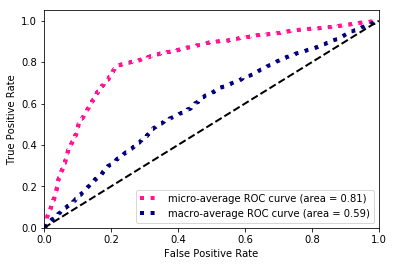

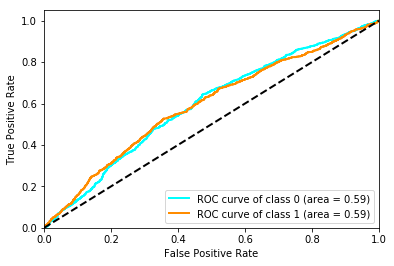

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.877643,0.000000,0.438821,0.781963,0.686284
precision,0.781963,0.000000,0.390982,0.781963,0.611467
recall,1.000000,0.000000,0.500000,0.781963,0.781963
support,4795.000000,1337.000000,6132.000000,6132.000000,6132.000000
auc,0.592291,0.592292,0.592479,0.813434,NaN


******************** RNN_wo_geo ********************
**********  round  2
load and test: shapes for train and test, X/Y
(30862, 250)
(30862, 2)
(6132, 250)
(6132, 2)
(30862, 8, 17)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 8, 17)             0         
_________________________________________________________________
lstm_35 (LSTM)               (None, 8, 128)            74752     
_________________________________________________________________
lstm_36 (LSTM)               (None, 128)               131584    
_________________________________________________________________
dense_93 (Dense)             (None, 512)               66048     
_________________________________________________________________
dense_94 (Dense)             (None, 256)               131328    
_________________________________________________________________
batch_normalization_35 (Bat

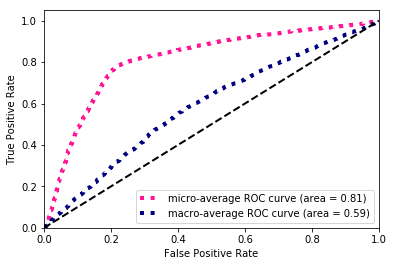

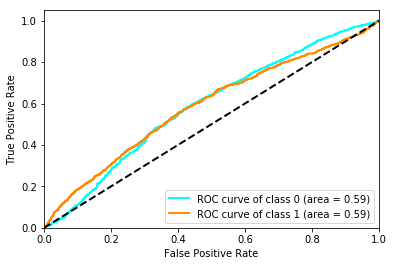

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.877643,0.000000,0.438821,0.781963,0.686284
precision,0.781963,0.000000,0.390982,0.781963,0.611467
recall,1.000000,0.000000,0.500000,0.781963,0.781963
support,4795.000000,1337.000000,6132.000000,6132.000000,6132.000000
auc,0.587115,0.587116,0.587300,0.811669,NaN


In [17]:
LosAngeles = compare_models(city='LosAngeles',classname='RNN')

In [18]:
LosAngeles.to_hdf('LosAngeles.h5',key='RNN')
LosAngeles

,NL,geohash,traffic,weather,time,geo
0_f1-score,0.829174,0.720567,0.833564,0.859391,0.827855,0.877643
1_f1-score,0.532398,0.500105,0.537323,0.538419,0.520761,0.000000
weighted avg_f1-score,0.764466,0.672498,0.768972,0.789407,0.760897,0.686284
micro avg_f1-score,0.750870,0.652805,0.755490,0.784899,0.747445,0.781963
macro avg_f1-score,0.680786,0.610336,0.685443,0.698905,0.674308,0.438821
0_precision,0.891545,0.917632,0.890052,0.878402,0.884368,0.781963
1_precision,0.455746,0.381955,0.459415,0.508715,0.447578,0.000000
weighted avg_precision,0.796525,0.800834,0.796157,0.797797,0.789132,0.611467
micro avg_precision,0.750870,0.652805,0.755490,0.784899,0.747445,0.781963
macro avg_precision,0.673646,0.649793,0.674734,0.693559,0.665973,0.390982


******************** RNN_embed_wo_NLP ********************
**********  round  0
load and test: shapes for train and test, X/Y
(30862, 315)
(30862, 2)
(6132, 315)
(6132, 2)
(30862, 8, 25)
(30862, 14)
(30862,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 25)        0                                            
__________________________________________________________________________________________________
embedding_1 (Embedding)         (None, 1, 128)       119680      geo_code[0][0]                   
__________________________________________________________________________________________________


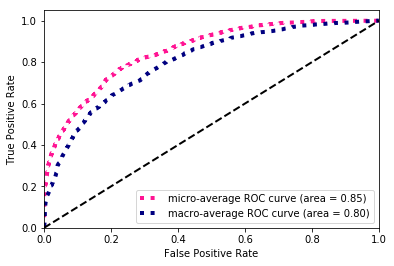

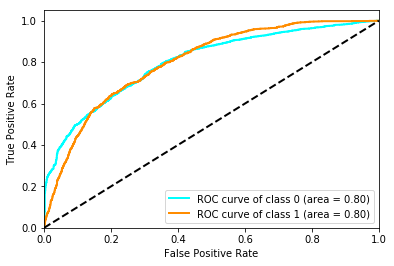

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.846355,0.540664,0.693509,0.769733,0.779703
precision,0.884869,0.478411,0.681640,0.769733,0.796246
recall,0.811053,0.621541,0.716297,0.769733,0.769733
support,4795.000000,1337.000000,6132.000000,6132.000000,6132.000000
auc,0.800364,0.800364,0.800569,0.853697,NaN


******************** RNN_embed_wo_NLP ********************
**********  round  1
load and test: shapes for train and test, X/Y
(30862, 315)
(30862, 2)
(6132, 315)
(6132, 2)
(30862, 8, 25)
(30862, 14)
(30862,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 25)        0                                            
__________________________________________________________________________________________________
embedding_2 (Embedding)         (None, 1, 128)       119680      geo_code[0][0]                   
__________________________________________________________________________________________________


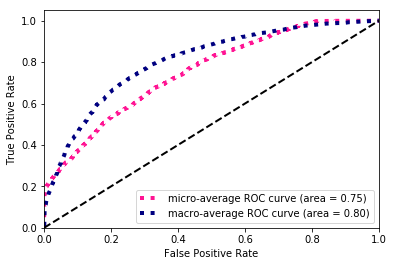

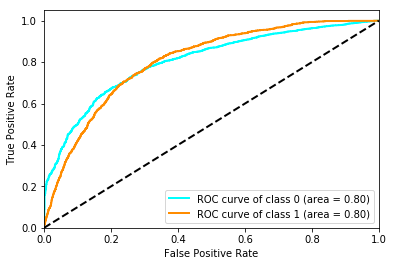

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.750000,0.528249,0.639124,0.673190,0.701650
precision,0.933251,0.385435,0.659343,0.673190,0.813807
recall,0.626903,0.839192,0.733048,0.673190,0.673190
support,4795.000000,1337.000000,6132.000000,6132.000000,6132.000000
auc,0.804576,0.804576,0.804789,0.752272,NaN


******************** RNN_embed_wo_NLP ********************
**********  round  2
load and test: shapes for train and test, X/Y
(30862, 315)
(30862, 2)
(6132, 315)
(6132, 2)
(30862, 8, 25)
(30862, 14)
(30862,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 25)        0                                            
__________________________________________________________________________________________________
embedding_3 (Embedding)         (None, 1, 128)       119680      geo_code[0][0]                   
__________________________________________________________________________________________________


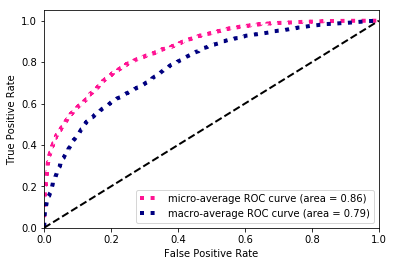

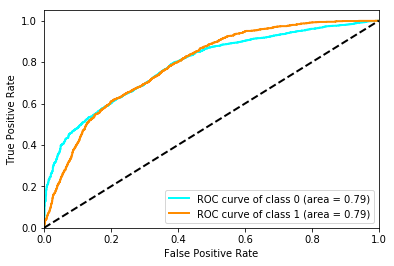

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.849394,0.521295,0.685345,0.770874,0.777857
precision,0.873842,0.478723,0.676283,0.770874,0.787692
recall,0.826277,0.572177,0.699227,0.770874,0.770874
support,4795.000000,1337.000000,6132.000000,6132.000000,6132.000000
auc,0.786119,0.786119,0.786332,0.860967,NaN


******************** RNN_embed_wo_geohash ********************
**********  round  0
load and test: shapes for train and test, X/Y
(30862, 315)
(30862, 2)
(6132, 315)
(6132, 2)
(30862, 8, 25)
(30862, 100)
(30862,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 25)        0                                            
__________________________________________________________________________________________________
embedding_4 (Embedding)         (None, 1, 128)       119680      geo_code[0][0]                   
______________________________________________________________________________________________

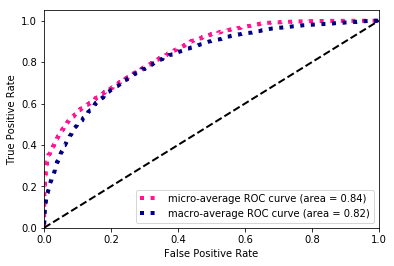

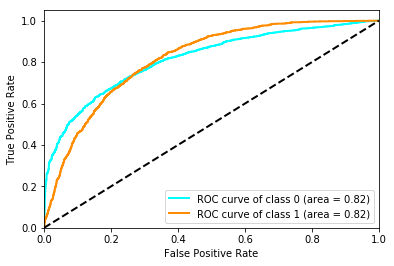

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.815028,0.547753,0.681390,0.737443,0.756752
precision,0.907393,0.438596,0.672995,0.737443,0.805178
recall,0.739729,0.729245,0.734487,0.737443,0.737443
support,4795.000000,1337.000000,6132.000000,6132.000000,6132.000000
auc,0.815755,0.815755,0.815963,0.844480,NaN


******************** RNN_embed_wo_geohash ********************
**********  round  1
load and test: shapes for train and test, X/Y
(30862, 315)
(30862, 2)
(6132, 315)
(6132, 2)
(30862, 8, 25)
(30862, 100)
(30862,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 25)        0                                            
__________________________________________________________________________________________________
embedding_5 (Embedding)         (None, 1, 128)       119680      geo_code[0][0]                   
______________________________________________________________________________________________

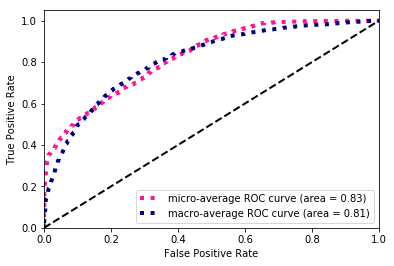

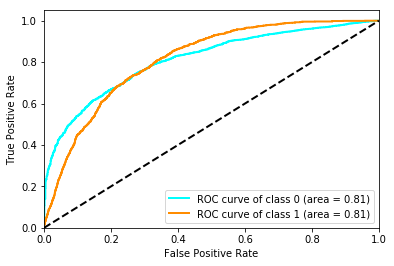

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.793771,0.538543,0.666157,0.714938,0.738122
precision,0.913882,0.416157,0.665019,0.714938,0.805360
recall,0.701564,0.762902,0.732233,0.714938,0.714938
support,4795.000000,1337.000000,6132.000000,6132.000000,6132.000000
auc,0.812381,0.812381,0.812582,0.825218,NaN


******************** RNN_embed_wo_geohash ********************
**********  round  2
load and test: shapes for train and test, X/Y
(30862, 315)
(30862, 2)
(6132, 315)
(6132, 2)
(30862, 8, 25)
(30862, 100)
(30862,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 25)        0                                            
__________________________________________________________________________________________________
embedding_6 (Embedding)         (None, 1, 128)       119680      geo_code[0][0]                   
______________________________________________________________________________________________

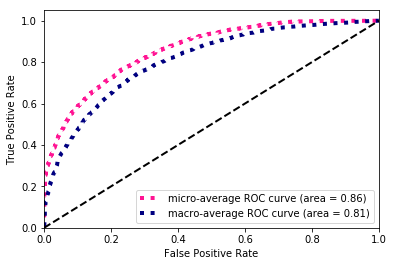

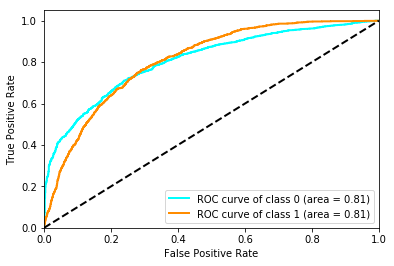

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.842993,0.543194,0.693094,0.766308,0.777626
precision,0.888042,0.473333,0.680688,0.766308,0.797621
recall,0.802294,0.637248,0.719771,0.766308,0.766308
support,4795.000000,1337.000000,6132.000000,6132.000000,6132.000000
auc,0.808356,0.808356,0.808550,0.857871,NaN


******************** RNN_embed ********************
**********  round  0
load and test: shapes for train and test, X/Y
(30862, 251)
(30862, 2)
(6132, 251)
(6132, 2)
(30862, 8, 17)
(30862, 14)
(30862, 100)
(30862,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 17)        0                                            
__________________________________________________________________________________________________
embedding_7 (Embedding)         (None, 1, 128)       119680      geo_code[0][0]                   
_____________________________________________________________________________________________

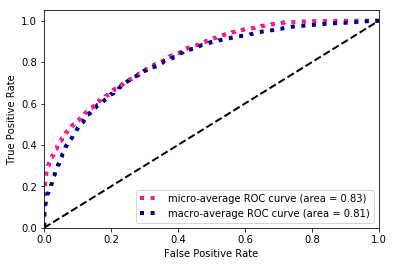

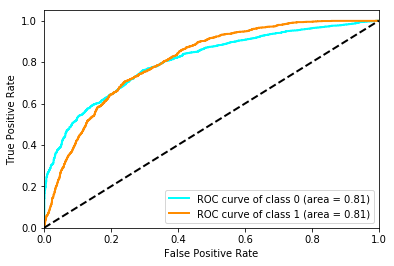

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.807675,0.539313,0.673494,0.728637,0.749162
precision,0.905885,0.428132,0.667009,0.728637,0.801718
recall,0.728676,0.728497,0.728586,0.728637,0.728637
support,4795.000000,1337.000000,6132.000000,6132.000000,6132.000000
auc,0.806334,0.806334,0.806538,0.828620,NaN


******************** RNN_embed ********************
**********  round  1
load and test: shapes for train and test, X/Y
(30862, 251)
(30862, 2)
(6132, 251)
(6132, 2)
(30862, 8, 17)
(30862, 14)
(30862, 100)
(30862,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 17)        0                                            
__________________________________________________________________________________________________
embedding_8 (Embedding)         (None, 1, 128)       119680      geo_code[0][0]                   
_____________________________________________________________________________________________

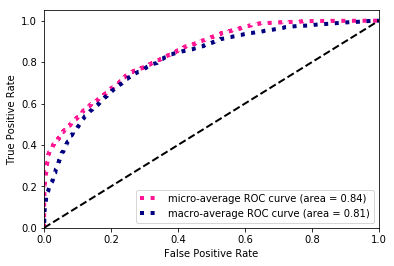

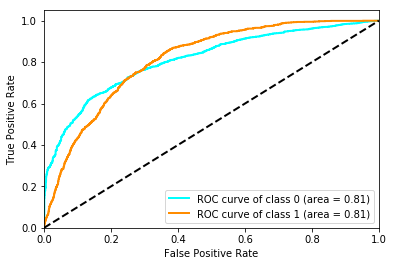

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.821384,0.551131,0.686258,0.744455,0.762459
precision,0.905732,0.446611,0.676171,0.744455,0.805626
recall,0.751408,0.719521,0.735465,0.744455,0.744455
support,4795.000000,1337.000000,6132.000000,6132.000000,6132.000000
auc,0.811798,0.811797,0.812001,0.840047,NaN


******************** RNN_embed ********************
**********  round  2
load and test: shapes for train and test, X/Y
(30862, 251)
(30862, 2)
(6132, 251)
(6132, 2)
(30862, 8, 17)
(30862, 14)
(30862, 100)
(30862,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 17)        0                                            
__________________________________________________________________________________________________
embedding_9 (Embedding)         (None, 1, 128)       119680      geo_code[0][0]                   
_____________________________________________________________________________________________

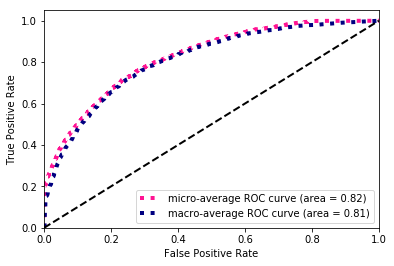

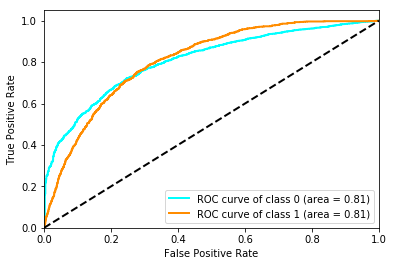

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.814535,0.542938,0.678736,0.736138,0.755317
precision,0.904301,0.436223,0.670262,0.736138,0.802243
recall,0.740980,0.718773,0.729877,0.736138,0.736138
support,4795.000000,1337.000000,6132.000000,6132.000000,6132.000000
auc,0.808275,0.808275,0.808487,0.823982,NaN


******************** RNN_embed ********************
**********  round  0
load and test: shapes for train and test, X/Y
(30862, 235)
(30862, 2)
(6132, 235)
(6132, 2)
(30862, 8, 15)
(30862, 14)
(30862, 100)
(30862,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 15)        0                                            
__________________________________________________________________________________________________
embedding_10 (Embedding)        (None, 1, 128)       119680      geo_code[0][0]                   
_____________________________________________________________________________________________

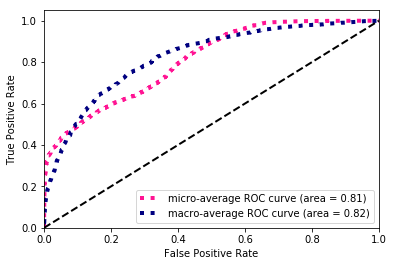

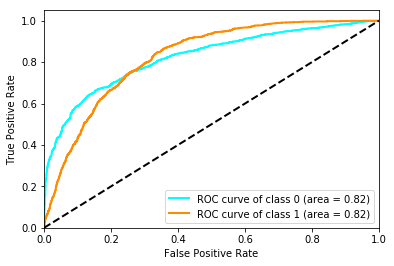

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.754580,0.544481,0.649530,0.681018,0.708770
precision,0.947087,0.395333,0.671210,0.681018,0.826784
recall,0.627112,0.874346,0.750729,0.681018,0.681018
support,4795.000000,1337.000000,6132.000000,6132.000000,6132.000000
auc,0.823782,0.823782,0.823919,0.806927,NaN


******************** RNN_embed ********************
**********  round  1
load and test: shapes for train and test, X/Y
(30862, 235)
(30862, 2)
(6132, 235)
(6132, 2)
(30862, 8, 15)
(30862, 14)
(30862, 100)
(30862,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 15)        0                                            
__________________________________________________________________________________________________
embedding_11 (Embedding)        (None, 1, 128)       119680      geo_code[0][0]                   
_____________________________________________________________________________________________

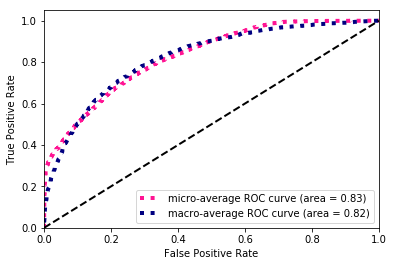

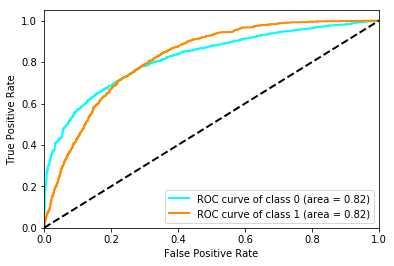

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.809319,0.555042,0.682180,0.733040,0.753877
precision,0.916623,0.435952,0.676287,0.733040,0.811819
recall,0.724505,0.763650,0.744077,0.733040,0.733040
support,4795.000000,1337.000000,6132.000000,6132.000000,6132.000000
auc,0.821167,0.821168,0.821298,0.826529,NaN


******************** RNN_embed ********************
**********  round  2
load and test: shapes for train and test, X/Y
(30862, 235)
(30862, 2)
(6132, 235)
(6132, 2)
(30862, 8, 15)
(30862, 14)
(30862, 100)
(30862,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 15)        0                                            
__________________________________________________________________________________________________
embedding_12 (Embedding)        (None, 1, 128)       119680      geo_code[0][0]                   
_____________________________________________________________________________________________

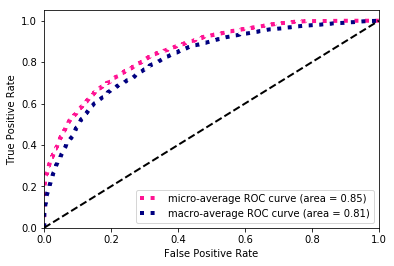

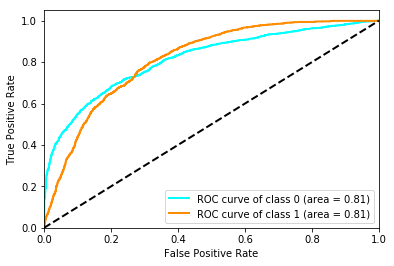

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.834521,0.547503,0.691012,0.757665,0.771941
precision,0.895341,0.461736,0.678538,0.757665,0.800799
recall,0.781439,0.672401,0.726920,0.757665,0.757665
support,4795.000000,1337.000000,6132.000000,6132.000000,6132.000000
auc,0.814528,0.814528,0.814666,0.849603,NaN


******************** RNN_embed ********************
**********  round  0
load and test: shapes for train and test, X/Y
(30862, 259)
(30862, 2)
(6132, 259)
(6132, 2)
(30862, 8, 18)
(30862, 14)
(30862, 100)
(30862,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 18)        0                                            
__________________________________________________________________________________________________
embedding_13 (Embedding)        (None, 1, 128)       119680      geo_code[0][0]                   
_____________________________________________________________________________________________

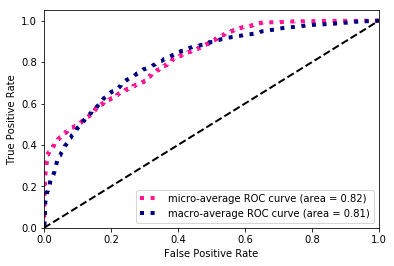

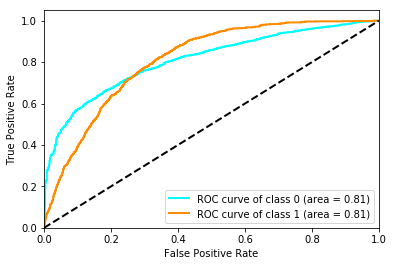

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.781951,0.537777,0.659864,0.703686,0.728712
precision,0.920859,0.407479,0.664169,0.703686,0.808924
recall,0.679458,0.790576,0.735017,0.703686,0.703686
support,4795.000000,1337.000000,6132.000000,6132.000000,6132.000000
auc,0.810732,0.810732,0.810930,0.820652,NaN


******************** RNN_embed ********************
**********  round  1
load and test: shapes for train and test, X/Y
(30862, 259)
(30862, 2)
(6132, 259)
(6132, 2)
(30862, 8, 18)
(30862, 14)
(30862, 100)
(30862,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 18)        0                                            
__________________________________________________________________________________________________
embedding_14 (Embedding)        (None, 1, 128)       119680      geo_code[0][0]                   
_____________________________________________________________________________________________

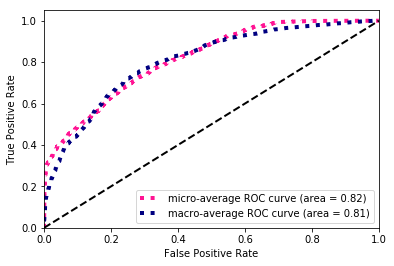

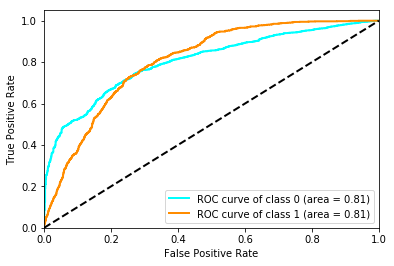

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.801638,0.544232,0.672935,0.723581,0.745514
precision,0.913333,0.424853,0.669093,0.723581,0.806827
recall,0.714286,0.756918,0.735602,0.723581,0.723581
support,4795.000000,1337.000000,6132.000000,6132.000000,6132.000000
auc,0.805348,0.805348,0.805549,0.816638,NaN


******************** RNN_embed ********************
**********  round  2
load and test: shapes for train and test, X/Y
(30862, 259)
(30862, 2)
(6132, 259)
(6132, 2)
(30862, 8, 18)
(30862, 14)
(30862, 100)
(30862,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 18)        0                                            
__________________________________________________________________________________________________
embedding_15 (Embedding)        (None, 1, 128)       119680      geo_code[0][0]                   
_____________________________________________________________________________________________

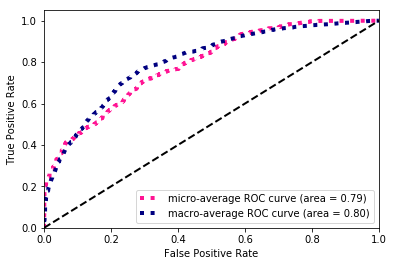

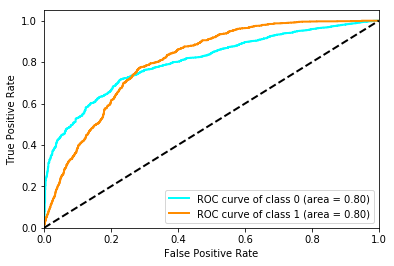

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.782368,0.539868,0.661118,0.704501,0.729495
precision,0.922402,0.408689,0.665545,0.704501,0.810393
recall,0.679249,0.795064,0.737156,0.704501,0.704501
support,4795.000000,1337.000000,6132.000000,6132.000000,6132.000000
auc,0.803491,0.803491,0.803691,0.788745,NaN


******************** RNN_embed_wo_geo ********************
**********  round  0
load and test: shapes for train and test, X/Y
(30862, 251)
(30862, 2)
(6132, 251)
(6132, 2)
(30862, 8, 17)
(30862,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 17)        0                                            
__________________________________________________________________________________________________
embedding_16 (Embedding)        (None, 1, 128)       119680      geo_code[0][0]                   
__________________________________________________________________________________________________
lstm_67 (LST

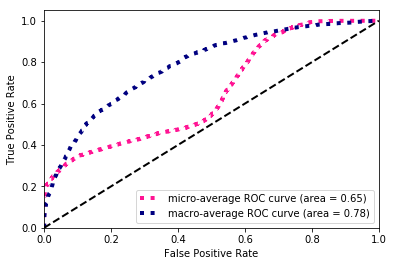

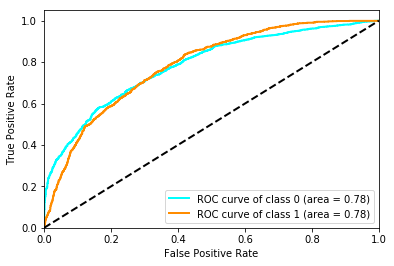

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.570051,0.456911,0.513481,0.520059,0.545382
precision,0.951707,0.303283,0.627495,0.520059,0.810327
recall,0.406882,0.925954,0.666418,0.520059,0.520059
support,4795.000000,1337.000000,6132.000000,6132.000000,6132.000000
auc,0.784563,0.784563,0.784780,0.653162,NaN


******************** RNN_embed_wo_geo ********************
**********  round  1
load and test: shapes for train and test, X/Y
(30862, 251)
(30862, 2)
(6132, 251)
(6132, 2)
(30862, 8, 17)
(30862,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 17)        0                                            
__________________________________________________________________________________________________
embedding_17 (Embedding)        (None, 1, 128)       119680      geo_code[0][0]                   
__________________________________________________________________________________________________
lstm_69 (LST

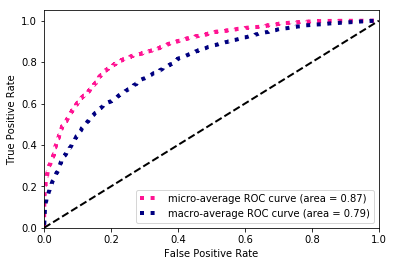

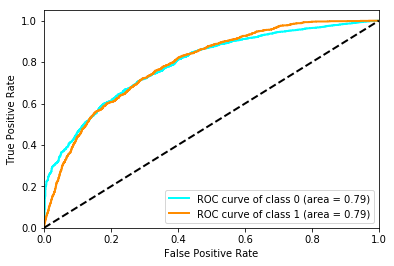

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.865391,0.523862,0.694627,0.790117,0.790925
precision,0.868023,0.518302,0.693163,0.790117,0.791771
recall,0.862774,0.529544,0.696159,0.790117,0.790117
support,4795.000000,1337.000000,6132.000000,6132.000000,6132.000000
auc,0.790974,0.790974,0.791186,0.866391,NaN


******************** RNN_embed_wo_geo ********************
**********  round  2
load and test: shapes for train and test, X/Y
(30862, 251)
(30862, 2)
(6132, 251)
(6132, 2)
(30862, 8, 17)
(30862,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 17)        0                                            
__________________________________________________________________________________________________
embedding_18 (Embedding)        (None, 1, 128)       119680      geo_code[0][0]                   
__________________________________________________________________________________________________
lstm_71 (LST

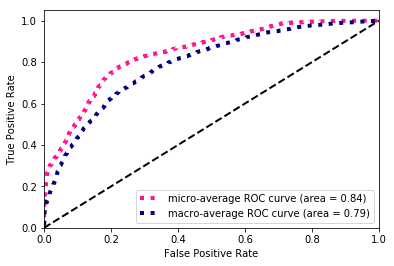

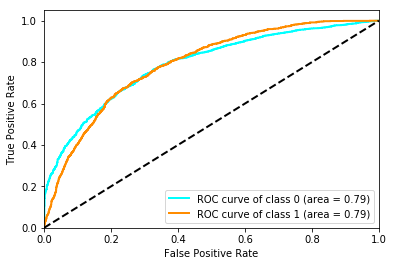

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.854392,0.511016,0.682704,0.775603,0.779523
precision,0.867240,0.486798,0.677019,0.775603,0.784289
recall,0.841919,0.537771,0.689845,0.775603,0.775603
support,4795.000000,1337.000000,6132.000000,6132.000000,6132.000000
auc,0.789650,0.789650,0.789867,0.841862,NaN


In [19]:
LosAngeles = compare_models(city='LosAngeles',classname='RNN_embed')

In [20]:
LosAngeles.to_hdf('LosAngeles.h5',key='RNN_embed')
LosAngeles

,NL,geohash,traffic,weather,time,geo
0_f1-score,0.815250,0.817264,0.814531,0.799473,0.788653,0.763278
1_f1-score,0.530069,0.543163,0.544461,0.549009,0.540626,0.497263
weighted avg_f1-score,0.753070,0.757500,0.755646,0.744863,0.734574,0.705277
micro avg_f1-score,0.737932,0.739563,0.736410,0.723907,0.710589,0.695260
macro avg_f1-score,0.672659,0.680214,0.679496,0.674241,0.664639,0.630270
0_precision,0.897321,0.903106,0.905306,0.919683,0.918865,0.895657
1_precision,0.447523,0.442695,0.436989,0.431007,0.413674,0.436127
weighted avg_precision,0.799248,0.802720,0.803196,0.813134,0.808715,0.795463
micro avg_precision,0.737932,0.739563,0.736410,0.723907,0.710589,0.695260
macro avg_precision,0.672422,0.672901,0.671147,0.675345,0.666269,0.665892


# Austin

******************** DNN ********************
**********  round  0
load and test: shapes for train and test, X/Y
(22890, 214)
(22890, 2)
(4664, 214)
(4664, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 214)               0         
_________________________________________________________________
dense_211 (Dense)            (None, 512)               110080    
_________________________________________________________________
dense_212 (Dense)            (None, 256)               131328    
_________________________________________________________________
batch_normalization_73 (Batc (None, 256)               1024      
_________________________________________________________________
activation_73 (Activation)   (None, 256)               0         
_________________________________________________________________
dropout_37 (Dropout)         (None, 256)         

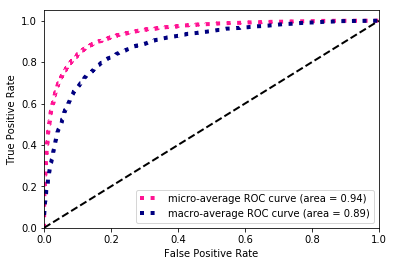

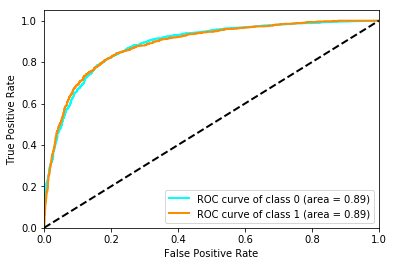

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.921696,0.632927,0.777311,0.870926,0.872103
precision,0.926275,0.618594,0.772434,0.870926,0.873433
recall,0.917163,0.647940,0.782551,0.870926,0.870926
support,3863.000000,801.000000,4664.000000,4664.000000,4664.000000
auc,0.885560,0.885560,0.885836,0.941492,NaN


******************** DNN ********************
**********  round  1
load and test: shapes for train and test, X/Y
(22890, 214)
(22890, 2)
(4664, 214)
(4664, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 214)               0         
_________________________________________________________________
dense_215 (Dense)            (None, 512)               110080    
_________________________________________________________________
dense_216 (Dense)            (None, 256)               131328    
_________________________________________________________________
batch_normalization_75 (Batc (None, 256)               1024      
_________________________________________________________________
activation_75 (Activation)   (None, 256)               0         
_________________________________________________________________
dropout_38 (Dropout)         (None, 256)         

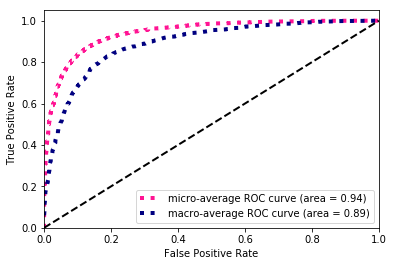

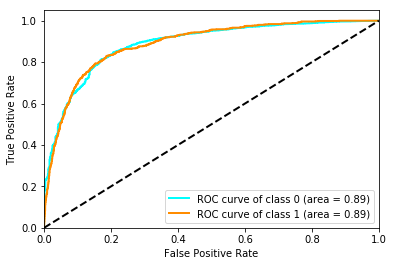

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.921135,0.631387,0.776261,0.870069,0.871373
precision,0.926197,0.615658,0.770928,0.870069,0.872865
recall,0.916127,0.647940,0.782034,0.870069,0.870069
support,3863.000000,801.000000,4664.000000,4664.000000,4664.000000
auc,0.888461,0.888461,0.888732,0.941475,NaN


******************** DNN ********************
**********  round  2
load and test: shapes for train and test, X/Y
(22890, 214)
(22890, 2)
(4664, 214)
(4664, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 214)               0         
_________________________________________________________________
dense_219 (Dense)            (None, 512)               110080    
_________________________________________________________________
dense_220 (Dense)            (None, 256)               131328    
_________________________________________________________________
batch_normalization_77 (Batc (None, 256)               1024      
_________________________________________________________________
activation_77 (Activation)   (None, 256)               0         
_________________________________________________________________
dropout_39 (Dropout)         (None, 256)         

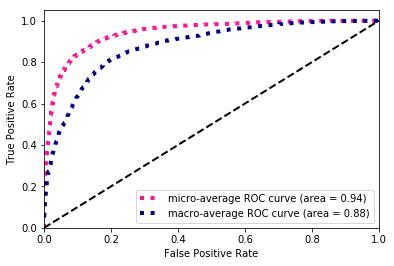

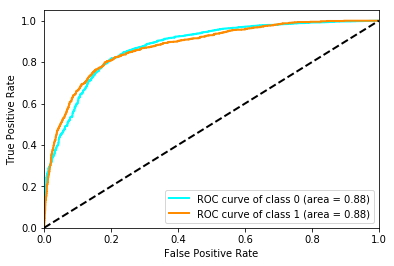

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.921400,0.599084,0.760242,0.868568,0.866045
precision,0.912856,0.629121,0.770988,0.868568,0.864127
recall,0.930106,0.571785,0.750946,0.868568,0.868568
support,3863.000000,801.000000,4664.000000,4664.000000,4664.000000
auc,0.876176,0.876176,0.876473,0.942065,NaN


******************** DNN ********************
**********  round  0
load and test: shapes for train and test, X/Y
(22890, 300)
(22890, 2)
(4664, 300)
(4664, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 300)               0         
_________________________________________________________________
dense_223 (Dense)            (None, 512)               154112    
_________________________________________________________________
dense_224 (Dense)            (None, 256)               131328    
_________________________________________________________________
batch_normalization_79 (Batc (None, 256)               1024      
_________________________________________________________________
activation_79 (Activation)   (None, 256)               0         
_________________________________________________________________
dropout_40 (Dropout)         (None, 256)         

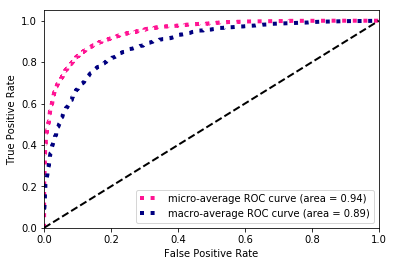

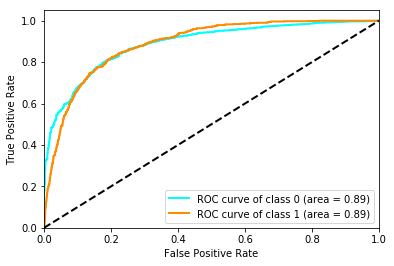

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.920201,0.605983,0.763092,0.867281,0.866237
precision,0.916538,0.618182,0.767360,0.867281,0.865298
recall,0.923893,0.594257,0.759075,0.867281,0.867281
support,3863.000000,801.000000,4664.000000,4664.000000,4664.000000
auc,0.887824,0.887824,0.888077,0.943876,NaN


******************** DNN ********************
**********  round  1
load and test: shapes for train and test, X/Y
(22890, 300)
(22890, 2)
(4664, 300)
(4664, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 300)               0         
_________________________________________________________________
dense_227 (Dense)            (None, 512)               154112    
_________________________________________________________________
dense_228 (Dense)            (None, 256)               131328    
_________________________________________________________________
batch_normalization_81 (Batc (None, 256)               1024      
_________________________________________________________________
activation_81 (Activation)   (None, 256)               0         
_________________________________________________________________
dropout_41 (Dropout)         (None, 256)         

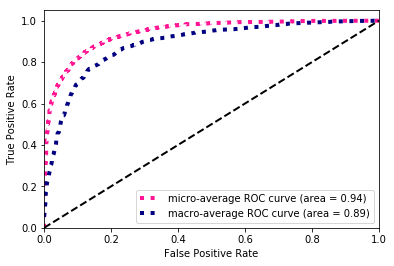

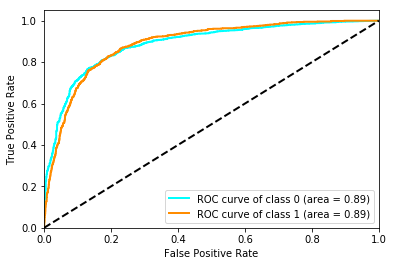

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.916776,0.629240,0.773008,0.864065,0.867394
precision,0.929960,0.591859,0.760910,0.864065,0.871894
recall,0.903961,0.671660,0.787811,0.864065,0.864065
support,3863.000000,801.000000,4664.000000,4664.000000,4664.000000
auc,0.887843,0.887843,0.888110,0.941040,NaN


******************** DNN ********************
**********  round  2
load and test: shapes for train and test, X/Y
(22890, 300)
(22890, 2)
(4664, 300)
(4664, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 300)               0         
_________________________________________________________________
dense_231 (Dense)            (None, 512)               154112    
_________________________________________________________________
dense_232 (Dense)            (None, 256)               131328    
_________________________________________________________________
batch_normalization_83 (Batc (None, 256)               1024      
_________________________________________________________________
activation_83 (Activation)   (None, 256)               0         
_________________________________________________________________
dropout_42 (Dropout)         (None, 256)         

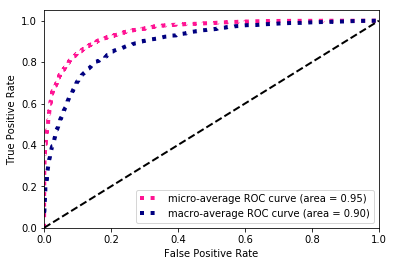

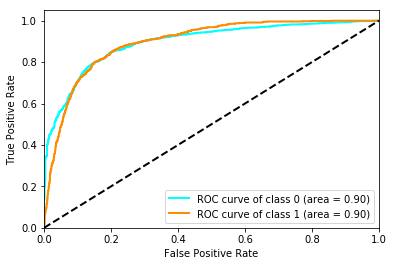

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.924178,0.606503,0.765341,0.872856,0.869621
precision,0.913087,0.647309,0.780198,0.872856,0.867442
recall,0.935542,0.570537,0.753040,0.872856,0.872856
support,3863.000000,801.000000,4664.000000,4664.000000,4664.000000
auc,0.895780,0.895780,0.896048,0.948556,NaN


******************** DNN ********************
**********  round  0
load and test: shapes for train and test, X/Y
(22890, 250)
(22890, 2)
(4664, 250)
(4664, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 250)               0         
_________________________________________________________________
dense_235 (Dense)            (None, 512)               128512    
_________________________________________________________________
dense_236 (Dense)            (None, 256)               131328    
_________________________________________________________________
batch_normalization_85 (Batc (None, 256)               1024      
_________________________________________________________________
activation_85 (Activation)   (None, 256)               0         
_________________________________________________________________
dropout_43 (Dropout)         (None, 256)         

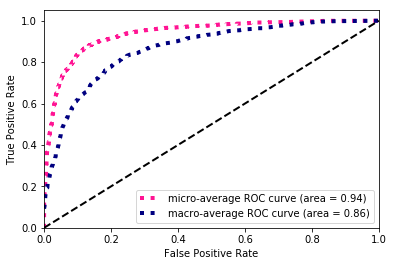

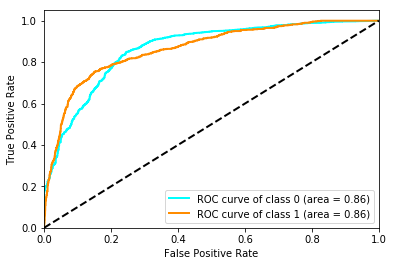

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.923215,0.615583,0.769399,0.871998,0.870382
precision,0.917434,0.635638,0.776536,0.871998,0.869038
recall,0.929071,0.596754,0.762912,0.871998,0.871998
support,3863.000000,801.000000,4664.000000,4664.000000,4664.000000
auc,0.864200,0.864200,0.864497,0.937092,NaN


******************** DNN ********************
**********  round  1
load and test: shapes for train and test, X/Y
(22890, 250)
(22890, 2)
(4664, 250)
(4664, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 250)               0         
_________________________________________________________________
dense_239 (Dense)            (None, 512)               128512    
_________________________________________________________________
dense_240 (Dense)            (None, 256)               131328    
_________________________________________________________________
batch_normalization_87 (Batc (None, 256)               1024      
_________________________________________________________________
activation_87 (Activation)   (None, 256)               0         
_________________________________________________________________
dropout_44 (Dropout)         (None, 256)         

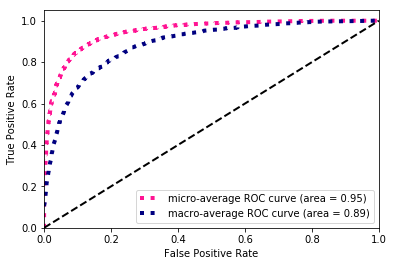

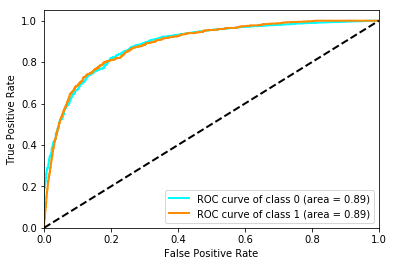

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.927176,0.603043,0.765109,0.876930,0.871509
precision,0.909181,0.675969,0.792575,0.876930,0.869129
recall,0.945897,0.544320,0.745108,0.876930,0.876930
support,3863.000000,801.000000,4664.000000,4664.000000,4664.000000
auc,0.887176,0.887176,0.887453,0.946877,NaN


******************** DNN ********************
**********  round  2
load and test: shapes for train and test, X/Y
(22890, 250)
(22890, 2)
(4664, 250)
(4664, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 250)               0         
_________________________________________________________________
dense_243 (Dense)            (None, 512)               128512    
_________________________________________________________________
dense_244 (Dense)            (None, 256)               131328    
_________________________________________________________________
batch_normalization_89 (Batc (None, 256)               1024      
_________________________________________________________________
activation_89 (Activation)   (None, 256)               0         
_________________________________________________________________
dropout_45 (Dropout)         (None, 256)         

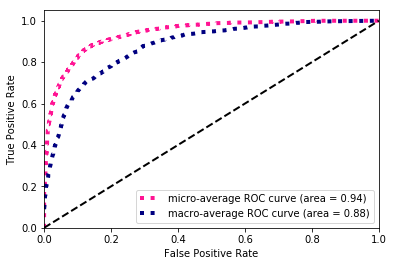

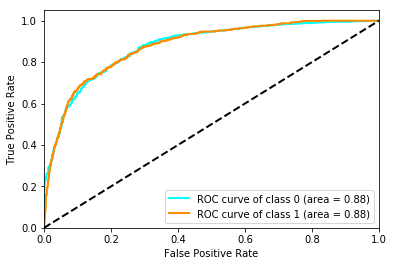

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.920083,0.619753,0.769918,0.867925,0.868504
precision,0.922237,0.612943,0.767590,0.867925,0.869118
recall,0.917939,0.626717,0.772328,0.867925,0.867925
support,3863.000000,801.000000,4664.000000,4664.000000,4664.000000
auc,0.877328,0.877328,0.877591,0.939378,NaN


******************** DNN ********************
**********  round  0
load and test: shapes for train and test, X/Y
(22890, 234)
(22890, 2)
(4664, 234)
(4664, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 234)               0         
_________________________________________________________________
dense_247 (Dense)            (None, 512)               120320    
_________________________________________________________________
dense_248 (Dense)            (None, 256)               131328    
_________________________________________________________________
batch_normalization_91 (Batc (None, 256)               1024      
_________________________________________________________________
activation_91 (Activation)   (None, 256)               0         
_________________________________________________________________
dropout_46 (Dropout)         (None, 256)         

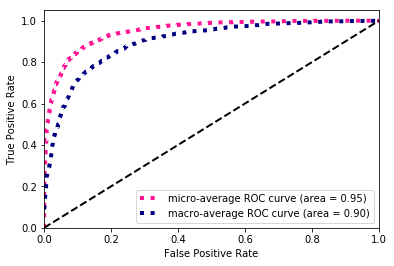

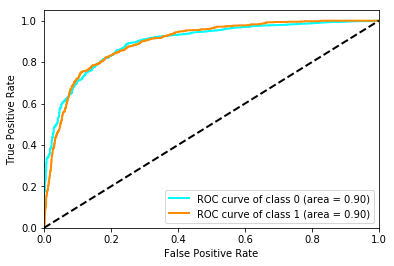

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.925974,0.649877,0.787926,0.877787,0.878557
precision,0.929111,0.639661,0.784386,0.877787,0.879401
recall,0.922858,0.660424,0.791641,0.877787,0.877787
support,3863.000000,801.000000,4664.000000,4664.000000,4664.000000
auc,0.896098,0.896098,0.896252,0.948650,NaN


******************** DNN ********************
**********  round  1
load and test: shapes for train and test, X/Y
(22890, 234)
(22890, 2)
(4664, 234)
(4664, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 234)               0         
_________________________________________________________________
dense_251 (Dense)            (None, 512)               120320    
_________________________________________________________________
dense_252 (Dense)            (None, 256)               131328    
_________________________________________________________________
batch_normalization_93 (Batc (None, 256)               1024      
_________________________________________________________________
activation_93 (Activation)   (None, 256)               0         
_________________________________________________________________
dropout_47 (Dropout)         (None, 256)         

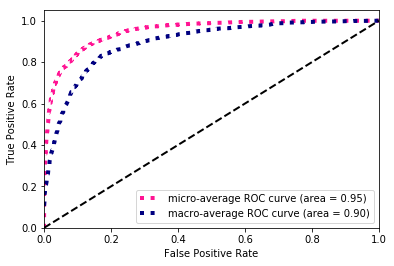

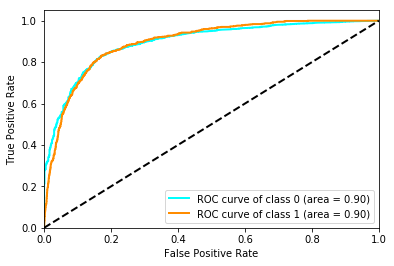

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.924363,0.621622,0.772992,0.873928,0.872370
precision,0.918691,0.641434,0.780063,0.873928,0.871075
recall,0.930106,0.602996,0.766551,0.873928,0.873928
support,3863.000000,801.000000,4664.000000,4664.000000,4664.000000
auc,0.895332,0.895332,0.895475,0.948766,NaN


******************** DNN ********************
**********  round  2
load and test: shapes for train and test, X/Y
(22890, 234)
(22890, 2)
(4664, 234)
(4664, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 234)               0         
_________________________________________________________________
dense_255 (Dense)            (None, 512)               120320    
_________________________________________________________________
dense_256 (Dense)            (None, 256)               131328    
_________________________________________________________________
batch_normalization_95 (Batc (None, 256)               1024      
_________________________________________________________________
activation_95 (Activation)   (None, 256)               0         
_________________________________________________________________
dropout_48 (Dropout)         (None, 256)         

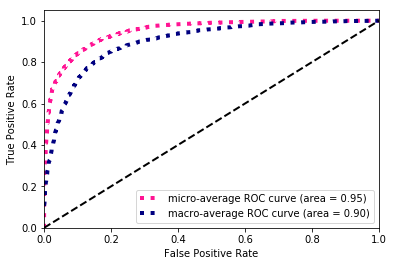

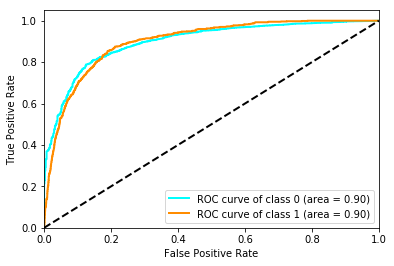

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.922618,0.629882,0.776250,0.871998,0.872343
precision,0.923936,0.625616,0.774776,0.871998,0.872702
recall,0.921305,0.634207,0.777756,0.871998,0.871998
support,3863.000000,801.000000,4664.000000,4664.000000,4664.000000
auc,0.898803,0.898803,0.898966,0.949322,NaN


******************** DNN ********************
**********  round  0
load and test: shapes for train and test, X/Y
(22890, 258)
(22890, 2)
(4664, 258)
(4664, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 258)               0         
_________________________________________________________________
dense_259 (Dense)            (None, 512)               132608    
_________________________________________________________________
dense_260 (Dense)            (None, 256)               131328    
_________________________________________________________________
batch_normalization_97 (Batc (None, 256)               1024      
_________________________________________________________________
activation_97 (Activation)   (None, 256)               0         
_________________________________________________________________
dropout_49 (Dropout)         (None, 256)         

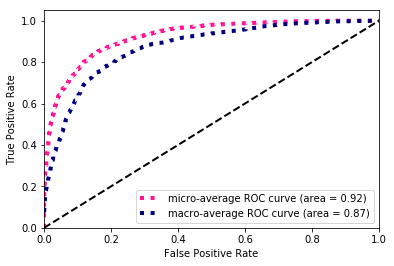

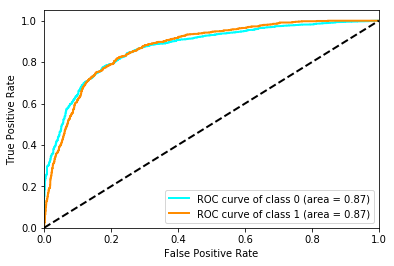

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.903700,0.608365,0.756032,0.845412,0.852979
precision,0.933499,0.538462,0.735980,0.845412,0.865655
recall,0.875744,0.699126,0.787435,0.845412,0.845412
support,3863.000000,801.000000,4664.000000,4664.000000,4664.000000
auc,0.871359,0.871359,0.871633,0.923420,NaN


******************** DNN ********************
**********  round  1
load and test: shapes for train and test, X/Y
(22890, 258)
(22890, 2)
(4664, 258)
(4664, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 258)               0         
_________________________________________________________________
dense_263 (Dense)            (None, 512)               132608    
_________________________________________________________________
dense_264 (Dense)            (None, 256)               131328    
_________________________________________________________________
batch_normalization_99 (Batc (None, 256)               1024      
_________________________________________________________________
activation_99 (Activation)   (None, 256)               0         
_________________________________________________________________
dropout_50 (Dropout)         (None, 256)         

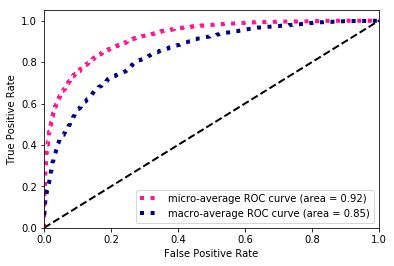

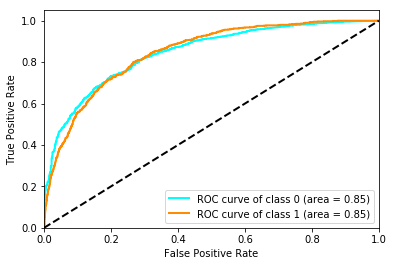

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.900039,0.543284,0.721661,0.835978,0.838770
precision,0.908707,0.520595,0.714651,0.835978,0.842052
recall,0.891535,0.568040,0.729788,0.835978,0.835978
support,3863.000000,801.000000,4664.000000,4664.000000,4664.000000
auc,0.846004,0.846004,0.846286,0.920793,NaN


******************** DNN ********************
**********  round  2
load and test: shapes for train and test, X/Y
(22890, 258)
(22890, 2)
(4664, 258)
(4664, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 258)               0         
_________________________________________________________________
dense_267 (Dense)            (None, 512)               132608    
_________________________________________________________________
dense_268 (Dense)            (None, 256)               131328    
_________________________________________________________________
batch_normalization_101 (Bat (None, 256)               1024      
_________________________________________________________________
activation_101 (Activation)  (None, 256)               0         
_________________________________________________________________
dropout_51 (Dropout)         (None, 256)         

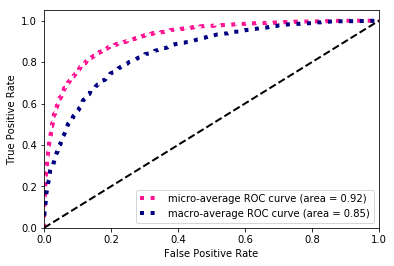

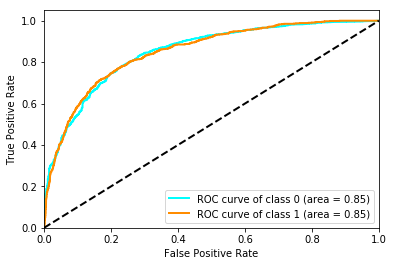

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.903311,0.571096,0.737203,0.842196,0.846256
precision,0.917045,0.535519,0.726282,0.842196,0.851521
recall,0.889982,0.611735,0.750859,0.842196,0.842196
support,3863.000000,801.000000,4664.000000,4664.000000,4664.000000
auc,0.850120,0.850120,0.850421,0.918787,NaN


******************** DNN ********************
**********  round  0
load and test: shapes for train and test, X/Y
(22890, 136)
(22890, 2)
(4664, 136)
(4664, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 136)               0         
_________________________________________________________________
dense_271 (Dense)            (None, 512)               70144     
_________________________________________________________________
dense_272 (Dense)            (None, 256)               131328    
_________________________________________________________________
batch_normalization_103 (Bat (None, 256)               1024      
_________________________________________________________________
activation_103 (Activation)  (None, 256)               0         
_________________________________________________________________
dropout_52 (Dropout)         (None, 256)         

/users/PAS0536/osu9965/.local/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


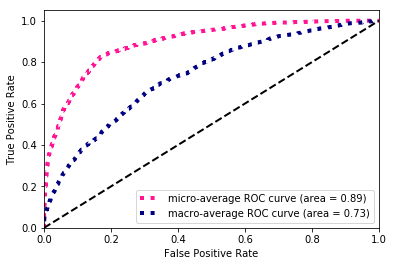

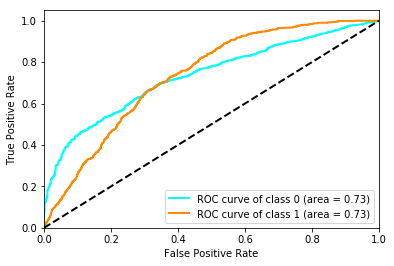

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.906063,0.000000,0.453032,0.828259,0.750455
precision,0.828259,0.000000,0.414130,0.828259,0.686013
recall,1.000000,0.000000,0.500000,0.828259,0.828259
support,3863.000000,801.000000,4664.000000,4664.000000,4664.000000
auc,0.734309,0.734309,0.734485,0.894918,NaN


******************** DNN ********************
**********  round  1
load and test: shapes for train and test, X/Y
(22890, 136)
(22890, 2)
(4664, 136)
(4664, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 136)               0         
_________________________________________________________________
dense_275 (Dense)            (None, 512)               70144     
_________________________________________________________________
dense_276 (Dense)            (None, 256)               131328    
_________________________________________________________________
batch_normalization_105 (Bat (None, 256)               1024      
_________________________________________________________________
activation_105 (Activation)  (None, 256)               0         
_________________________________________________________________
dropout_53 (Dropout)         (None, 256)         

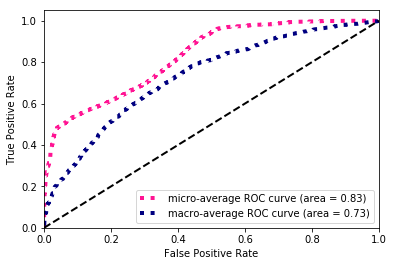

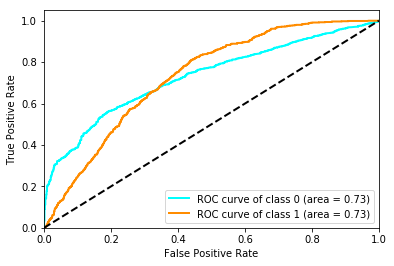

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.796493,0.402532,0.599512,0.696398,0.728834
precision,0.895315,0.304015,0.599665,0.696398,0.793765
recall,0.717318,0.595506,0.656412,0.696398,0.696398
support,3863.000000,801.000000,4664.000000,4664.000000,4664.000000
auc,0.730442,0.730442,0.730633,0.826759,NaN


******************** DNN ********************
**********  round  2
load and test: shapes for train and test, X/Y
(22890, 136)
(22890, 2)
(4664, 136)
(4664, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 136)               0         
_________________________________________________________________
dense_279 (Dense)            (None, 512)               70144     
_________________________________________________________________
dense_280 (Dense)            (None, 256)               131328    
_________________________________________________________________
batch_normalization_107 (Bat (None, 256)               1024      
_________________________________________________________________
activation_107 (Activation)  (None, 256)               0         
_________________________________________________________________
dropout_54 (Dropout)         (None, 256)         

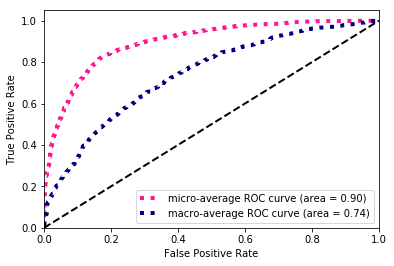

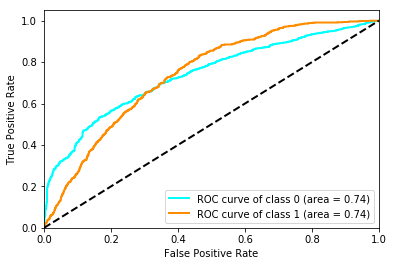

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.904262,0.053676,0.478969,0.826115,0.758181
precision,0.831163,0.410714,0.620939,0.826115,0.758955
recall,0.991457,0.028714,0.510086,0.826115,0.826115
support,3863.000000,801.000000,4664.000000,4664.000000,4664.000000
auc,0.738327,0.738327,0.738496,0.895982,NaN


In [21]:
Austin = compare_models(city='Austin',classname='DNN')

In [22]:
Austin.to_hdf('Austin.h5',key='DNN')
Austin

,NL,geohash,traffic,weather,time,geo
0_f1-score,0.921410,0.920385,0.923491,0.924319,0.902350,0.868939
1_f1-score,0.621133,0.613909,0.612793,0.633794,0.574248,0.152069
weighted avg_f1-score,0.869840,0.867751,0.870132,0.874423,0.846001,0.745823
micro avg_f1-score,0.869854,0.868067,0.872284,0.874571,0.841195,0.783591
macro avg_f1-score,0.771272,0.767147,0.768142,0.779056,0.738299,0.510504
0_precision,0.921776,0.919862,0.916284,0.923913,0.919750,0.851579
1_precision,0.621124,0.619117,0.641517,0.635570,0.531525,0.238243
weighted avg_precision,0.870142,0.868212,0.869095,0.874392,0.853076,0.746244
micro avg_precision,0.869854,0.868067,0.872284,0.874571,0.841195,0.783591
macro avg_precision,0.771450,0.769489,0.778900,0.779742,0.725638,0.544911


******************** RNN_wo_NLP ********************
**********  round  0
load and test: shapes for train and test, X/Y
(22890, 314)
(22890, 2)
(4664, 314)
(4664, 2)
(22890, 8, 25)
(22890, 14)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 25)        0                                            
__________________________________________________________________________________________________
lstm_73 (LSTM)                  (None, 8, 128)       78848       main_input[0][0]                 
__________________________________________________________________________________________________
geohash_input (InputLayer)      (None, 14)           0                                            
__________________________________________________________________________________________________
lstm_74 (LSTM) 

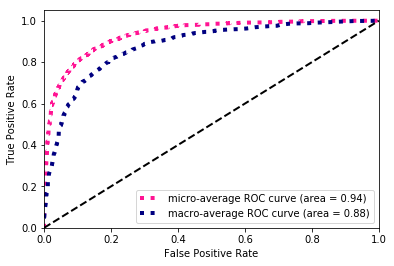

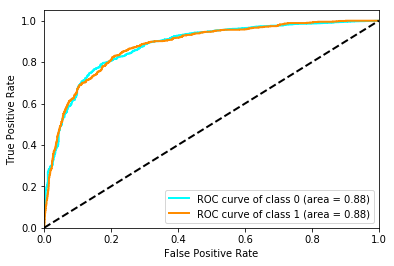

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.910802,0.622546,0.766674,0.855703,0.861297
precision,0.933188,0.565173,0.749181,0.855703,0.869985
recall,0.889464,0.692884,0.791174,0.855703,0.855703
support,3863.000000,801.000000,4664.000000,4664.000000,4664.000000
auc,0.879230,0.879231,0.879519,0.935130,NaN


******************** RNN_wo_NLP ********************
**********  round  1
load and test: shapes for train and test, X/Y
(22890, 314)
(22890, 2)
(4664, 314)
(4664, 2)
(22890, 8, 25)
(22890, 14)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 25)        0                                            
__________________________________________________________________________________________________
lstm_75 (LSTM)                  (None, 8, 128)       78848       main_input[0][0]                 
__________________________________________________________________________________________________
geohash_input (InputLayer)      (None, 14)           0                                            
__________________________________________________________________________________________________
lstm_76 (LSTM) 

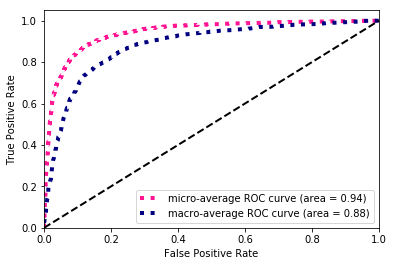

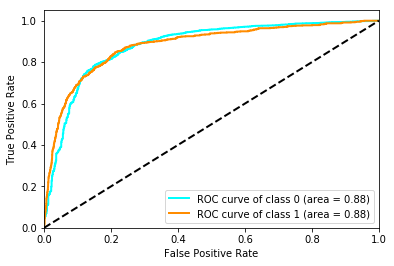

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.926452,0.638783,0.782617,0.877787,0.877047
precision,0.923591,0.648649,0.786120,0.877787,0.876373
recall,0.929330,0.629213,0.779272,0.877787,0.877787
support,3863.000000,801.000000,4664.000000,4664.000000,4664.000000
auc,0.880534,0.880534,0.880828,0.941772,NaN


******************** RNN_wo_NLP ********************
**********  round  2
load and test: shapes for train and test, X/Y
(22890, 314)
(22890, 2)
(4664, 314)
(4664, 2)
(22890, 8, 25)
(22890, 14)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 25)        0                                            
__________________________________________________________________________________________________
lstm_77 (LSTM)                  (None, 8, 128)       78848       main_input[0][0]                 
__________________________________________________________________________________________________
geohash_input (InputLayer)      (None, 14)           0                                            
__________________________________________________________________________________________________
lstm_78 (LSTM) 

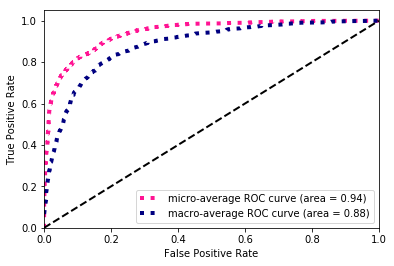

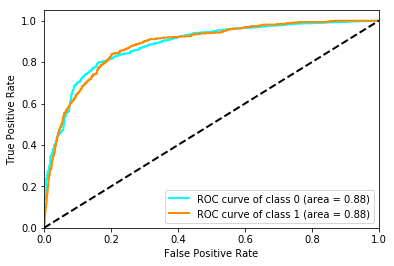

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.910980,0.607081,0.759030,0.854846,0.858788
precision,0.925708,0.567245,0.746477,0.854846,0.864145
recall,0.896712,0.652934,0.774823,0.854846,0.854846
support,3863.000000,801.000000,4664.000000,4664.000000,4664.000000
auc,0.881825,0.881825,0.882097,0.941104,NaN


******************** RNN_wo_geohash ********************
**********  round  0
load and test: shapes for train and test, X/Y
(22890, 314)
(22890, 2)
(4664, 314)
(4664, 2)
(22890, 8, 25)
(22890, 100)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 25)        0                                            
__________________________________________________________________________________________________
lstm_79 (LSTM)                  (None, 8, 128)       78848       main_input[0][0]                 
__________________________________________________________________________________________________
nlp_input (InputLayer)          (None, 100)          0                                            
__________________________________________________________________________________________________
lstm_80 (L

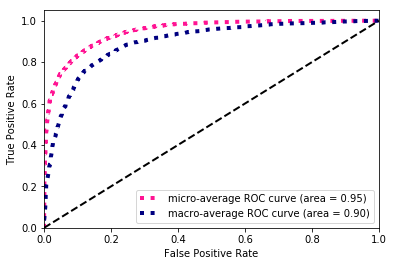

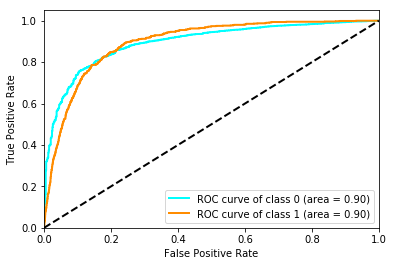

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.922127,0.556034,0.739081,0.867496,0.859254
precision,0.898355,0.654822,0.776589,0.867496,0.856530
recall,0.947191,0.483146,0.715169,0.867496,0.867496
support,3863.000000,801.000000,4664.000000,4664.000000,4664.000000
auc,0.895098,0.895097,0.895365,0.947950,NaN


******************** RNN_wo_geohash ********************
**********  round  1
load and test: shapes for train and test, X/Y
(22890, 314)
(22890, 2)
(4664, 314)
(4664, 2)
(22890, 8, 25)
(22890, 100)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 25)        0                                            
__________________________________________________________________________________________________
lstm_81 (LSTM)                  (None, 8, 128)       78848       main_input[0][0]                 
__________________________________________________________________________________________________
nlp_input (InputLayer)          (None, 100)          0                                            
__________________________________________________________________________________________________
lstm_82 (L

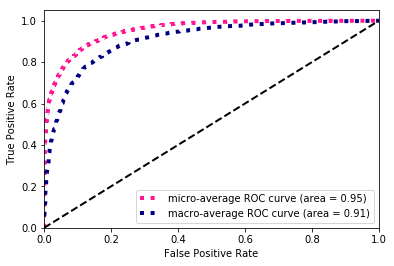

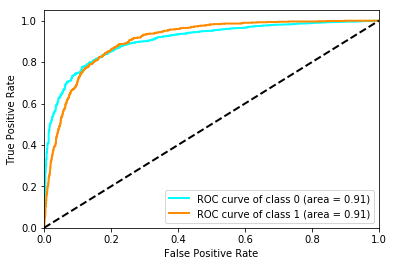

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.925811,0.631714,0.778762,0.876501,0.875303
precision,0.921302,0.647444,0.784373,0.876501,0.874270
recall,0.930365,0.616729,0.773547,0.876501,0.876501
support,3863.000000,801.000000,4664.000000,4664.000000,4664.000000
auc,0.906087,0.906087,0.906339,0.952224,NaN


******************** RNN_wo_geohash ********************
**********  round  2
load and test: shapes for train and test, X/Y
(22890, 314)
(22890, 2)
(4664, 314)
(4664, 2)
(22890, 8, 25)
(22890, 100)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 25)        0                                            
__________________________________________________________________________________________________
lstm_83 (LSTM)                  (None, 8, 128)       78848       main_input[0][0]                 
__________________________________________________________________________________________________
nlp_input (InputLayer)          (None, 100)          0                                            
__________________________________________________________________________________________________
lstm_84 (L

Epoch 48/60
 - 3s - loss: 0.2822 - f1_score: 0.5919 - val_loss: 0.1918 - val_f1_score: 0.3585
Epoch 49/60
 - 3s - loss: 0.2811 - f1_score: 0.5904 - val_loss: 0.2130 - val_f1_score: 0.1866
Epoch 50/60
 - 4s - loss: 0.2809 - f1_score: 0.5900 - val_loss: 0.2038 - val_f1_score: 0.4544
Epoch 51/60
 - 3s - loss: 0.2810 - f1_score: 0.5969 - val_loss: 0.2023 - val_f1_score: 0.1696
Epoch 52/60
 - 3s - loss: 0.2813 - f1_score: 0.5981 - val_loss: 0.6345 - val_f1_score: 0.2747
Epoch 53/60
 - 3s - loss: 0.2800 - f1_score: 0.5977 - val_loss: 0.2253 - val_f1_score: 0.3532
Epoch 54/60
 - 3s - loss: 0.2801 - f1_score: 0.5952 - val_loss: 0.2155 - val_f1_score: 0.0741
Epoch 55/60
 - 3s - loss: 0.2797 - f1_score: 0.5929 - val_loss: 0.2075 - val_f1_score: 0.4424
Epoch 56/60
 - 3s - loss: 0.2783 - f1_score: 0.5981 - val_loss: 0.2877 - val_f1_score: 0.3266
Epoch 57/60
 - 3s - loss: 0.2789 - f1_score: 0.6000 - val_loss: 0.1923 - val_f1_score: 0.2317
Epoch 58/60
 - 3s - loss: 0.2795 - f1_score: 0.5922 - val_lo

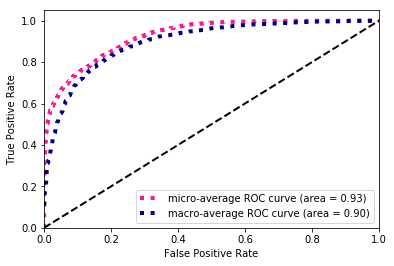

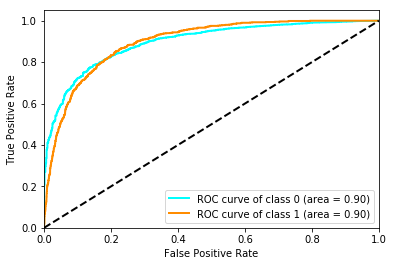

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.889409,0.611514,0.750462,0.827830,0.841683
precision,0.950265,0.499210,0.724737,0.827830,0.872800
recall,0.835879,0.789014,0.812446,0.827830,0.827830
support,3863.000000,801.000000,4664.000000,4664.000000,4664.000000
auc,0.896877,0.896877,0.897123,0.925314,NaN


******************** RNN ********************
**********  round  0
load and test: shapes for train and test, X/Y
(22890, 250)
(22890, 2)
(4664, 250)
(4664, 2)
(22890, 8, 17)
(22890, 14)
(22890, 100)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 17)        0                                            
__________________________________________________________________________________________________
lstm_85 (LSTM)                  (None, 8, 128)       74752       main_input[0][0]                 
__________________________________________________________________________________________________
geohash_input (InputLayer)      (None, 14)           0                                            
__________________________________________________________________________________________________
nlp_input

Epoch 43/60
 - 3s - loss: 0.2806 - f1_score: 0.5842 - val_loss: 0.2365 - val_f1_score: 0.4208


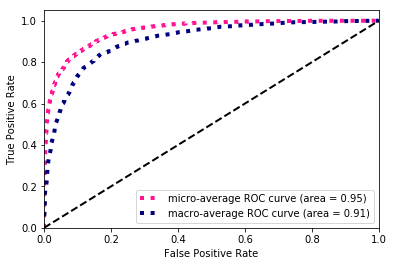

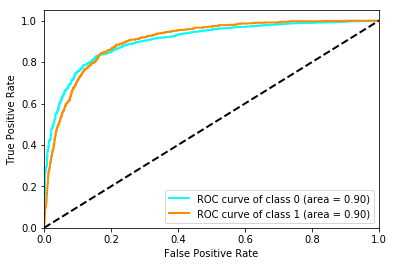

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.922177,0.632741,0.777459,0.871569,0.872469
precision,0.925665,0.621687,0.773676,0.871569,0.873460
recall,0.918716,0.644195,0.781455,0.871569,0.871569
support,3863.000000,801.000000,4664.000000,4664.000000,4664.000000
auc,0.904783,0.904783,0.905045,0.951172,NaN


******************** RNN ********************
**********  round  1
load and test: shapes for train and test, X/Y
(22890, 250)
(22890, 2)
(4664, 250)
(4664, 2)
(22890, 8, 17)
(22890, 14)
(22890, 100)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 17)        0                                            
__________________________________________________________________________________________________
lstm_87 (LSTM)                  (None, 8, 128)       74752       main_input[0][0]                 
__________________________________________________________________________________________________
geohash_input (InputLayer)      (None, 14)           0                                            
__________________________________________________________________________________________________
nlp_input

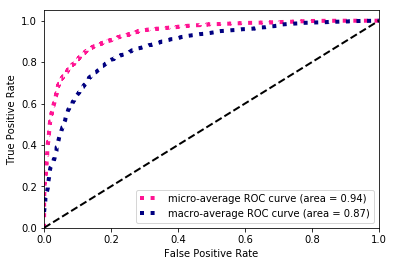

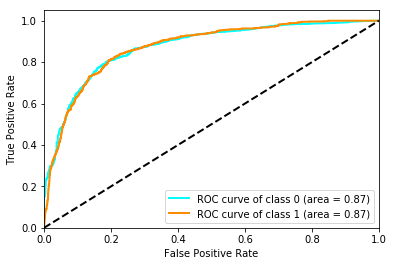

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.917717,0.587097,0.752407,0.862779,0.860936
precision,0.911622,0.607477,0.759549,0.862779,0.859388
recall,0.923893,0.568040,0.745967,0.862779,0.862779
support,3863.000000,801.000000,4664.000000,4664.000000,4664.000000
auc,0.873914,0.873915,0.874197,0.936103,NaN


******************** RNN ********************
**********  round  2
load and test: shapes for train and test, X/Y
(22890, 250)
(22890, 2)
(4664, 250)
(4664, 2)
(22890, 8, 17)
(22890, 14)
(22890, 100)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 17)        0                                            
__________________________________________________________________________________________________
lstm_89 (LSTM)                  (None, 8, 128)       74752       main_input[0][0]                 
__________________________________________________________________________________________________
geohash_input (InputLayer)      (None, 14)           0                                            
__________________________________________________________________________________________________
nlp_input

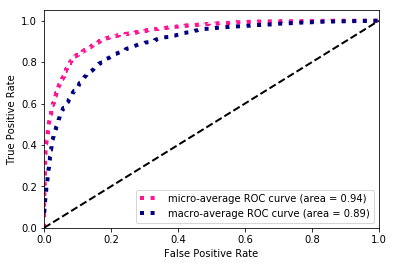

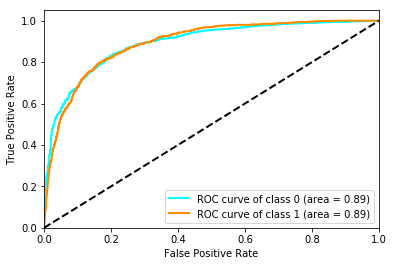

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.919087,0.613861,0.766474,0.866209,0.866667
precision,0.920759,0.608589,0.764674,0.866209,0.867146
recall,0.917422,0.619226,0.768324,0.866209,0.866209
support,3863.000000,801.000000,4664.000000,4664.000000,4664.000000
auc,0.892286,0.892286,0.892544,0.941096,NaN


******************** RNN ********************
**********  round  0
load and test: shapes for train and test, X/Y
(22890, 234)
(22890, 2)
(4664, 234)
(4664, 2)
(22890, 8, 15)
(22890, 14)
(22890, 100)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 15)        0                                            
__________________________________________________________________________________________________
lstm_91 (LSTM)                  (None, 8, 128)       73728       main_input[0][0]                 
__________________________________________________________________________________________________
geohash_input (InputLayer)      (None, 14)           0                                            
__________________________________________________________________________________________________
nlp_input

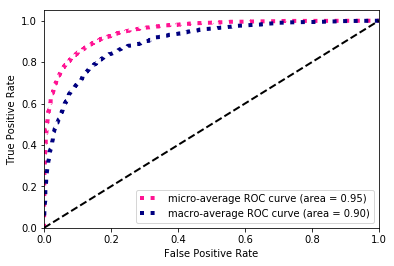

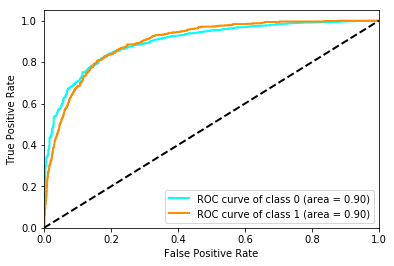

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.924984,0.609448,0.767216,0.874142,0.870794
precision,0.913428,0.652422,0.782925,0.874142,0.868602
recall,0.936837,0.571785,0.754311,0.874142,0.874142
support,3863.000000,801.000000,4664.000000,4664.000000,4664.000000
auc,0.898081,0.898081,0.898227,0.949902,NaN


******************** RNN ********************
**********  round  1
load and test: shapes for train and test, X/Y
(22890, 234)
(22890, 2)
(4664, 234)
(4664, 2)
(22890, 8, 15)
(22890, 14)
(22890, 100)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 15)        0                                            
__________________________________________________________________________________________________
lstm_93 (LSTM)                  (None, 8, 128)       73728       main_input[0][0]                 
__________________________________________________________________________________________________
geohash_input (InputLayer)      (None, 14)           0                                            
__________________________________________________________________________________________________
nlp_input

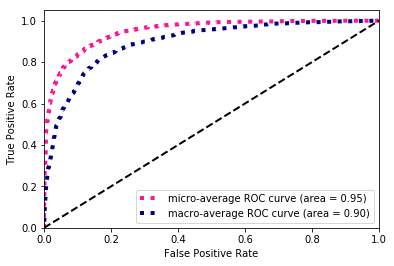

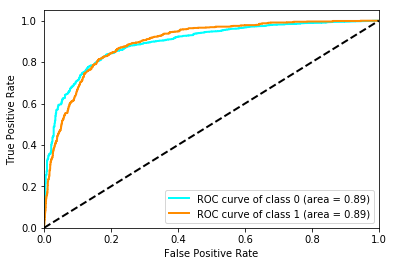

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.924614,0.580872,0.752743,0.872213,0.865580
precision,0.904032,0.665056,0.784544,0.872213,0.862990
recall,0.946156,0.515605,0.730881,0.872213,0.872213
support,3863.000000,801.000000,4664.000000,4664.000000,4664.000000
auc,0.894925,0.894925,0.895078,0.948709,NaN


******************** RNN ********************
**********  round  2
load and test: shapes for train and test, X/Y
(22890, 234)
(22890, 2)
(4664, 234)
(4664, 2)
(22890, 8, 15)
(22890, 14)
(22890, 100)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 15)        0                                            
__________________________________________________________________________________________________
lstm_95 (LSTM)                  (None, 8, 128)       73728       main_input[0][0]                 
__________________________________________________________________________________________________
geohash_input (InputLayer)      (None, 14)           0                                            
__________________________________________________________________________________________________
nlp_input

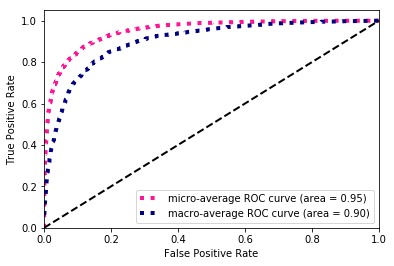

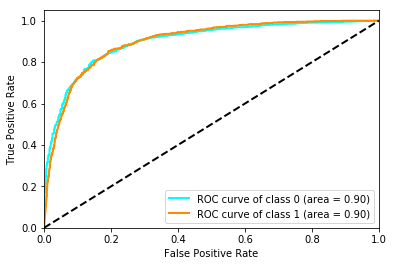

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.925396,0.648715,0.787056,0.87693,0.877879
precision,0.929261,0.636255,0.782758,0.87693,0.878940
recall,0.921564,0.661673,0.791618,0.87693,0.876930
support,3863.000000,801.000000,4664.000000,4664.00000,4664.000000
auc,0.899885,0.899885,0.900023,0.95049,NaN


******************** RNN ********************
**********  round  0
load and test: shapes for train and test, X/Y
(22890, 258)
(22890, 2)
(4664, 258)
(4664, 2)
(22890, 8, 18)
(22890, 14)
(22890, 100)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 18)        0                                            
__________________________________________________________________________________________________
lstm_97 (LSTM)                  (None, 8, 128)       75264       main_input[0][0]                 
__________________________________________________________________________________________________
geohash_input (InputLayer)      (None, 14)           0                                            
__________________________________________________________________________________________________
nlp_input

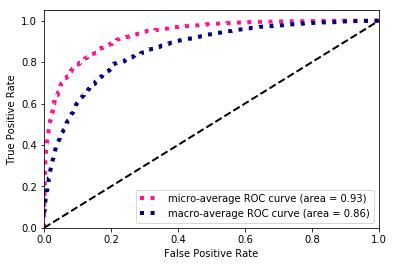

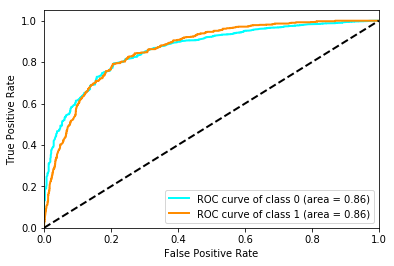

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.905866,0.547040,0.726453,0.844125,0.844241
precision,0.906218,0.546020,0.726119,0.844125,0.844357
recall,0.905514,0.548065,0.726789,0.844125,0.844125
support,3863.000000,801.000000,4664.000000,4664.000000,4664.000000
auc,0.861276,0.861262,0.861398,0.931528,NaN


******************** RNN ********************
**********  round  1
load and test: shapes for train and test, X/Y
(22890, 258)
(22890, 2)
(4664, 258)
(4664, 2)
(22890, 8, 18)
(22890, 14)
(22890, 100)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 18)        0                                            
__________________________________________________________________________________________________
lstm_99 (LSTM)                  (None, 8, 128)       75264       main_input[0][0]                 
__________________________________________________________________________________________________
geohash_input (InputLayer)      (None, 14)           0                                            
__________________________________________________________________________________________________
nlp_input

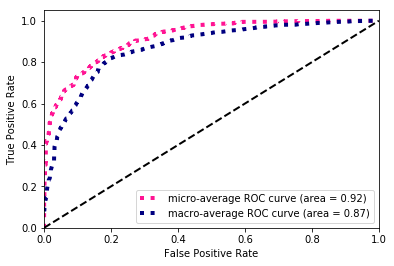

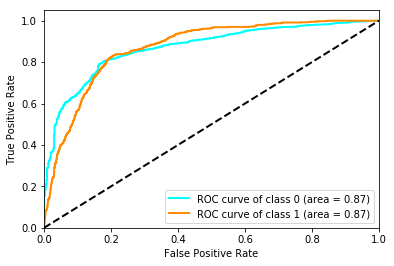

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.887796,0.591745,0.739770,0.823971,0.836952
precision,0.940359,0.491736,0.716047,0.823971,0.863312
recall,0.840797,0.742821,0.791809,0.823971,0.823971
support,3863.000000,801.000000,4664.000000,4664.000000,4664.000000
auc,0.870476,0.870476,0.870735,0.916374,NaN


******************** RNN ********************
**********  round  2
load and test: shapes for train and test, X/Y
(22890, 258)
(22890, 2)
(4664, 258)
(4664, 2)
(22890, 8, 18)
(22890, 14)
(22890, 100)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 18)        0                                            
__________________________________________________________________________________________________
lstm_101 (LSTM)                 (None, 8, 128)       75264       main_input[0][0]                 
__________________________________________________________________________________________________
geohash_input (InputLayer)      (None, 14)           0                                            
__________________________________________________________________________________________________
nlp_input

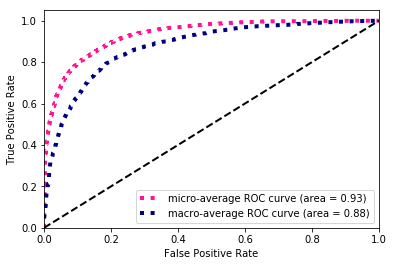

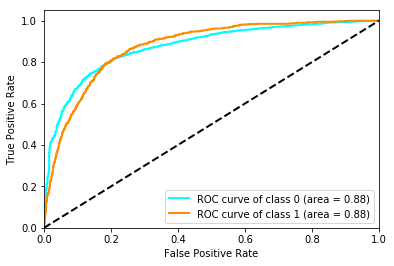

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.907862,0.565830,0.736846,0.847985,0.849121
precision,0.911534,0.555288,0.733411,0.847985,0.850352
recall,0.904220,0.576779,0.740499,0.847985,0.847985
support,3863.000000,801.000000,4664.000000,4664.000000,4664.000000
auc,0.875137,0.875137,0.875401,0.932605,NaN


******************** RNN_wo_geo ********************
**********  round  0
load and test: shapes for train and test, X/Y
(22890, 250)
(22890, 2)
(4664, 250)
(4664, 2)
(22890, 8, 17)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 8, 17)             0         
_________________________________________________________________
lstm_103 (LSTM)              (None, 8, 128)            74752     
_________________________________________________________________
lstm_104 (LSTM)              (None, 128)               131584    
_________________________________________________________________
dense_367 (Dense)            (None, 512)               66048     
_________________________________________________________________
dense_368 (Dense)            (None, 256)               131328    
_________________________________________________________________
batch_normalization_139 (Ba

/users/PAS0536/osu9965/.local/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


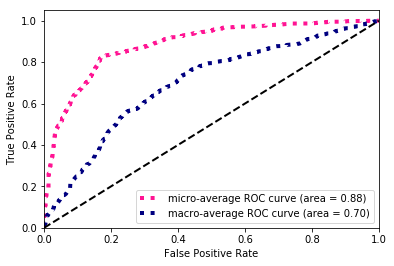

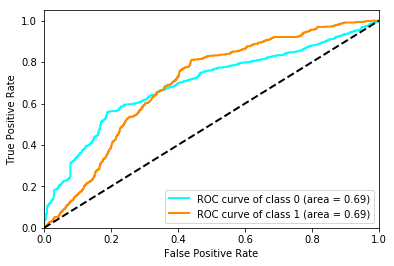

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.906063,0.000000,0.453032,0.828259,0.750455
precision,0.828259,0.000000,0.414130,0.828259,0.686013
recall,1.000000,0.000000,0.500000,0.828259,0.828259
support,3863.000000,801.000000,4664.000000,4664.000000,4664.000000
auc,0.694873,0.694873,0.695075,0.883699,NaN


******************** RNN_wo_geo ********************
**********  round  1
load and test: shapes for train and test, X/Y
(22890, 250)
(22890, 2)
(4664, 250)
(4664, 2)
(22890, 8, 17)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 8, 17)             0         
_________________________________________________________________
lstm_105 (LSTM)              (None, 8, 128)            74752     
_________________________________________________________________
lstm_106 (LSTM)              (None, 128)               131584    
_________________________________________________________________
dense_371 (Dense)            (None, 512)               66048     
_________________________________________________________________
dense_372 (Dense)            (None, 256)               131328    
_________________________________________________________________
batch_normalization_141 (Ba

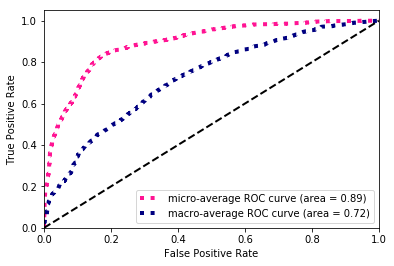

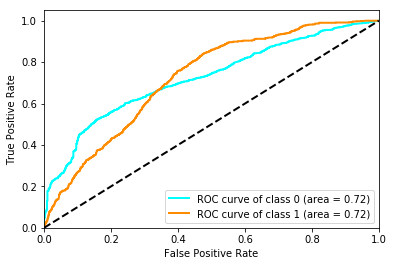

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.906063,0.000000,0.453032,0.828259,0.750455
precision,0.828259,0.000000,0.414130,0.828259,0.686013
recall,1.000000,0.000000,0.500000,0.828259,0.828259
support,3863.000000,801.000000,4664.000000,4664.000000,4664.000000
auc,0.722937,0.722937,0.723109,0.891683,NaN


******************** RNN_wo_geo ********************
**********  round  2
load and test: shapes for train and test, X/Y
(22890, 250)
(22890, 2)
(4664, 250)
(4664, 2)
(22890, 8, 17)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 8, 17)             0         
_________________________________________________________________
lstm_107 (LSTM)              (None, 8, 128)            74752     
_________________________________________________________________
lstm_108 (LSTM)              (None, 128)               131584    
_________________________________________________________________
dense_375 (Dense)            (None, 512)               66048     
_________________________________________________________________
dense_376 (Dense)            (None, 256)               131328    
_________________________________________________________________
batch_normalization_143 (Ba

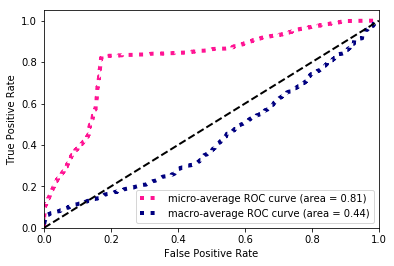

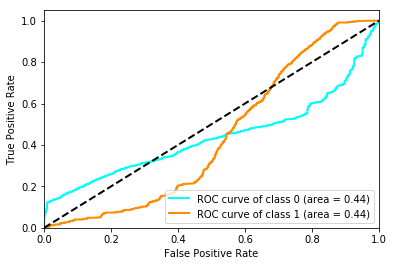

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.906063,0.000000,0.453032,0.828259,0.750455
precision,0.828259,0.000000,0.414130,0.828259,0.686013
recall,1.000000,0.000000,0.500000,0.828259,0.828259
support,3863.000000,801.000000,4664.000000,4664.000000,4664.000000
auc,0.437826,0.437826,0.438036,0.810571,NaN


In [23]:
Austin = compare_models(city='Austin',classname='RNN')

In [24]:
Austin.to_hdf('Austin.h5',key='RNN')
Austin

,NL,geohash,traffic,weather,time,geo
0_f1-score,0.916078,0.912449,0.919660,0.924998,0.900508,0.906063
1_f1-score,0.622803,0.599754,0.611233,0.613012,0.568205,0.000000
weighted avg_f1-score,0.865710,0.858747,0.866691,0.871417,0.843438,0.750455
micro avg_f1-score,0.862779,0.857276,0.866852,0.874428,0.838694,0.828259
macro avg_f1-score,0.769441,0.756102,0.765447,0.769005,0.734357,0.453032
0_precision,0.927496,0.923307,0.919349,0.915574,0.919370,0.828259
1_precision,0.593689,0.600492,0.612584,0.651244,0.531015,0.000000
weighted avg_precision,0.870168,0.867867,0.866665,0.870177,0.852674,0.686013
micro avg_precision,0.862779,0.857276,0.866852,0.874428,0.838694,0.828259
macro avg_precision,0.760593,0.761900,0.765966,0.783409,0.725192,0.414130


******************** RNN_embed_wo_NLP ********************
**********  round  0
load and test: shapes for train and test, X/Y
(22890, 315)
(22890, 2)
(4664, 315)
(4664, 2)
(22890, 8, 25)
(22890, 14)
(22890,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 25)        0                                            
__________________________________________________________________________________________________
embedding_19 (Embedding)        (None, 1, 128)       119680      geo_code[0][0]                   
__________________________________________________________________________________________________


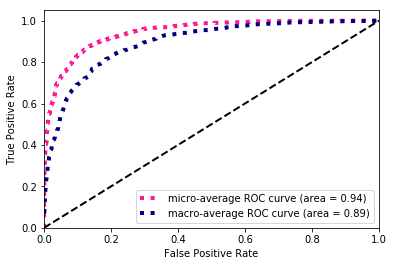

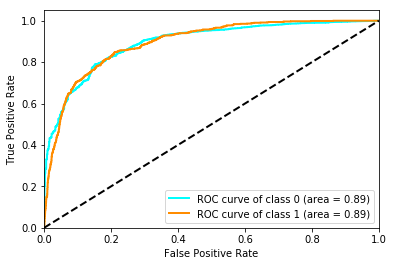

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.921584,0.648649,0.785116,0.871784,0.874710
precision,0.933829,0.612653,0.773241,0.871784,0.878670
recall,0.909656,0.689139,0.799397,0.871784,0.871784
support,3863.000000,801.000000,4664.000000,4664.000000,4664.000000
auc,0.893588,0.893588,0.893853,0.944130,NaN


******************** RNN_embed_wo_NLP ********************
**********  round  1
load and test: shapes for train and test, X/Y
(22890, 315)
(22890, 2)
(4664, 315)
(4664, 2)
(22890, 8, 25)
(22890, 14)
(22890,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 25)        0                                            
__________________________________________________________________________________________________
embedding_20 (Embedding)        (None, 1, 128)       119680      geo_code[0][0]                   
__________________________________________________________________________________________________


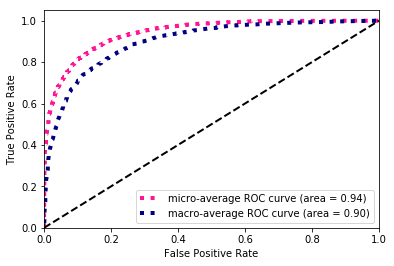

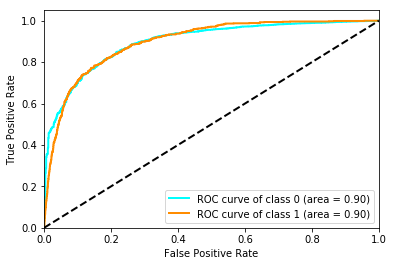

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.913455,0.645161,0.779308,0.860849,0.867378
precision,0.941969,0.573930,0.757950,0.860849,0.878762
recall,0.886617,0.736579,0.811598,0.860849,0.860849
support,3863.000000,801.000000,4664.000000,4664.000000,4664.000000
auc,0.897428,0.897428,0.897701,0.939780,NaN


******************** RNN_embed_wo_NLP ********************
**********  round  2
load and test: shapes for train and test, X/Y
(22890, 315)
(22890, 2)
(4664, 315)
(4664, 2)
(22890, 8, 25)
(22890, 14)
(22890,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 25)        0                                            
__________________________________________________________________________________________________
embedding_21 (Embedding)        (None, 1, 128)       119680      geo_code[0][0]                   
__________________________________________________________________________________________________


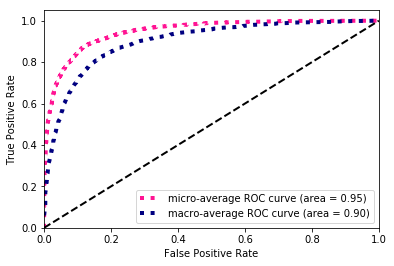

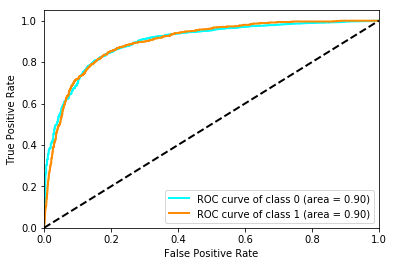

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.925868,0.659064,0.792466,0.878216,0.880047
precision,0.933667,0.634682,0.784174,0.878216,0.882319
recall,0.918198,0.685393,0.801796,0.878216,0.878216
support,3863.000000,801.000000,4664.000000,4664.000000,4664.000000
auc,0.898622,0.898622,0.898889,0.947283,NaN


******************** RNN_embed_wo_geohash ********************
**********  round  0
load and test: shapes for train and test, X/Y
(22890, 315)
(22890, 2)
(4664, 315)
(4664, 2)
(22890, 8, 25)
(22890, 100)
(22890,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 25)        0                                            
__________________________________________________________________________________________________
embedding_22 (Embedding)        (None, 1, 128)       119680      geo_code[0][0]                   
______________________________________________________________________________________________

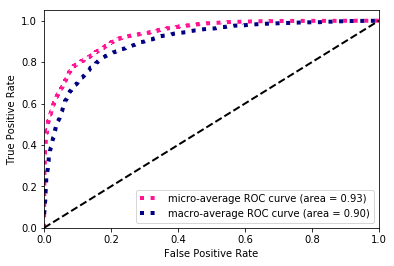

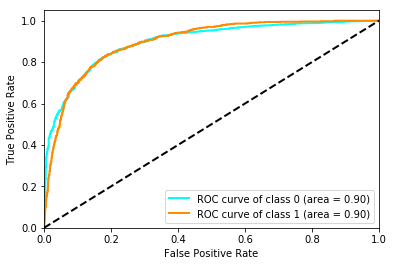

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.903453,0.633042,0.768247,0.847127,0.857012
precision,0.947189,0.538529,0.742859,0.847127,0.877005
recall,0.863578,0.767790,0.815684,0.847127,0.847127
support,3863.000000,801.000000,4664.000000,4664.000000,4664.000000
auc,0.898064,0.898064,0.898341,0.933686,NaN


******************** RNN_embed_wo_geohash ********************
**********  round  1
load and test: shapes for train and test, X/Y
(22890, 315)
(22890, 2)
(4664, 315)
(4664, 2)
(22890, 8, 25)
(22890, 100)
(22890,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 25)        0                                            
__________________________________________________________________________________________________
embedding_23 (Embedding)        (None, 1, 128)       119680      geo_code[0][0]                   
______________________________________________________________________________________________

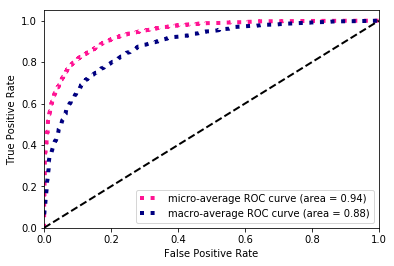

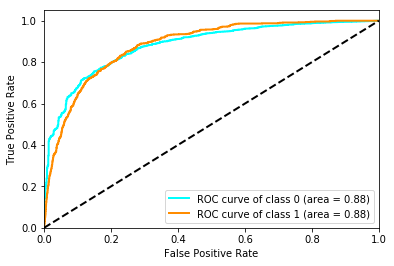

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.913699,0.593635,0.753667,0.857633,0.858731
precision,0.917515,0.582233,0.749874,0.857633,0.859933
recall,0.909915,0.605493,0.757704,0.857633,0.857633
support,3863.000000,801.000000,4664.000000,4664.000000,4664.000000
auc,0.881202,0.881202,0.881468,0.940520,NaN


******************** RNN_embed_wo_geohash ********************
**********  round  2
load and test: shapes for train and test, X/Y
(22890, 315)
(22890, 2)
(4664, 315)
(4664, 2)
(22890, 8, 25)
(22890, 100)
(22890,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 25)        0                                            
__________________________________________________________________________________________________
embedding_24 (Embedding)        (None, 1, 128)       119680      geo_code[0][0]                   
______________________________________________________________________________________________

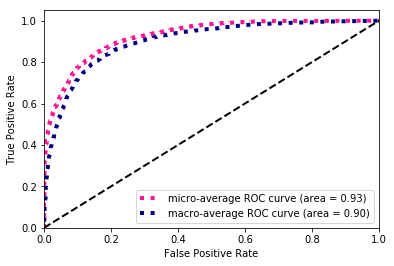

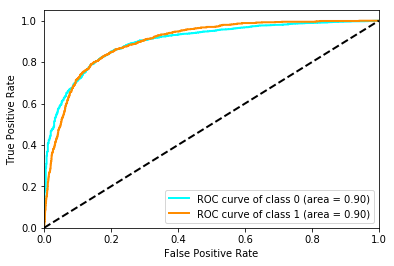

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.901309,0.636546,0.768927,0.844768,0.855838
precision,0.951915,0.532326,0.742120,0.844768,0.879854
recall,0.855812,0.791511,0.823661,0.844768,0.844768
support,3863.000000,801.000000,4664.000000,4664.000000,4664.000000
auc,0.900042,0.900042,0.900321,0.926194,NaN


******************** RNN_embed ********************
**********  round  0
load and test: shapes for train and test, X/Y
(22890, 251)
(22890, 2)
(4664, 251)
(4664, 2)
(22890, 8, 17)
(22890, 14)
(22890, 100)
(22890,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 17)        0                                            
__________________________________________________________________________________________________
embedding_25 (Embedding)        (None, 1, 128)       119680      geo_code[0][0]                   
_____________________________________________________________________________________________

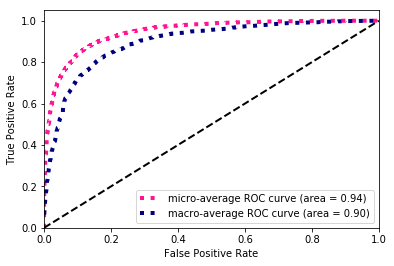

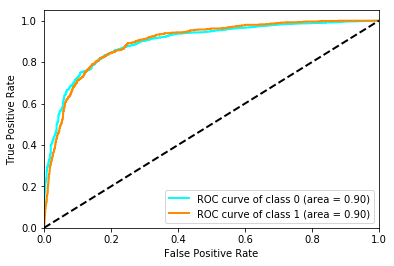

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.921384,0.646226,0.783805,0.871355,0.874128
precision,0.932873,0.612291,0.772582,0.871355,0.877816
recall,0.910173,0.684145,0.797159,0.871355,0.871355
support,3863.000000,801.000000,4664.000000,4664.000000,4664.000000
auc,0.896706,0.896706,0.896972,0.944254,NaN


******************** RNN_embed ********************
**********  round  1
load and test: shapes for train and test, X/Y
(22890, 251)
(22890, 2)
(4664, 251)
(4664, 2)
(22890, 8, 17)
(22890, 14)
(22890, 100)
(22890,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 17)        0                                            
__________________________________________________________________________________________________
embedding_26 (Embedding)        (None, 1, 128)       119680      geo_code[0][0]                   
_____________________________________________________________________________________________

Epoch 33/60
 - 4s - loss: 0.2817 - f1_score: 0.5764 - val_loss: 0.3112 - val_f1_score: 0.3972
Epoch 34/60
 - 4s - loss: 0.2802 - f1_score: 0.5774 - val_loss: 0.2270 - val_f1_score: 0.2259
Epoch 35/60
 - 4s - loss: 0.2793 - f1_score: 0.5849 - val_loss: 0.2494 - val_f1_score: 0.4510
Epoch 36/60
 - 4s - loss: 0.2799 - f1_score: 0.5810 - val_loss: 0.2177 - val_f1_score: 0.2587
Epoch 37/60
 - 4s - loss: 0.2789 - f1_score: 0.5787 - val_loss: 0.2184 - val_f1_score: 0.0651
Epoch 38/60
 - 4s - loss: 0.2784 - f1_score: 0.5853 - val_loss: 0.2290 - val_f1_score: 0.3204
Epoch 39/60
 - 4s - loss: 0.2807 - f1_score: 0.5750 - val_loss: 0.2556 - val_f1_score: 0.4092
Epoch 40/60
 - 4s - loss: 0.2781 - f1_score: 0.5796 - val_loss: 0.2087 - val_f1_score: 0.2347
Epoch 41/60
 - 4s - loss: 0.2804 - f1_score: 0.5778 - val_loss: 0.2163 - val_f1_score: 0.3633
Epoch 42/60
 - 4s - loss: 0.2765 - f1_score: 0.5914 - val_loss: 0.2705 - val_f1_score: 0.3306
Epoch 43/60
 - 3s - loss: 0.2775 - f1_score: 0.5773 - val_lo

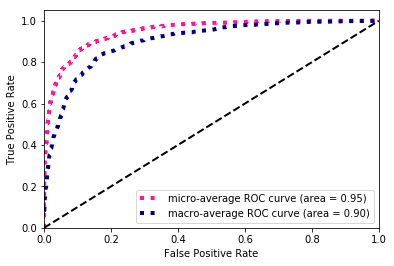

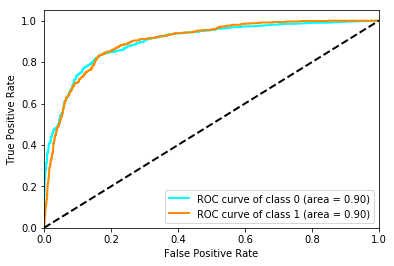

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.925912,0.647748,0.786830,0.877573,0.878139
precision,0.928200,0.640244,0.784222,0.877573,0.878746
recall,0.923634,0.655431,0.789533,0.877573,0.877573
support,3863.000000,801.000000,4664.000000,4664.000000,4664.000000
auc,0.900038,0.900039,0.900308,0.948427,NaN


******************** RNN_embed ********************
**********  round  2
load and test: shapes for train and test, X/Y
(22890, 251)
(22890, 2)
(4664, 251)
(4664, 2)
(22890, 8, 17)
(22890, 14)
(22890, 100)
(22890,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 17)        0                                            
__________________________________________________________________________________________________
embedding_27 (Embedding)        (None, 1, 128)       119680      geo_code[0][0]                   
_____________________________________________________________________________________________

Epoch 33/60
 - 4s - loss: 0.2788 - f1_score: 0.5853 - val_loss: 0.2300 - val_f1_score: 0.3488


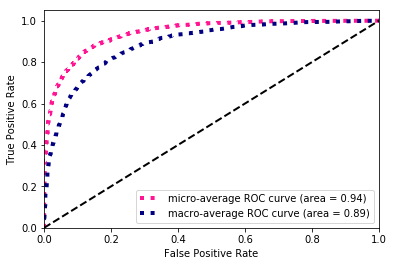

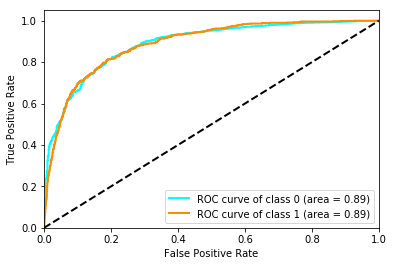

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.917511,0.636943,0.777227,0.865566,0.869326
precision,0.932852,0.593952,0.763402,0.865566,0.874649
recall,0.902666,0.686642,0.794654,0.865566,0.865566
support,3863.000000,801.000000,4664.000000,4664.000000,4664.000000
auc,0.888265,0.888265,0.888538,0.941182,NaN


******************** RNN_embed ********************
**********  round  0
load and test: shapes for train and test, X/Y
(22890, 235)
(22890, 2)
(4664, 235)
(4664, 2)
(22890, 8, 15)
(22890, 14)
(22890, 100)
(22890,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 15)        0                                            
__________________________________________________________________________________________________
embedding_28 (Embedding)        (None, 1, 128)       119680      geo_code[0][0]                   
_____________________________________________________________________________________________

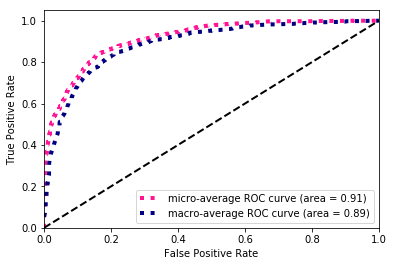

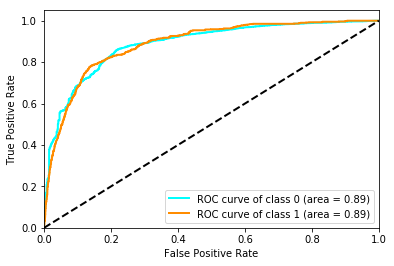

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.897937,0.628173,0.763055,0.839837,0.851607
precision,0.950810,0.522351,0.736581,0.839837,0.877226
recall,0.850634,0.787765,0.819200,0.839837,0.839837
support,3863.000000,801.000000,4664.000000,4664.000000,4664.000000
auc,0.887167,0.887167,0.887323,0.914127,NaN


******************** RNN_embed ********************
**********  round  1
load and test: shapes for train and test, X/Y
(22890, 235)
(22890, 2)
(4664, 235)
(4664, 2)
(22890, 8, 15)
(22890, 14)
(22890, 100)
(22890,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 15)        0                                            
__________________________________________________________________________________________________
embedding_29 (Embedding)        (None, 1, 128)       119680      geo_code[0][0]                   
_____________________________________________________________________________________________

Epoch 33/60
 - 4s - loss: 0.2803 - f1_score: 0.5873 - val_loss: 0.2024 - val_f1_score: 0.0000e+00
Epoch 34/60
 - 4s - loss: 0.2797 - f1_score: 0.5837 - val_loss: 0.2032 - val_f1_score: 0.0000e+00
Epoch 35/60
 - 4s - loss: 0.2805 - f1_score: 0.5866 - val_loss: 0.2162 - val_f1_score: 0.0304
Epoch 36/60
 - 4s - loss: 0.2794 - f1_score: 0.5888 - val_loss: 0.2542 - val_f1_score: 0.3154
Epoch 37/60
 - 3s - loss: 0.2804 - f1_score: 0.5755 - val_loss: 0.2394 - val_f1_score: 0.3080
Epoch 38/60
 - 4s - loss: 0.2784 - f1_score: 0.5824 - val_loss: 0.2060 - val_f1_score: 0.0860
Epoch 39/60
 - 4s - loss: 0.2793 - f1_score: 0.5829 - val_loss: 0.2198 - val_f1_score: 0.2162


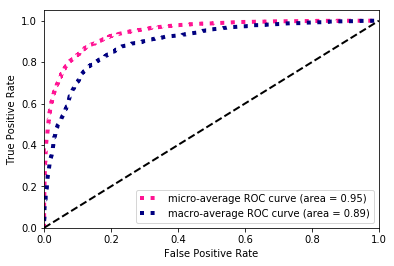

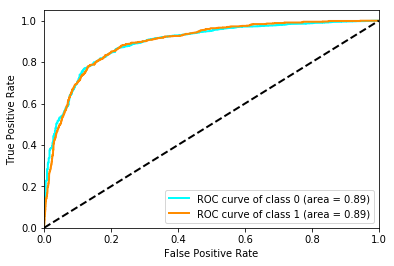

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.922276,0.637523,0.779899,0.871998,0.873372
precision,0.927711,0.620567,0.774139,0.871998,0.874962
recall,0.916904,0.655431,0.786167,0.871998,0.871998
support,3863.000000,801.000000,4664.000000,4664.000000,4664.000000
auc,0.894487,0.894487,0.894648,0.945565,NaN


******************** RNN_embed ********************
**********  round  2
load and test: shapes for train and test, X/Y
(22890, 235)
(22890, 2)
(4664, 235)
(4664, 2)
(22890, 8, 15)
(22890, 14)
(22890, 100)
(22890,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 15)        0                                            
__________________________________________________________________________________________________
embedding_30 (Embedding)        (None, 1, 128)       119680      geo_code[0][0]                   
_____________________________________________________________________________________________

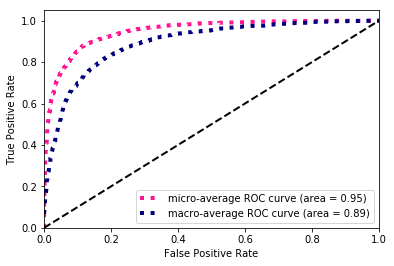

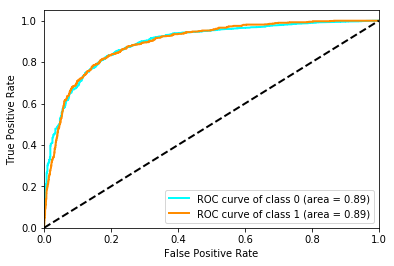

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.928140,0.639122,0.783631,0.880146,0.878504
precision,0.921859,0.661765,0.791812,0.880146,0.877190
recall,0.934507,0.617978,0.776242,0.880146,0.880146
support,3863.000000,801.000000,4664.000000,4664.000000,4664.000000
auc,0.893186,0.893186,0.893336,0.948524,NaN


******************** RNN_embed ********************
**********  round  0
load and test: shapes for train and test, X/Y
(22890, 259)
(22890, 2)
(4664, 259)
(4664, 2)
(22890, 8, 18)
(22890, 14)
(22890, 100)
(22890,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 18)        0                                            
__________________________________________________________________________________________________
embedding_31 (Embedding)        (None, 1, 128)       119680      geo_code[0][0]                   
_____________________________________________________________________________________________

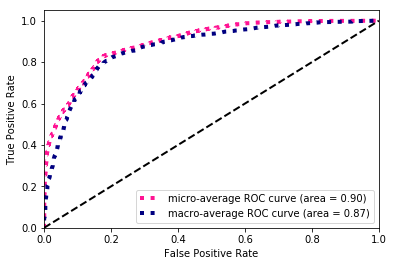

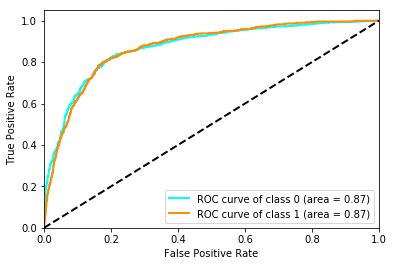

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.887817,0.607143,0.747480,0.825472,0.839614
precision,0.949307,0.494886,0.722097,0.825472,0.871265
recall,0.833808,0.785268,0.809538,0.825472,0.825472
support,3863.000000,801.000000,4664.000000,4664.000000,4664.000000
auc,0.871929,0.871929,0.872185,0.896651,NaN


******************** RNN_embed ********************
**********  round  1
load and test: shapes for train and test, X/Y
(22890, 259)
(22890, 2)
(4664, 259)
(4664, 2)
(22890, 8, 18)
(22890, 14)
(22890, 100)
(22890,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 18)        0                                            
__________________________________________________________________________________________________
embedding_32 (Embedding)        (None, 1, 128)       119680      geo_code[0][0]                   
_____________________________________________________________________________________________

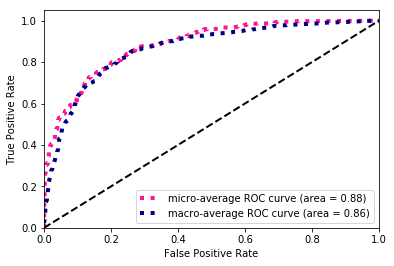

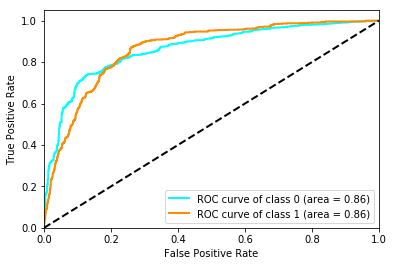

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.868690,0.568672,0.718681,0.798671,0.817164
precision,0.944647,0.449855,0.697251,0.798671,0.859671
recall,0.804038,0.772784,0.788411,0.798671,0.798671
support,3863.000000,801.000000,4664.000000,4664.000000,4664.000000
auc,0.863894,0.863894,0.864157,0.883603,NaN


******************** RNN_embed ********************
**********  round  2
load and test: shapes for train and test, X/Y
(22890, 259)
(22890, 2)
(4664, 259)
(4664, 2)
(22890, 8, 18)
(22890, 14)
(22890, 100)
(22890,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 18)        0                                            
__________________________________________________________________________________________________
embedding_33 (Embedding)        (None, 1, 128)       119680      geo_code[0][0]                   
_____________________________________________________________________________________________

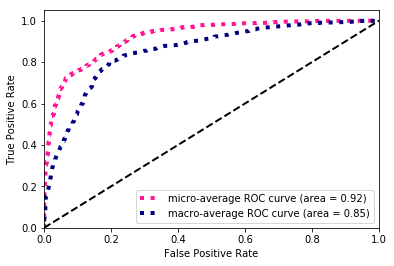

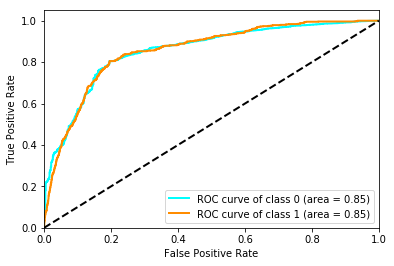

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.894560,0.583112,0.738836,0.831690,0.841072
precision,0.929648,0.507394,0.718521,0.831690,0.857130
recall,0.862024,0.685393,0.773709,0.831690,0.831690
support,3863.000000,801.000000,4664.000000,4664.000000,4664.000000
auc,0.853936,0.853936,0.854201,0.921752,NaN


******************** RNN_embed_wo_geo ********************
**********  round  0
load and test: shapes for train and test, X/Y
(22890, 251)
(22890, 2)
(4664, 251)
(4664, 2)
(22890, 8, 17)
(22890,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 17)        0                                            
__________________________________________________________________________________________________
embedding_34 (Embedding)        (None, 1, 128)       119680      geo_code[0][0]                   
__________________________________________________________________________________________________
lstm_139 (LS

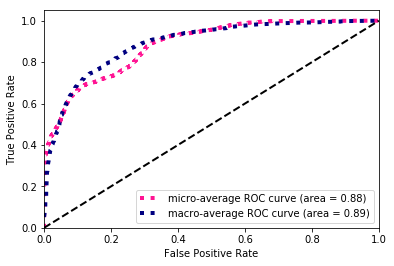

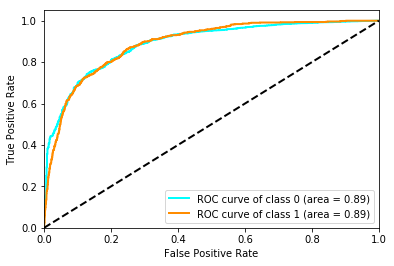

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.838946,0.559648,0.699297,0.764151,0.790979
precision,0.965622,0.411903,0.688763,0.764151,0.870526
recall,0.741652,0.872659,0.807155,0.764151,0.764151
support,3863.000000,801.000000,4664.000000,4664.000000,4664.000000
auc,0.889490,0.889490,0.889779,0.882740,NaN


******************** RNN_embed_wo_geo ********************
**********  round  1
load and test: shapes for train and test, X/Y
(22890, 251)
(22890, 2)
(4664, 251)
(4664, 2)
(22890, 8, 17)
(22890,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 17)        0                                            
__________________________________________________________________________________________________
embedding_35 (Embedding)        (None, 1, 128)       119680      geo_code[0][0]                   
__________________________________________________________________________________________________
lstm_141 (LS

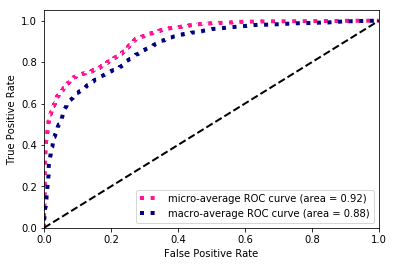

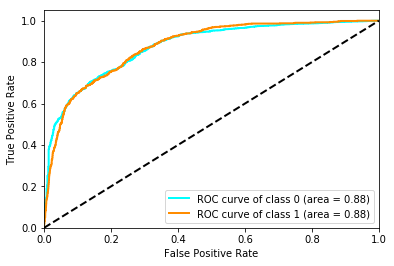

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.874137,0.561960,0.718049,0.804460,0.820524
precision,0.936151,0.456674,0.696413,0.804460,0.853806
recall,0.819829,0.730337,0.775083,0.804460,0.804460
support,3863.000000,801.000000,4664.000000,4664.000000,4664.000000
auc,0.875342,0.875342,0.875632,0.917332,NaN


******************** RNN_embed_wo_geo ********************
**********  round  2
load and test: shapes for train and test, X/Y
(22890, 251)
(22890, 2)
(4664, 251)
(4664, 2)
(22890, 8, 17)
(22890,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 17)        0                                            
__________________________________________________________________________________________________
embedding_36 (Embedding)        (None, 1, 128)       119680      geo_code[0][0]                   
__________________________________________________________________________________________________
lstm_143 (LS

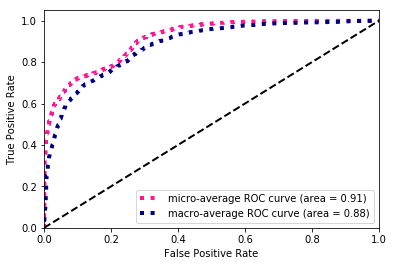

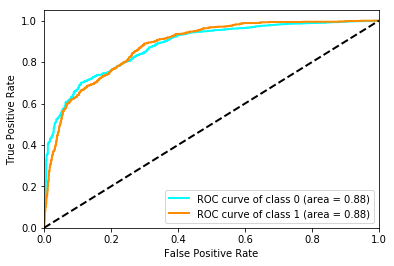

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.861919,0.555002,0.708461,0.789237,0.809209
precision,0.942260,0.435369,0.688815,0.789237,0.855206
recall,0.794201,0.765293,0.779747,0.789237,0.789237
support,3863.000000,801.000000,4664.000000,4664.000000,4664.000000
auc,0.879503,0.879503,0.879778,0.911425,NaN


In [25]:
Austin = compare_models(city='Austin',classname='RNN_embed')

In [ ]:
Austin.to_hdf('Austin.h5',key='RNN_embed')
Austin

,NL,geohash,traffic,weather,time,geo
0_f1-score,0.920302,0.906154,0.921602,0.916117,0.883689,0.858334
1_f1-score,0.650958,0.621074,0.643639,0.634939,0.586309,0.558870
weighted avg_f1-score,0.874045,0.857194,0.873864,0.867828,0.832617,0.806904
micro avg_f1-score,0.870283,0.849843,0.871498,0.863994,0.818611,0.785949
macro avg_f1-score,0.785630,0.763614,0.782621,0.775528,0.734999,0.708602
0_precision,0.936488,0.938873,0.931308,0.933460,0.941201,0.948011
1_precision,0.607088,0.551029,0.615496,0.601561,0.484045,0.434649
weighted avg_precision,0.879917,0.872264,0.877070,0.876459,0.862688,0.859846
micro avg_precision,0.870283,0.849843,0.871498,0.863994,0.818611,0.785949
macro avg_precision,0.771788,0.744951,0.773402,0.767511,0.712623,0.691330


# Miami

******************** DNN ********************
**********  round  0
load and test: shapes for train and test, X/Y
(7671, 214)
(7671, 2)
(1561, 214)
(1561, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 214)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 512)               110080    
_________________________________________________________________
dense_2 (Dense)              (None, 256)               131328    
_________________________________________________________________
batch_normalization_1 (Batch (None, 256)               1024      
_________________________________________________________________
activation_1 (Activation)    (None, 256)               0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 256)           

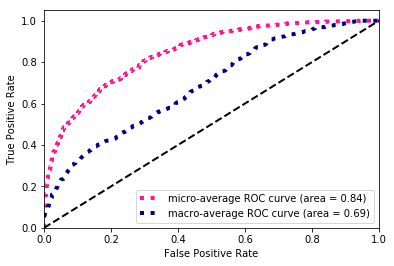

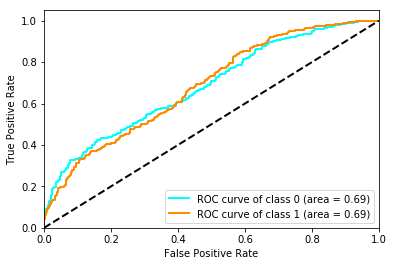

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.844691,0.344482,0.594586,0.748879,0.762337
precision,0.873770,0.302053,0.587912,0.748879,0.779644
recall,0.817485,0.400778,0.609131,0.748879,0.748879
support,1304.000000,257.000000,1561.000000,1561.000000,1561.000000
auc,0.685105,0.685105,0.686099,0.844371,NaN


******************** DNN ********************
**********  round  1
load and test: shapes for train and test, X/Y
(7671, 214)
(7671, 2)
(1561, 214)
(1561, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 214)               0         
_________________________________________________________________
dense_5 (Dense)              (None, 512)               110080    
_________________________________________________________________
dense_6 (Dense)              (None, 256)               131328    
_________________________________________________________________
batch_normalization_3 (Batch (None, 256)               1024      
_________________________________________________________________
activation_3 (Activation)    (None, 256)               0         
_________________________________________________________________
dropout_2 (Dropout)          (None, 256)           

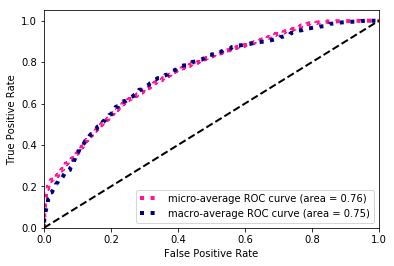

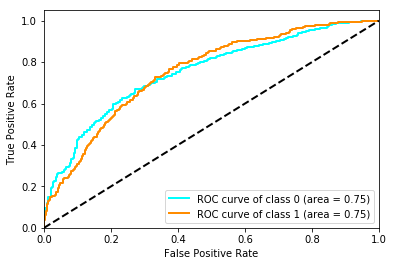

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.779301,0.420441,0.599871,0.680333,0.720219
precision,0.920585,0.299669,0.610127,0.680333,0.818359
recall,0.675613,0.704280,0.689947,0.680333,0.680333
support,1304.000000,257.000000,1561.000000,1561.000000,1561.000000
auc,0.751576,0.751576,0.752553,0.756677,NaN


******************** DNN ********************
**********  round  2
load and test: shapes for train and test, X/Y
(7671, 214)
(7671, 2)
(1561, 214)
(1561, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 214)               0         
_________________________________________________________________
dense_9 (Dense)              (None, 512)               110080    
_________________________________________________________________
dense_10 (Dense)             (None, 256)               131328    
_________________________________________________________________
batch_normalization_5 (Batch (None, 256)               1024      
_________________________________________________________________
activation_5 (Activation)    (None, 256)               0         
_________________________________________________________________
dropout_3 (Dropout)          (None, 256)           

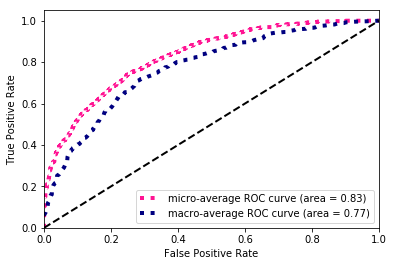

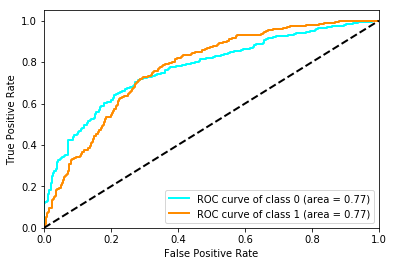

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.835275,0.448468,0.641871,0.746316,0.771591
precision,0.912727,0.349241,0.630984,0.746316,0.819956
recall,0.769939,0.626459,0.698199,0.746316,0.746316
support,1304.000000,257.000000,1561.000000,1561.000000,1561.000000
auc,0.771156,0.771156,0.772148,0.828666,NaN


******************** DNN ********************
**********  round  0
load and test: shapes for train and test, X/Y
(7671, 300)
(7671, 2)
(1561, 300)
(1561, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 300)               0         
_________________________________________________________________
dense_13 (Dense)             (None, 512)               154112    
_________________________________________________________________
dense_14 (Dense)             (None, 256)               131328    
_________________________________________________________________
batch_normalization_7 (Batch (None, 256)               1024      
_________________________________________________________________
activation_7 (Activation)    (None, 256)               0         
_________________________________________________________________
dropout_4 (Dropout)          (None, 256)           

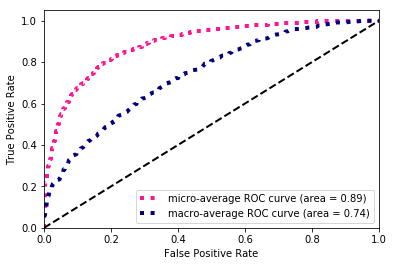

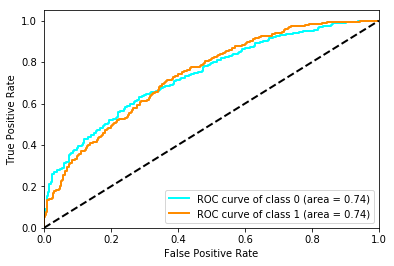

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.886450,0.375000,0.630725,0.807816,0.802246
precision,0.875187,0.403587,0.639387,0.807816,0.797544
recall,0.898006,0.350195,0.624100,0.807816,0.807816
support,1304.000000,257.000000,1561.000000,1561.000000,1561.000000
auc,0.737217,0.737217,0.738267,0.888465,NaN


******************** DNN ********************
**********  round  1
load and test: shapes for train and test, X/Y
(7671, 300)
(7671, 2)
(1561, 300)
(1561, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 300)               0         
_________________________________________________________________
dense_17 (Dense)             (None, 512)               154112    
_________________________________________________________________
dense_18 (Dense)             (None, 256)               131328    
_________________________________________________________________
batch_normalization_9 (Batch (None, 256)               1024      
_________________________________________________________________
activation_9 (Activation)    (None, 256)               0         
_________________________________________________________________
dropout_5 (Dropout)          (None, 256)           

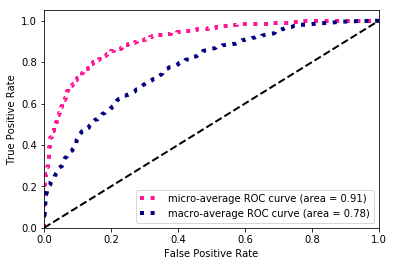

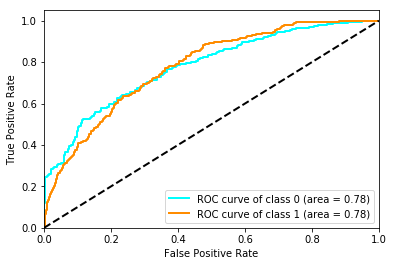

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.895802,0.387665,0.641734,0.821909,0.812143
precision,0.876100,0.446701,0.661400,0.821909,0.805404
recall,0.916411,0.342412,0.629412,0.821909,0.821909
support,1304.000000,257.000000,1561.000000,1561.000000,1561.000000
auc,0.778112,0.778112,0.779074,0.905351,NaN


******************** DNN ********************
**********  round  2
load and test: shapes for train and test, X/Y
(7671, 300)
(7671, 2)
(1561, 300)
(1561, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 300)               0         
_________________________________________________________________
dense_21 (Dense)             (None, 512)               154112    
_________________________________________________________________
dense_22 (Dense)             (None, 256)               131328    
_________________________________________________________________
batch_normalization_11 (Batc (None, 256)               1024      
_________________________________________________________________
activation_11 (Activation)   (None, 256)               0         
_________________________________________________________________
dropout_6 (Dropout)          (None, 256)           

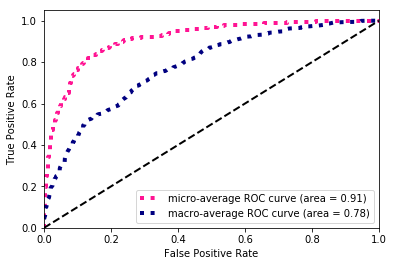

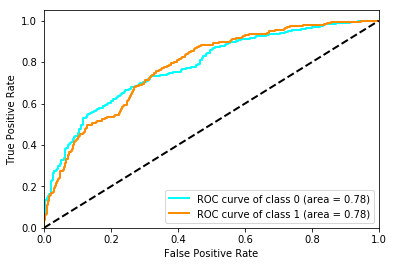

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.911055,0.284058,0.597557,0.841768,0.807828
precision,0.858792,0.556818,0.707805,0.841768,0.809075
recall,0.970092,0.190661,0.580377,0.841768,0.841768
support,1304.000000,257.000000,1561.000000,1561.000000,1561.000000
auc,0.779526,0.779526,0.780502,0.913124,NaN


******************** DNN ********************
**********  round  0
load and test: shapes for train and test, X/Y
(7671, 250)
(7671, 2)
(1561, 250)
(1561, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 250)               0         
_________________________________________________________________
dense_25 (Dense)             (None, 512)               128512    
_________________________________________________________________
dense_26 (Dense)             (None, 256)               131328    
_________________________________________________________________
batch_normalization_13 (Batc (None, 256)               1024      
_________________________________________________________________
activation_13 (Activation)   (None, 256)               0         
_________________________________________________________________
dropout_7 (Dropout)          (None, 256)           

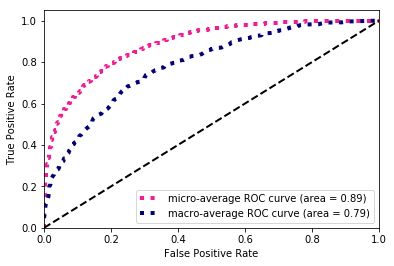

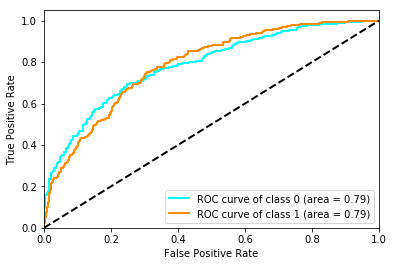

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.875292,0.424460,0.649876,0.795003,0.801068
precision,0.889857,0.394649,0.642253,0.795003,0.808327
recall,0.861196,0.459144,0.660170,0.795003,0.795003
support,1304.000000,257.000000,1561.000000,1561.000000,1561.000000
auc,0.785345,0.785345,0.786322,0.885368,NaN


******************** DNN ********************
**********  round  1
load and test: shapes for train and test, X/Y
(7671, 250)
(7671, 2)
(1561, 250)
(1561, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 250)               0         
_________________________________________________________________
dense_29 (Dense)             (None, 512)               128512    
_________________________________________________________________
dense_30 (Dense)             (None, 256)               131328    
_________________________________________________________________
batch_normalization_15 (Batc (None, 256)               1024      
_________________________________________________________________
activation_15 (Activation)   (None, 256)               0         
_________________________________________________________________
dropout_8 (Dropout)          (None, 256)           

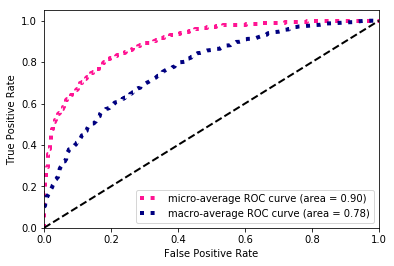

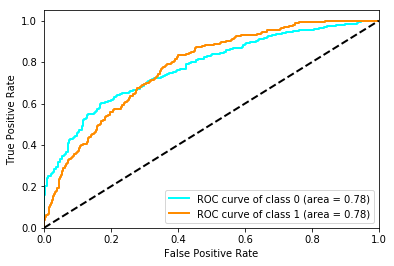

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.887790,0.401623,0.644706,0.811019,0.807748
precision,0.880755,0.419492,0.650123,0.811019,0.804813
recall,0.894939,0.385214,0.640076,0.811019,0.811019
support,1304.000000,257.000000,1561.000000,1561.000000,1561.000000
auc,0.775199,0.775199,0.776097,0.895884,NaN


******************** DNN ********************
**********  round  2
load and test: shapes for train and test, X/Y
(7671, 250)
(7671, 2)
(1561, 250)
(1561, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 250)               0         
_________________________________________________________________
dense_33 (Dense)             (None, 512)               128512    
_________________________________________________________________
dense_34 (Dense)             (None, 256)               131328    
_________________________________________________________________
batch_normalization_17 (Batc (None, 256)               1024      
_________________________________________________________________
activation_17 (Activation)   (None, 256)               0         
_________________________________________________________________
dropout_9 (Dropout)          (None, 256)           

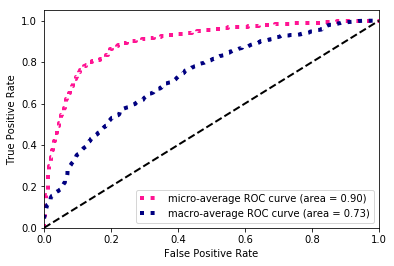

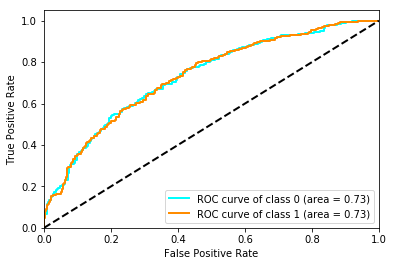

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.898256,0.243243,0.570750,0.820628,0.790416
precision,0.853591,0.398230,0.625911,0.820628,0.778621
recall,0.947853,0.175097,0.561475,0.820628,0.820628
support,1304.000000,257.000000,1561.000000,1561.000000,1561.000000
auc,0.731905,0.731905,0.733006,0.898084,NaN


******************** DNN ********************
**********  round  0
load and test: shapes for train and test, X/Y
(7671, 234)
(7671, 2)
(1561, 234)
(1561, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 234)               0         
_________________________________________________________________
dense_37 (Dense)             (None, 512)               120320    
_________________________________________________________________
dense_38 (Dense)             (None, 256)               131328    
_________________________________________________________________
batch_normalization_19 (Batc (None, 256)               1024      
_________________________________________________________________
activation_19 (Activation)   (None, 256)               0         
_________________________________________________________________
dropout_10 (Dropout)         (None, 256)           

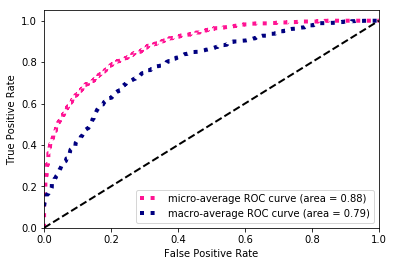

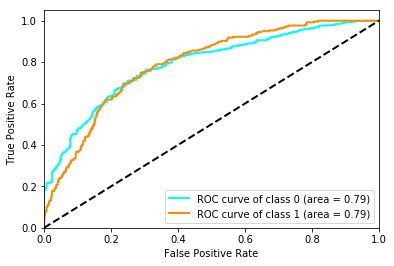

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.871611,0.475570,0.673590,0.793722,0.806407
precision,0.907807,0.408964,0.658385,0.793722,0.825679
recall,0.838190,0.568093,0.703142,0.793722,0.793722
support,1304.000000,257.000000,1561.000000,1561.000000,1561.000000
auc,0.790305,0.790305,0.790931,0.883147,NaN


******************** DNN ********************
**********  round  1
load and test: shapes for train and test, X/Y
(7671, 234)
(7671, 2)
(1561, 234)
(1561, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 234)               0         
_________________________________________________________________
dense_41 (Dense)             (None, 512)               120320    
_________________________________________________________________
dense_42 (Dense)             (None, 256)               131328    
_________________________________________________________________
batch_normalization_21 (Batc (None, 256)               1024      
_________________________________________________________________
activation_21 (Activation)   (None, 256)               0         
_________________________________________________________________
dropout_11 (Dropout)         (None, 256)           

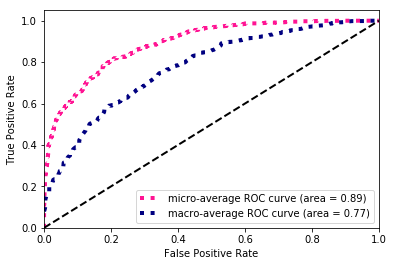

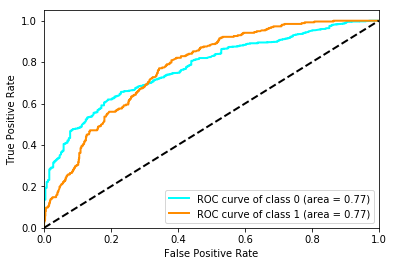

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.881108,0.409178,0.645143,0.802050,0.803410
precision,0.884170,0.402256,0.643213,0.802050,0.804828
recall,0.878067,0.416342,0.647205,0.802050,0.802050
support,1304.000000,257.000000,1561.000000,1561.000000,1561.000000
auc,0.774168,0.774168,0.774785,0.889639,NaN


******************** DNN ********************
**********  round  2
load and test: shapes for train and test, X/Y
(7671, 234)
(7671, 2)
(1561, 234)
(1561, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 234)               0         
_________________________________________________________________
dense_45 (Dense)             (None, 512)               120320    
_________________________________________________________________
dense_46 (Dense)             (None, 256)               131328    
_________________________________________________________________
batch_normalization_23 (Batc (None, 256)               1024      
_________________________________________________________________
activation_23 (Activation)   (None, 256)               0         
_________________________________________________________________
dropout_12 (Dropout)         (None, 256)           

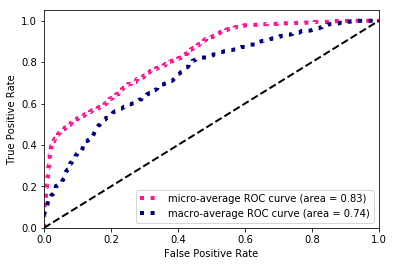

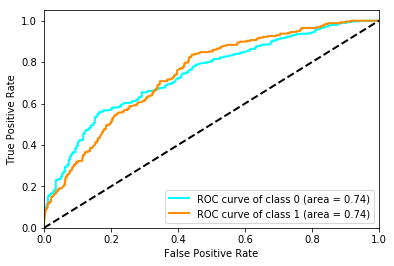

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.818068,0.404925,0.611496,0.721332,0.750049
precision,0.899724,0.312236,0.605980,0.721332,0.803001
recall,0.750000,0.575875,0.662938,0.721332,0.721332
support,1304.000000,257.000000,1561.000000,1561.000000,1561.000000
auc,0.741960,0.741960,0.742648,0.825129,NaN


******************** DNN ********************
**********  round  0
load and test: shapes for train and test, X/Y
(7671, 258)
(7671, 2)
(1561, 258)
(1561, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 258)               0         
_________________________________________________________________
dense_49 (Dense)             (None, 512)               132608    
_________________________________________________________________
dense_50 (Dense)             (None, 256)               131328    
_________________________________________________________________
batch_normalization_25 (Batc (None, 256)               1024      
_________________________________________________________________
activation_25 (Activation)   (None, 256)               0         
_________________________________________________________________
dropout_13 (Dropout)         (None, 256)           

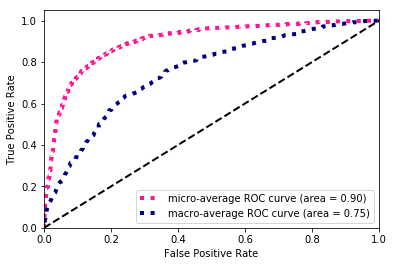

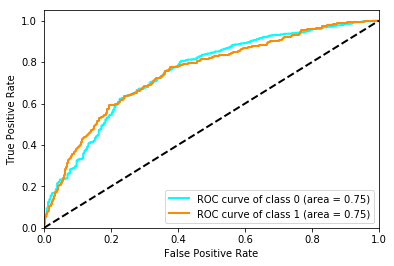

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.901440,0.353511,0.627475,0.828956,0.811230
precision,0.869039,0.467949,0.668494,0.828956,0.803004
recall,0.936350,0.284047,0.610198,0.828956,0.828956
support,1304.000000,257.000000,1561.000000,1561.000000,1561.000000
auc,0.751338,0.751340,0.752351,0.900903,NaN


******************** DNN ********************
**********  round  1
load and test: shapes for train and test, X/Y
(7671, 258)
(7671, 2)
(1561, 258)
(1561, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 258)               0         
_________________________________________________________________
dense_53 (Dense)             (None, 512)               132608    
_________________________________________________________________
dense_54 (Dense)             (None, 256)               131328    
_________________________________________________________________
batch_normalization_27 (Batc (None, 256)               1024      
_________________________________________________________________
activation_27 (Activation)   (None, 256)               0         
_________________________________________________________________
dropout_14 (Dropout)         (None, 256)           

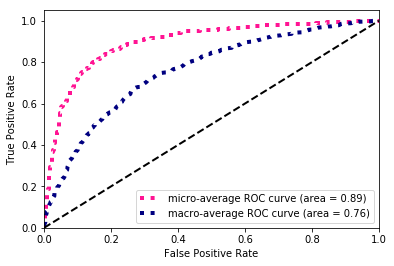

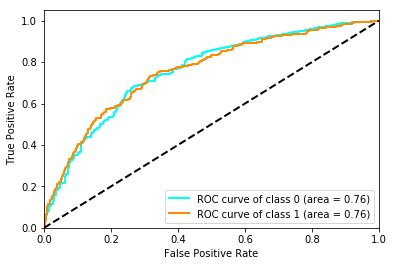

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.899369,0.368298,0.633834,0.826393,0.811934
precision,0.871850,0.459302,0.665576,0.826393,0.803929
recall,0.928681,0.307393,0.618037,0.826393,0.826393
support,1304.000000,257.000000,1561.000000,1561.000000,1561.000000
auc,0.756586,0.756586,0.757618,0.894740,NaN


******************** DNN ********************
**********  round  2
load and test: shapes for train and test, X/Y
(7671, 258)
(7671, 2)
(1561, 258)
(1561, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 258)               0         
_________________________________________________________________
dense_57 (Dense)             (None, 512)               132608    
_________________________________________________________________
dense_58 (Dense)             (None, 256)               131328    
_________________________________________________________________
batch_normalization_29 (Batc (None, 256)               1024      
_________________________________________________________________
activation_29 (Activation)   (None, 256)               0         
_________________________________________________________________
dropout_15 (Dropout)         (None, 256)           

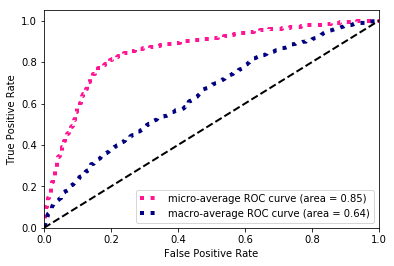

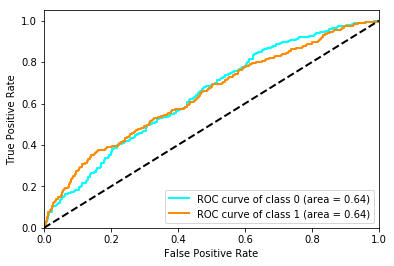

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.887653,0.287059,0.587356,0.805894,0.788772
precision,0.859296,0.363095,0.611196,0.805894,0.777603
recall,0.917945,0.237354,0.577649,0.805894,0.805894
support,1304.000000,257.000000,1561.000000,1561.000000,1561.000000
auc,0.641077,0.641077,0.642135,0.852678,NaN


******************** DNN ********************
**********  round  0
load and test: shapes for train and test, X/Y
(7671, 136)
(7671, 2)
(1561, 136)
(1561, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 136)               0         
_________________________________________________________________
dense_61 (Dense)             (None, 512)               70144     
_________________________________________________________________
dense_62 (Dense)             (None, 256)               131328    
_________________________________________________________________
batch_normalization_31 (Batc (None, 256)               1024      
_________________________________________________________________
activation_31 (Activation)   (None, 256)               0         
_________________________________________________________________
dropout_16 (Dropout)         (None, 256)           

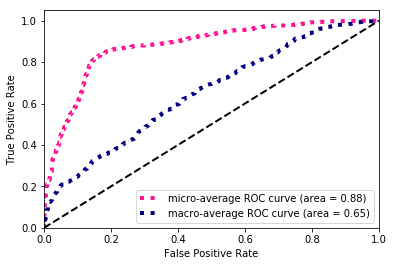

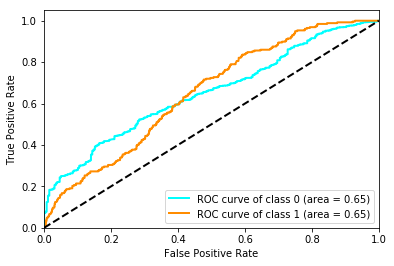

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.907806,0.103093,0.505450,0.832799,0.775320
precision,0.841519,0.441176,0.641348,0.832799,0.775608
recall,0.985429,0.058366,0.521898,0.832799,0.832799
support,1304.000000,257.000000,1561.000000,1561.000000,1561.000000
auc,0.651132,0.651132,0.651895,0.876804,NaN


******************** DNN ********************
**********  round  1
load and test: shapes for train and test, X/Y
(7671, 136)
(7671, 2)
(1561, 136)
(1561, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 136)               0         
_________________________________________________________________
dense_65 (Dense)             (None, 512)               70144     
_________________________________________________________________
dense_66 (Dense)             (None, 256)               131328    
_________________________________________________________________
batch_normalization_33 (Batc (None, 256)               1024      
_________________________________________________________________
activation_33 (Activation)   (None, 256)               0         
_________________________________________________________________
dropout_17 (Dropout)         (None, 256)           

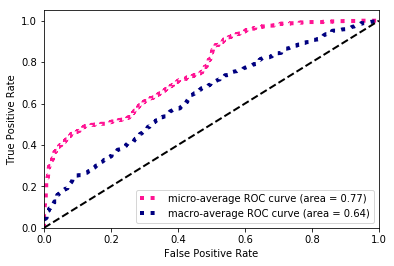

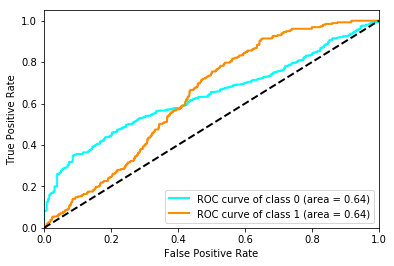

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.772077,0.271505,0.521791,0.652787,0.689664
precision,0.854749,0.207392,0.531070,0.652787,0.748169
recall,0.703988,0.392996,0.548492,0.652787,0.652787
support,1304.000000,257.000000,1561.000000,1561.000000,1561.000000
auc,0.636618,0.636618,0.637345,0.767991,NaN


******************** DNN ********************
**********  round  2
load and test: shapes for train and test, X/Y
(7671, 136)
(7671, 2)
(1561, 136)
(1561, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 136)               0         
_________________________________________________________________
dense_69 (Dense)             (None, 512)               70144     
_________________________________________________________________
dense_70 (Dense)             (None, 256)               131328    
_________________________________________________________________
batch_normalization_35 (Batc (None, 256)               1024      
_________________________________________________________________
activation_35 (Activation)   (None, 256)               0         
_________________________________________________________________
dropout_18 (Dropout)         (None, 256)           

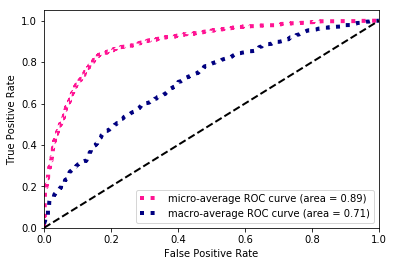

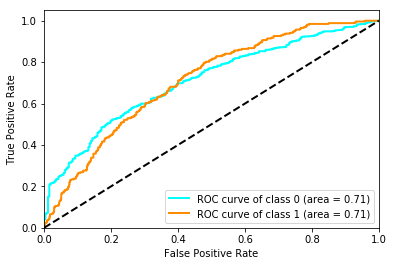

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.909919,0.044610,0.477265,0.835362,0.767456
precision,0.837960,0.500000,0.668980,0.835362,0.782319
recall,0.995399,0.023346,0.509373,0.835362,0.835362
support,1304.000000,257.000000,1561.000000,1561.000000,1561.000000
auc,0.708611,0.708611,0.709359,0.892707,NaN


In [17]:
Miami = compare_models(city='Miami',classname='DNN')

In [18]:
Miami.to_hdf('Miami.h5',key='DNN')
Miami

,NL,geohash,traffic,weather,time,geo
0_f1-score,0.819756,0.897769,0.887113,0.856929,0.896154,0.863268
1_f1-score,0.404464,0.348908,0.356442,0.429891,0.336289,0.139736
weighted avg_f1-score,0.751383,0.807406,0.799744,0.786622,0.803979,0.744147
micro avg_f1-score,0.725176,0.823831,0.808883,0.772368,0.820414,0.773649
macro avg_f1-score,0.612110,0.623338,0.621777,0.643410,0.616222,0.501502
0_precision,0.902361,0.870026,0.874734,0.897234,0.866729,0.844743
1_precision,0.316987,0.469035,0.404123,0.374485,0.430115,0.382856
weighted avg_precision,0.805986,0.804008,0.797254,0.811169,0.794845,0.768699
micro avg_precision,0.725176,0.823831,0.808883,0.772368,0.820414,0.773649
macro avg_precision,0.609674,0.669531,0.639429,0.635859,0.648422,0.613799


******************** RNN_wo_NLP ********************
**********  round  0
load and test: shapes for train and test, X/Y
(7671, 314)
(7671, 2)
(1561, 314)
(1561, 2)
(7671, 8, 25)
(7671, 14)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 25)        0                                            
__________________________________________________________________________________________________
lstm_1 (LSTM)                   (None, 8, 128)       78848       main_input[0][0]                 
__________________________________________________________________________________________________
geohash_input (InputLayer)      (None, 14)           0                                            
__________________________________________________________________________________________________
lstm_2 (LSTM)      

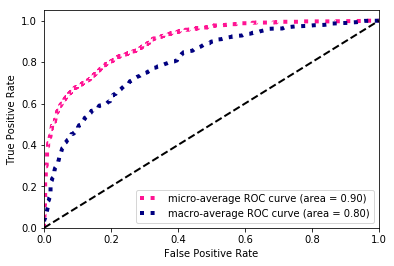

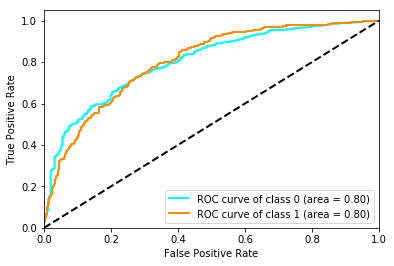

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.877914,0.477157,0.677536,0.802050,0.811934
precision,0.905460,0.422156,0.663808,0.802050,0.825890
recall,0.851994,0.548638,0.700316,0.802050,0.802050
support,1304.000000,257.000000,1561.000000,1561.000000,1561.000000
auc,0.803235,0.803236,0.804212,0.897535,NaN


******************** RNN_wo_NLP ********************
**********  round  1
load and test: shapes for train and test, X/Y
(7671, 314)
(7671, 2)
(1561, 314)
(1561, 2)
(7671, 8, 25)
(7671, 14)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 25)        0                                            
__________________________________________________________________________________________________
lstm_3 (LSTM)                   (None, 8, 128)       78848       main_input[0][0]                 
__________________________________________________________________________________________________
geohash_input (InputLayer)      (None, 14)           0                                            
__________________________________________________________________________________________________
lstm_4 (LSTM)      

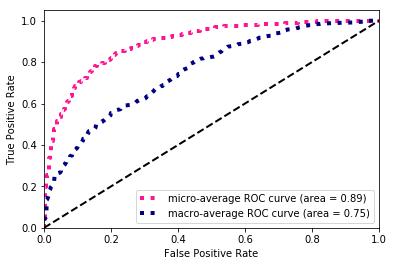

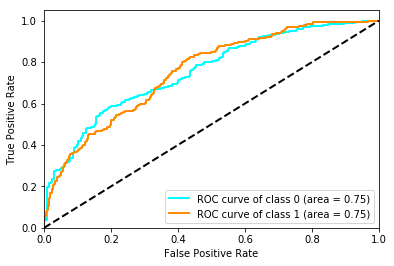

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.885246,0.396794,0.641020,0.807175,0.804828
precision,0.880212,0.409091,0.644652,0.807175,0.802648
recall,0.890337,0.385214,0.637776,0.807175,0.807175
support,1304.000000,257.000000,1561.000000,1561.000000,1561.000000
auc,0.752879,0.752879,0.753874,0.893243,NaN


******************** RNN_wo_NLP ********************
**********  round  2
load and test: shapes for train and test, X/Y
(7671, 314)
(7671, 2)
(1561, 314)
(1561, 2)
(7671, 8, 25)
(7671, 14)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 25)        0                                            
__________________________________________________________________________________________________
lstm_5 (LSTM)                   (None, 8, 128)       78848       main_input[0][0]                 
__________________________________________________________________________________________________
geohash_input (InputLayer)      (None, 14)           0                                            
__________________________________________________________________________________________________
lstm_6 (LSTM)      

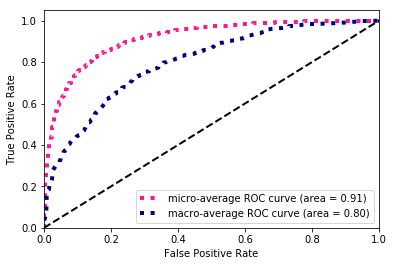

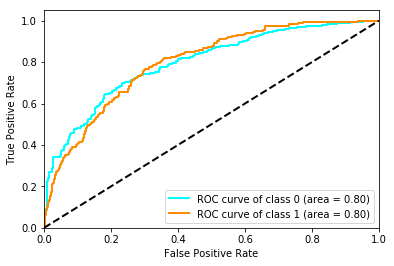

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.902913,0.414414,0.658664,0.833440,0.822487
precision,0.879913,0.491979,0.685946,0.833440,0.816044
recall,0.927147,0.357977,0.642562,0.833440,0.833440
support,1304.000000,257.000000,1561.000000,1561.000000,1561.000000
auc,0.797075,0.797075,0.798043,0.914296,NaN


******************** RNN_wo_geohash ********************
**********  round  0
load and test: shapes for train and test, X/Y
(7671, 314)
(7671, 2)
(1561, 314)
(1561, 2)
(7671, 8, 25)
(7671, 100)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 25)        0                                            
__________________________________________________________________________________________________
lstm_7 (LSTM)                   (None, 8, 128)       78848       main_input[0][0]                 
__________________________________________________________________________________________________
nlp_input (InputLayer)          (None, 100)          0                                            
__________________________________________________________________________________________________
lstm_8 (LSTM) 

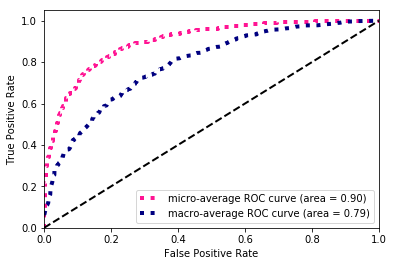

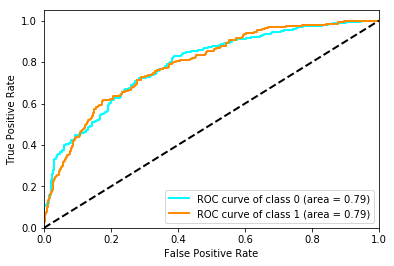

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.890173,0.459203,0.674688,0.817425,0.819219
precision,0.894655,0.448148,0.671402,0.817425,0.821143
recall,0.885736,0.470817,0.678277,0.817425,0.817425
support,1304.000000,257.000000,1561.000000,1561.000000,1561.000000
auc,0.789606,0.789606,0.790579,0.898645,NaN


******************** RNN_wo_geohash ********************
**********  round  1
load and test: shapes for train and test, X/Y
(7671, 314)
(7671, 2)
(1561, 314)
(1561, 2)
(7671, 8, 25)
(7671, 100)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 25)        0                                            
__________________________________________________________________________________________________
lstm_9 (LSTM)                   (None, 8, 128)       78848       main_input[0][0]                 
__________________________________________________________________________________________________
nlp_input (InputLayer)          (None, 100)          0                                            
__________________________________________________________________________________________________
lstm_10 (LSTM)

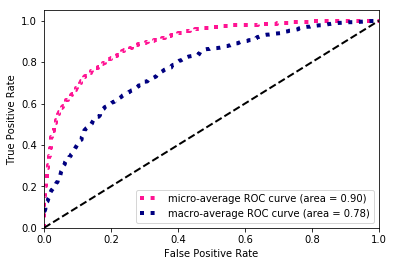

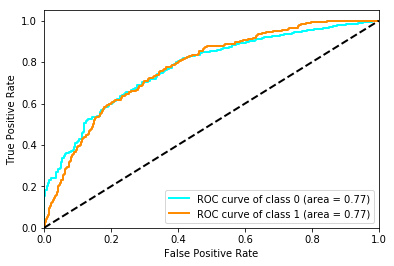

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.886677,0.419608,0.653142,0.810378,0.809780
precision,0.885321,0.422925,0.654123,0.810378,0.809193
recall,0.888037,0.416342,0.652190,0.810378,0.810378
support,1304.000000,257.000000,1561.000000,1561.000000,1561.000000
auc,0.774435,0.774435,0.775408,0.896048,NaN


******************** RNN_wo_geohash ********************
**********  round  2
load and test: shapes for train and test, X/Y
(7671, 314)
(7671, 2)
(1561, 314)
(1561, 2)
(7671, 8, 25)
(7671, 100)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 25)        0                                            
__________________________________________________________________________________________________
lstm_11 (LSTM)                  (None, 8, 128)       78848       main_input[0][0]                 
__________________________________________________________________________________________________
nlp_input (InputLayer)          (None, 100)          0                                            
__________________________________________________________________________________________________
lstm_12 (LSTM)

 - 1s - loss: 0.3065 - f1_score: 0.3784 - val_loss: 0.2432 - val_f1_score: 0.0183
Epoch 48/60
 - 1s - loss: 0.3043 - f1_score: 0.3534 - val_loss: 0.2655 - val_f1_score: 0.1471
Epoch 49/60
 - 1s - loss: 0.3025 - f1_score: 0.3932 - val_loss: 0.2666 - val_f1_score: 0.0763
Epoch 50/60
 - 1s - loss: 0.3018 - f1_score: 0.3920 - val_loss: 0.2678 - val_f1_score: 0.1447
Epoch 51/60
 - 1s - loss: 0.3025 - f1_score: 0.3966 - val_loss: 0.2893 - val_f1_score: 0.2458
Epoch 52/60
 - 1s - loss: 0.3047 - f1_score: 0.3945 - val_loss: 0.2784 - val_f1_score: 0.1307
Epoch 53/60
 - 1s - loss: 0.3049 - f1_score: 0.3707 - val_loss: 0.2653 - val_f1_score: 0.0763
Epoch 54/60
 - 1s - loss: 0.3024 - f1_score: 0.3926 - val_loss: 0.2712 - val_f1_score: 0.0185
Epoch 55/60
 - 1s - loss: 0.3017 - f1_score: 0.3922 - val_loss: 0.2536 - val_f1_score: 0.0000e+00
Epoch 56/60
 - 1s - loss: 0.2985 - f1_score: 0.4223 - val_loss: 0.2657 - val_f1_score: 0.0645
Epoch 57/60
 - 1s - loss: 0.2949 - f1_score: 0.3974 - val_loss: 0.26

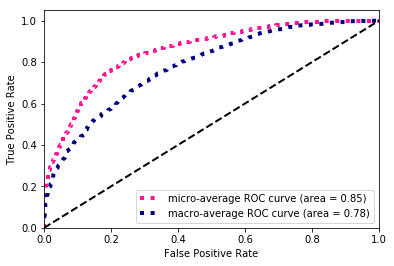

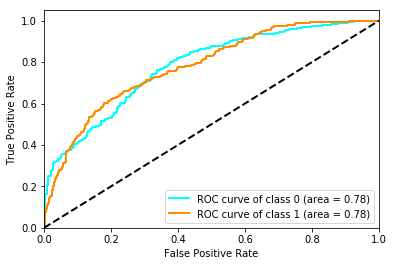

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.859692,0.472561,0.666126,0.778347,0.795955
precision,0.912220,0.388471,0.650346,0.778347,0.825991
recall,0.812883,0.603113,0.707998,0.778347,0.778347
support,1304.000000,257.000000,1561.000000,1561.000000,1561.000000
auc,0.780165,0.780165,0.781137,0.853200,NaN


******************** RNN ********************
**********  round  0
load and test: shapes for train and test, X/Y
(7671, 250)
(7671, 2)
(1561, 250)
(1561, 2)
(7671, 8, 17)
(7671, 14)
(7671, 100)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 17)        0                                            
__________________________________________________________________________________________________
lstm_13 (LSTM)                  (None, 8, 128)       74752       main_input[0][0]                 
__________________________________________________________________________________________________
geohash_input (InputLayer)      (None, 14)           0                                            
__________________________________________________________________________________________________
nlp_input (Inp

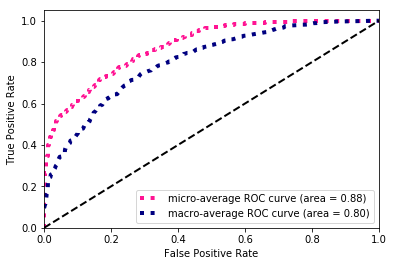

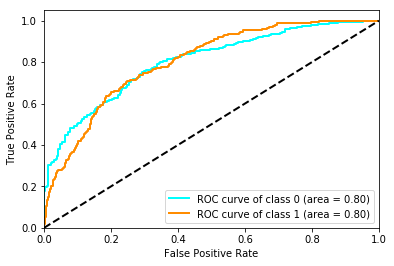

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.855501,0.486880,0.671191,0.774504,0.794812
precision,0.920495,0.389277,0.654886,0.774504,0.833036
recall,0.799080,0.649805,0.724443,0.774504,0.774504
support,1304.000000,257.000000,1561.000000,1561.000000,1561.000000
auc,0.801914,0.801914,0.802922,0.875915,NaN


******************** RNN ********************
**********  round  1
load and test: shapes for train and test, X/Y
(7671, 250)
(7671, 2)
(1561, 250)
(1561, 2)
(7671, 8, 17)
(7671, 14)
(7671, 100)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 17)        0                                            
__________________________________________________________________________________________________
lstm_15 (LSTM)                  (None, 8, 128)       74752       main_input[0][0]                 
__________________________________________________________________________________________________
geohash_input (InputLayer)      (None, 14)           0                                            
__________________________________________________________________________________________________
nlp_input (Inp

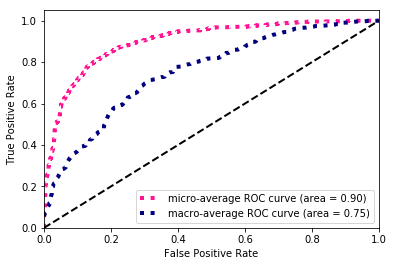

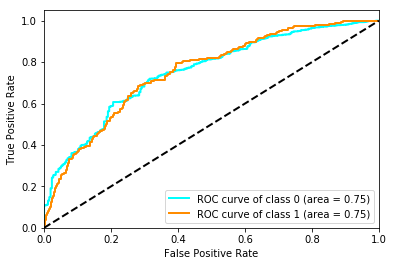

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.898851,0.354610,0.626731,0.825112,0.809249
precision,0.869534,0.451807,0.660671,0.825112,0.800760
recall,0.930215,0.291829,0.611022,0.825112,0.825112
support,1304.000000,257.000000,1561.000000,1561.000000,1561.000000
auc,0.753105,0.753106,0.754124,0.901120,NaN


******************** RNN ********************
**********  round  2
load and test: shapes for train and test, X/Y
(7671, 250)
(7671, 2)
(1561, 250)
(1561, 2)
(7671, 8, 17)
(7671, 14)
(7671, 100)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 17)        0                                            
__________________________________________________________________________________________________
lstm_17 (LSTM)                  (None, 8, 128)       74752       main_input[0][0]                 
__________________________________________________________________________________________________
geohash_input (InputLayer)      (None, 14)           0                                            
__________________________________________________________________________________________________
nlp_input (Inp

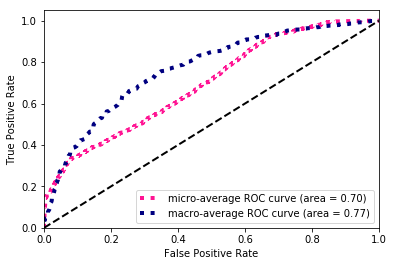

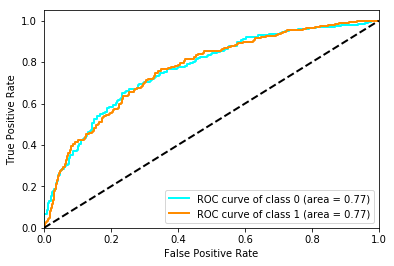

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.705601,0.404647,0.555124,0.606022,0.656052
precision,0.938854,0.269330,0.604092,0.606022,0.828624
recall,0.565184,0.813230,0.689207,0.606022,0.606022
support,1304.000000,257.000000,1561.000000,1561.000000,1561.000000
auc,0.765114,0.765114,0.766163,0.695628,NaN


******************** RNN ********************
**********  round  0
load and test: shapes for train and test, X/Y
(7671, 234)
(7671, 2)
(1561, 234)
(1561, 2)
(7671, 8, 15)
(7671, 14)
(7671, 100)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 15)        0                                            
__________________________________________________________________________________________________
lstm_19 (LSTM)                  (None, 8, 128)       73728       main_input[0][0]                 
__________________________________________________________________________________________________
geohash_input (InputLayer)      (None, 14)           0                                            
__________________________________________________________________________________________________
nlp_input (Inp

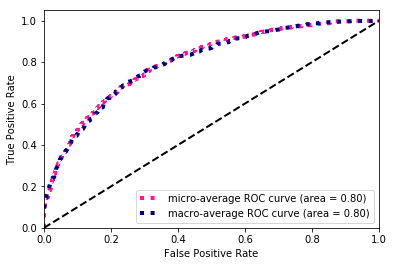

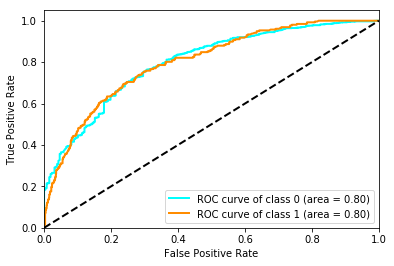

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.810577,0.463804,0.637190,0.720051,0.753485
precision,0.932203,0.338710,0.635457,0.720051,0.834492
recall,0.717025,0.735409,0.726217,0.720051,0.720051
support,1304.000000,257.000000,1561.000000,1561.000000,1561.000000
auc,0.799090,0.799090,0.799738,0.802586,NaN


******************** RNN ********************
**********  round  1
load and test: shapes for train and test, X/Y
(7671, 234)
(7671, 2)
(1561, 234)
(1561, 2)
(7671, 8, 15)
(7671, 14)
(7671, 100)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 15)        0                                            
__________________________________________________________________________________________________
lstm_21 (LSTM)                  (None, 8, 128)       73728       main_input[0][0]                 
__________________________________________________________________________________________________
geohash_input (InputLayer)      (None, 14)           0                                            
__________________________________________________________________________________________________
nlp_input (Inp

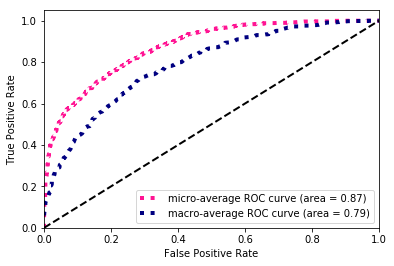

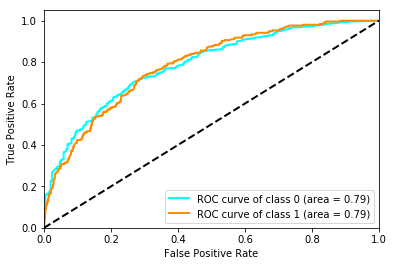

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.855758,0.448223,0.651990,0.771300,0.788662
precision,0.904355,0.371795,0.638075,0.771300,0.816676
recall,0.812117,0.564202,0.688159,0.771300,0.771300
support,1304.000000,257.000000,1561.000000,1561.000000,1561.000000
auc,0.785695,0.785695,0.786353,0.873037,NaN


******************** RNN ********************
**********  round  2
load and test: shapes for train and test, X/Y
(7671, 234)
(7671, 2)
(1561, 234)
(1561, 2)
(7671, 8, 15)
(7671, 14)
(7671, 100)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 15)        0                                            
__________________________________________________________________________________________________
lstm_23 (LSTM)                  (None, 8, 128)       73728       main_input[0][0]                 
__________________________________________________________________________________________________
geohash_input (InputLayer)      (None, 14)           0                                            
__________________________________________________________________________________________________
nlp_input (Inp

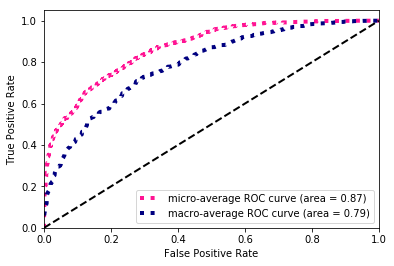

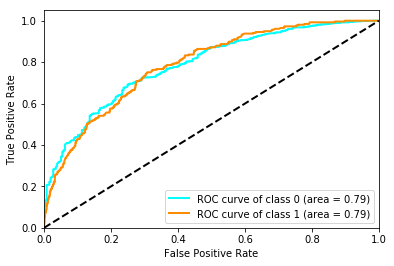

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.854604,0.442724,0.648664,0.769379,0.786793
precision,0.902730,0.367609,0.635170,0.769379,0.814629
recall,0.811350,0.556420,0.683885,0.769379,0.769379
support,1304.000000,257.000000,1561.000000,1561.000000,1561.000000
auc,0.786668,0.786668,0.787253,0.868002,NaN


******************** RNN ********************
**********  round  0
load and test: shapes for train and test, X/Y
(7671, 258)
(7671, 2)
(1561, 258)
(1561, 2)
(7671, 8, 18)
(7671, 14)
(7671, 100)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 18)        0                                            
__________________________________________________________________________________________________
lstm_25 (LSTM)                  (None, 8, 128)       75264       main_input[0][0]                 
__________________________________________________________________________________________________
geohash_input (InputLayer)      (None, 14)           0                                            
__________________________________________________________________________________________________
nlp_input (Inp

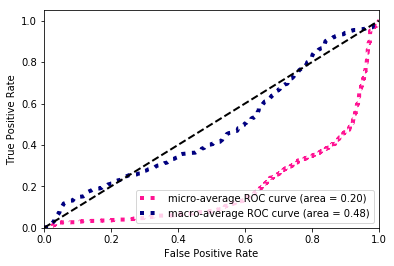

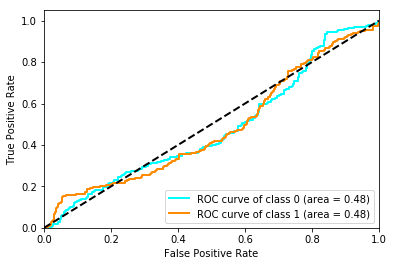

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.282971,0.282051,0.282511,0.282511,0.282819
precision,0.856589,0.168841,0.512715,0.282511,0.743360
recall,0.169479,0.856031,0.512755,0.282511,0.282511
support,1304.000000,257.000000,1561.000000,1561.000000,1561.000000
auc,0.480243,0.480243,0.481409,0.195391,NaN


******************** RNN ********************
**********  round  1
load and test: shapes for train and test, X/Y
(7671, 258)
(7671, 2)
(1561, 258)
(1561, 2)
(7671, 8, 18)
(7671, 14)
(7671, 100)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 18)        0                                            
__________________________________________________________________________________________________
lstm_27 (LSTM)                  (None, 8, 128)       75264       main_input[0][0]                 
__________________________________________________________________________________________________
geohash_input (InputLayer)      (None, 14)           0                                            
__________________________________________________________________________________________________
nlp_input (Inp

/users/PAS0536/osu9965/.local/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


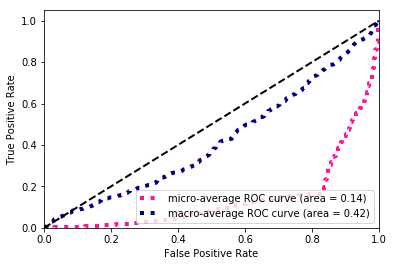

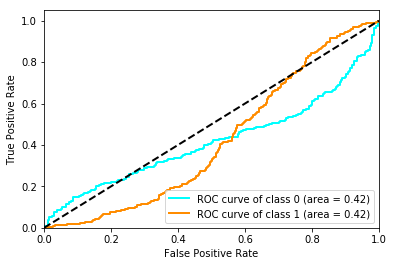

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.000000,0.282728,0.141364,0.164638,0.046548
precision,0.000000,0.164638,0.082319,0.164638,0.027106
recall,0.000000,1.000000,0.500000,0.164638,0.164638
support,1304.000000,257.000000,1561.000000,1561.000000,1561.000000
auc,0.418646,0.418646,0.419905,0.142260,NaN


******************** RNN ********************
**********  round  2
load and test: shapes for train and test, X/Y
(7671, 258)
(7671, 2)
(1561, 258)
(1561, 2)
(7671, 8, 18)
(7671, 14)
(7671, 100)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 18)        0                                            
__________________________________________________________________________________________________
lstm_29 (LSTM)                  (None, 8, 128)       75264       main_input[0][0]                 
__________________________________________________________________________________________________
geohash_input (InputLayer)      (None, 14)           0                                            
__________________________________________________________________________________________________
nlp_input (Inp

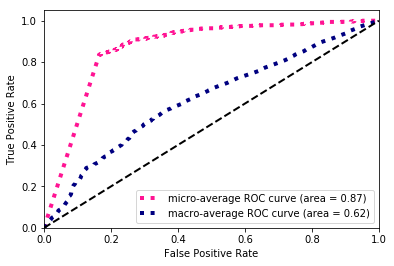

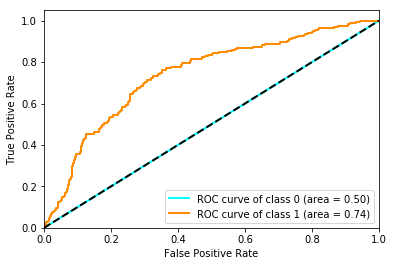

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.910297,0.00000,0.455148,0.835362,0.760427
precision,0.835362,0.00000,0.417681,0.835362,0.697830
recall,1.000000,0.00000,0.500000,0.835362,0.835362
support,1304.000000,257.00000,1561.000000,1561.000000,1561.000000
auc,0.500000,0.73856,0.620467,0.868172,NaN


******************** RNN_wo_geo ********************
**********  round  0
load and test: shapes for train and test, X/Y
(7671, 250)
(7671, 2)
(1561, 250)
(1561, 2)
(7671, 8, 17)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 8, 17)             0         
_________________________________________________________________
lstm_31 (LSTM)               (None, 8, 128)            74752     
_________________________________________________________________
lstm_32 (LSTM)               (None, 128)               131584    
_________________________________________________________________
dense_157 (Dense)            (None, 512)               66048     
_________________________________________________________________
dense_158 (Dense)            (None, 256)               131328    
_________________________________________________________________
batch_normalization_67 (Batc (

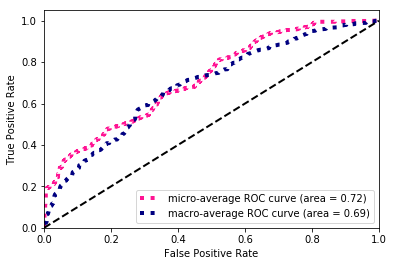

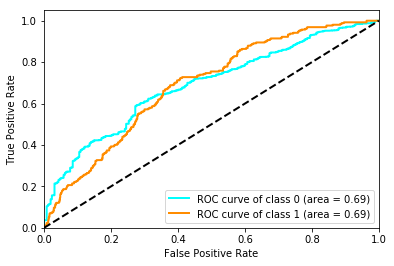

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.749438,0.380423,0.564930,0.643177,0.688684
precision,0.906420,0.266355,0.586388,0.643177,0.801041
recall,0.638804,0.665370,0.652087,0.643177,0.643177
support,1304.000000,257.000000,1561.000000,1561.000000,1561.000000
auc,0.688968,0.688968,0.689690,0.720280,NaN


******************** RNN_wo_geo ********************
**********  round  1
load and test: shapes for train and test, X/Y
(7671, 250)
(7671, 2)
(1561, 250)
(1561, 2)
(7671, 8, 17)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 8, 17)             0         
_________________________________________________________________
lstm_33 (LSTM)               (None, 8, 128)            74752     
_________________________________________________________________
lstm_34 (LSTM)               (None, 128)               131584    
_________________________________________________________________
dense_161 (Dense)            (None, 512)               66048     
_________________________________________________________________
dense_162 (Dense)            (None, 256)               131328    
_________________________________________________________________
batch_normalization_69 (Batc (

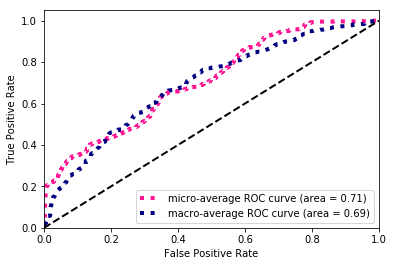

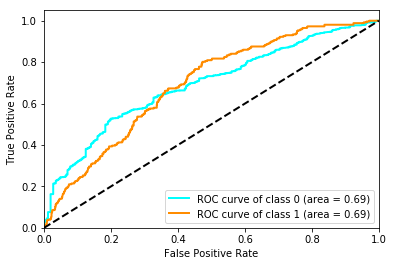

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.748990,0.375419,0.562204,0.641896,0.687486
precision,0.903575,0.263323,0.583449,0.641896,0.798165
recall,0.639571,0.653696,0.646634,0.641896,0.641896
support,1304.000000,257.000000,1561.000000,1561.000000,1561.000000
auc,0.691630,0.691630,0.692305,0.707339,NaN


******************** RNN_wo_geo ********************
**********  round  2
load and test: shapes for train and test, X/Y
(7671, 250)
(7671, 2)
(1561, 250)
(1561, 2)
(7671, 8, 17)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 8, 17)             0         
_________________________________________________________________
lstm_35 (LSTM)               (None, 8, 128)            74752     
_________________________________________________________________
lstm_36 (LSTM)               (None, 128)               131584    
_________________________________________________________________
dense_165 (Dense)            (None, 512)               66048     
_________________________________________________________________
dense_166 (Dense)            (None, 256)               131328    
_________________________________________________________________
batch_normalization_71 (Batc (

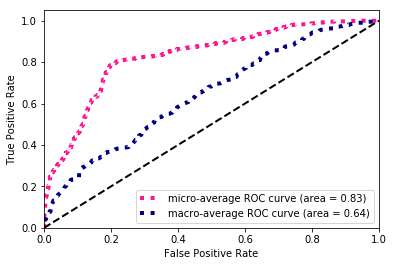

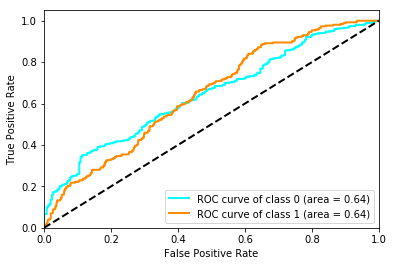

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.879285,0.260274,0.569779,0.792441,0.777372
precision,0.855072,0.314917,0.584995,0.792441,0.766142
recall,0.904908,0.221790,0.563349,0.792441,0.792441
support,1304.000000,257.000000,1561.000000,1561.000000,1561.000000
auc,0.643135,0.643135,0.643940,0.826924,NaN


In [19]:
Miami = compare_models(city='Miami',classname='RNN')

In [20]:
Miami.to_hdf('Miami.h5',key='RNN')
Miami

,NL,geohash,traffic,weather,time,geo
0_f1-score,0.888691,0.878847,0.819984,0.840313,0.397756,0.792571
1_f1-score,0.429455,0.450457,0.415379,0.451584,0.188260,0.338705
weighted avg_f1-score,0.813083,0.808318,0.753371,0.776313,0.363265,0.717847
micro avg_f1-score,0.814222,0.802050,0.735212,0.753577,0.427504,0.692505
macro avg_f1-score,0.659073,0.664652,0.617682,0.645948,0.293008,0.565638
0_precision,0.888528,0.897399,0.909627,0.913096,0.563984,0.888356
1_precision,0.441075,0.419848,0.370138,0.359371,0.111160,0.281532
weighted avg_precision,0.814861,0.818776,0.820807,0.821932,0.489432,0.788450
micro avg_precision,0.814222,0.802050,0.735212,0.753577,0.427504,0.692505
macro avg_precision,0.664802,0.658623,0.639883,0.636234,0.337572,0.584944


******************** RNN_embed_wo_NLP ********************
**********  round  0
load and test: shapes for train and test, X/Y
(7671, 315)
(7671, 2)
(1561, 315)
(1561, 2)
(7671, 8, 25)
(7671, 14)
(7671,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 25)        0                                            
__________________________________________________________________________________________________
embedding_1 (Embedding)         (None, 1, 128)       119680      geo_code[0][0]                   
__________________________________________________________________________________________________
lstm_

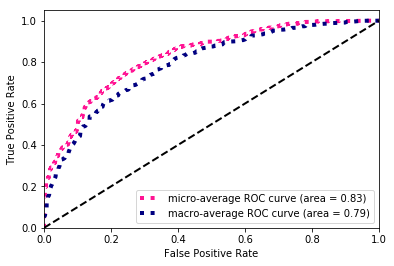

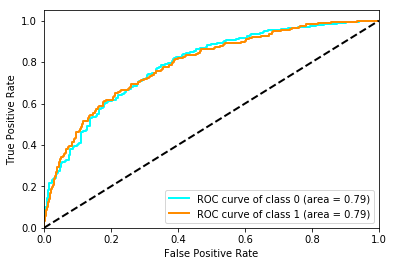

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.837928,0.467033,0.652481,0.751441,0.776865
precision,0.920183,0.360934,0.640559,0.751441,0.828110
recall,0.769172,0.661479,0.715325,0.751441,0.751441
support,1304.000000,257.000000,1561.000000,1561.000000,1561.000000
auc,0.789397,0.789397,0.790283,0.829176,NaN


******************** RNN_embed_wo_NLP ********************
**********  round  1
load and test: shapes for train and test, X/Y
(7671, 315)
(7671, 2)
(1561, 315)
(1561, 2)
(7671, 8, 25)
(7671, 14)
(7671,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 25)        0                                            
__________________________________________________________________________________________________
embedding_2 (Embedding)         (None, 1, 128)       119680      geo_code[0][0]                   
__________________________________________________________________________________________________
lstm_

/users/PAS0536/osu9965/.local/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


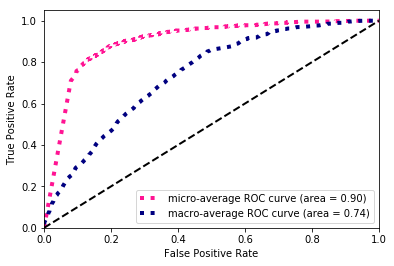

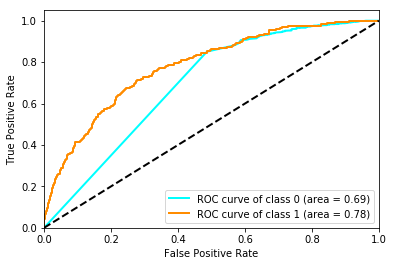

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.910297,0.000000,0.455148,0.835362,0.760427
precision,0.835362,0.000000,0.417681,0.835362,0.697830
recall,1.000000,0.000000,0.500000,0.835362,0.835362
support,1304.000000,257.000000,1561.000000,1561.000000,1561.000000
auc,0.692546,0.779968,0.737097,0.900348,NaN


******************** RNN_embed_wo_NLP ********************
**********  round  2
load and test: shapes for train and test, X/Y
(7671, 315)
(7671, 2)
(1561, 315)
(1561, 2)
(7671, 8, 25)
(7671, 14)
(7671,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 25)        0                                            
__________________________________________________________________________________________________
embedding_3 (Embedding)         (None, 1, 128)       119680      geo_code[0][0]                   
__________________________________________________________________________________________________
lstm_

Epoch 38/60
 - 1s - loss: 0.3108 - f1_score: 0.3305 - val_loss: 0.3517 - val_f1_score: 0.2088
Epoch 39/60
 - 1s - loss: 0.3147 - f1_score: 0.3052 - val_loss: 0.2471 - val_f1_score: 0.1805
Epoch 40/60
 - 1s - loss: 0.3107 - f1_score: 0.3302 - val_loss: 0.3312 - val_f1_score: 0.2139
Epoch 41/60
 - 1s - loss: 0.3121 - f1_score: 0.2986 - val_loss: 0.2858 - val_f1_score: 0.2143
Epoch 42/60
 - 1s - loss: 0.3113 - f1_score: 0.3302 - val_loss: 0.2450 - val_f1_score: 0.0357


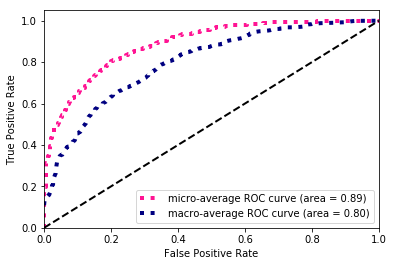

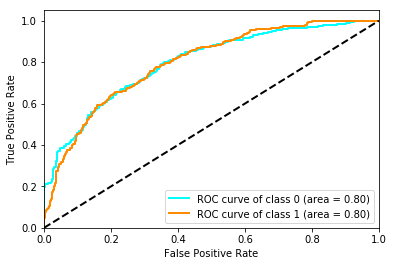

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.877235,0.489256,0.683246,0.802050,0.813359
precision,0.910140,0.425287,0.667714,0.802050,0.830315
recall,0.846626,0.575875,0.711251,0.802050,0.802050
support,1304.000000,257.000000,1561.000000,1561.000000,1561.000000
auc,0.797704,0.797704,0.798687,0.886149,NaN


******************** RNN_embed_wo_geohash ********************
**********  round  0
load and test: shapes for train and test, X/Y
(7671, 315)
(7671, 2)
(1561, 315)
(1561, 2)
(7671, 8, 25)
(7671, 100)
(7671,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 25)        0                                            
__________________________________________________________________________________________________
embedding_4 (Embedding)         (None, 1, 128)       119680      geo_code[0][0]                   
__________________________________________________________________________________________________


Epoch 38/60
 - 1s - loss: 0.3142 - f1_score: 0.3604 - val_loss: 0.3531 - val_f1_score: 0.2528
Epoch 39/60
 - 1s - loss: 0.3121 - f1_score: 0.3234 - val_loss: 0.3064 - val_f1_score: 0.1828
Epoch 40/60
 - 1s - loss: 0.3117 - f1_score: 0.3280 - val_loss: 0.2443 - val_f1_score: 0.1688
Epoch 41/60
 - 1s - loss: 0.3099 - f1_score: 0.3791 - val_loss: 0.2554 - val_f1_score: 0.2235
Epoch 42/60
 - 1s - loss: 0.3071 - f1_score: 0.3677 - val_loss: 0.2535 - val_f1_score: 0.1231
Epoch 43/60
 - 1s - loss: 0.3058 - f1_score: 0.3678 - val_loss: 0.2403 - val_f1_score: 0.1527
Epoch 44/60
 - 1s - loss: 0.3108 - f1_score: 0.3826 - val_loss: 0.2785 - val_f1_score: 0.0615
Epoch 45/60
 - 1s - loss: 0.3087 - f1_score: 0.3271 - val_loss: 0.2416 - val_f1_score: 0.1399
Epoch 46/60
 - 1s - loss: 0.3067 - f1_score: 0.3863 - val_loss: 0.2694 - val_f1_score: 0.1512
Epoch 47/60
 - 1s - loss: 0.3079 - f1_score: 0.3615 - val_loss: 0.2406 - val_f1_score: 0.0667
Epoch 48/60
 - 1s - loss: 0.3058 - f1_score: 0.3667 - val_lo

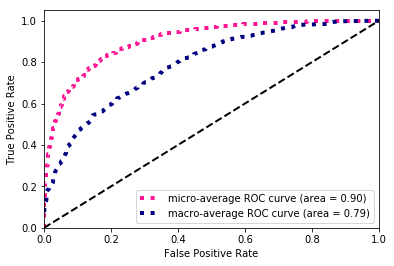

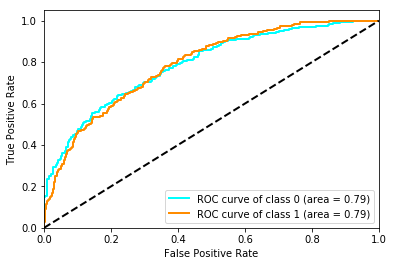

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.895362,0.467836,0.681599,0.825112,0.824975
precision,0.895019,0.468750,0.681885,0.825112,0.824839
recall,0.895706,0.466926,0.681316,0.825112,0.825112
support,1304.000000,257.000000,1561.000000,1561.000000,1561.000000
auc,0.787717,0.787717,0.788681,0.904677,NaN


******************** RNN_embed_wo_geohash ********************
**********  round  1
load and test: shapes for train and test, X/Y
(7671, 315)
(7671, 2)
(1561, 315)
(1561, 2)
(7671, 8, 25)
(7671, 100)
(7671,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 25)        0                                            
__________________________________________________________________________________________________
embedding_5 (Embedding)         (None, 1, 128)       119680      geo_code[0][0]                   
__________________________________________________________________________________________________


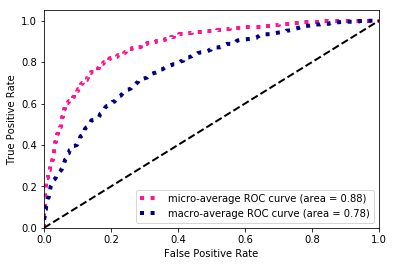

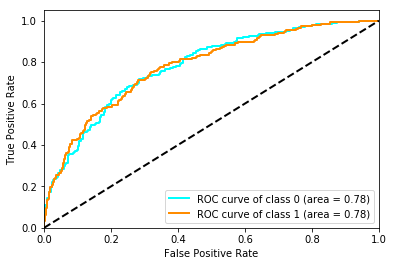

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.884030,0.470588,0.677309,0.809737,0.815961
precision,0.900557,0.434211,0.667384,0.809737,0.823779
recall,0.868098,0.513619,0.690858,0.809737,0.809737
support,1304.000000,257.000000,1561.000000,1561.000000,1561.000000
auc,0.780359,0.780359,0.781410,0.884246,NaN


******************** RNN_embed_wo_geohash ********************
**********  round  2
load and test: shapes for train and test, X/Y
(7671, 315)
(7671, 2)
(1561, 315)
(1561, 2)
(7671, 8, 25)
(7671, 100)
(7671,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 25)        0                                            
__________________________________________________________________________________________________
embedding_6 (Embedding)         (None, 1, 128)       119680      geo_code[0][0]                   
__________________________________________________________________________________________________


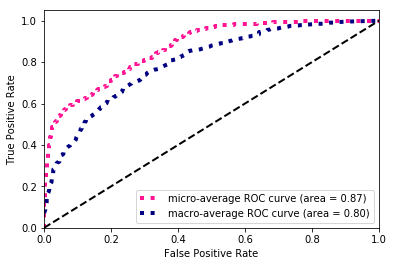

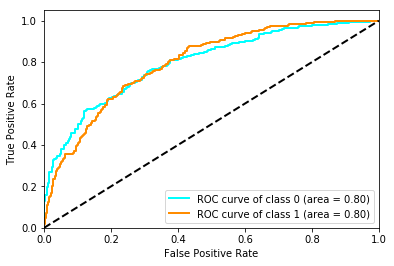

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.840748,0.465830,0.653289,0.754644,0.779023
precision,0.918256,0.363043,0.640650,0.754644,0.826847
recall,0.775307,0.649805,0.712556,0.754644,0.754644
support,1304.000000,257.000000,1561.000000,1561.000000,1561.000000
auc,0.797122,0.797122,0.798049,0.869007,NaN


******************** RNN_embed ********************
**********  round  0
load and test: shapes for train and test, X/Y
(7671, 251)
(7671, 2)
(1561, 251)
(1561, 2)
(7671, 8, 17)
(7671, 14)
(7671, 100)
(7671,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 17)        0                                            
__________________________________________________________________________________________________
embedding_7 (Embedding)         (None, 1, 128)       119680      geo_code[0][0]                   
__________________________________________________________________________________________________


Epoch 33/60
 - 1s - loss: 0.3135 - f1_score: 0.3138 - val_loss: 0.3275 - val_f1_score: 0.1626
Epoch 34/60
 - 1s - loss: 0.3105 - f1_score: 0.2896 - val_loss: 0.3431 - val_f1_score: 0.1707


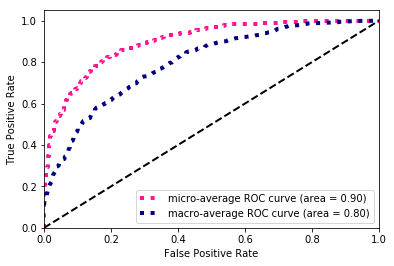

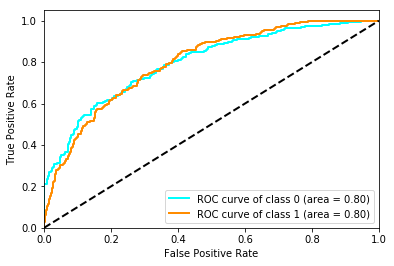

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.889834,0.467290,0.678562,0.817425,0.820267
precision,0.897116,0.449640,0.673378,0.817425,0.823445
recall,0.882669,0.486381,0.684525,0.817425,0.817425
support,1304.000000,257.000000,1561.000000,1561.000000,1561.000000
auc,0.797307,0.797307,0.798230,0.898063,NaN


******************** RNN_embed ********************
**********  round  1
load and test: shapes for train and test, X/Y
(7671, 251)
(7671, 2)
(1561, 251)
(1561, 2)
(7671, 8, 17)
(7671, 14)
(7671, 100)
(7671,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 17)        0                                            
__________________________________________________________________________________________________
embedding_8 (Embedding)         (None, 1, 128)       119680      geo_code[0][0]                   
__________________________________________________________________________________________________


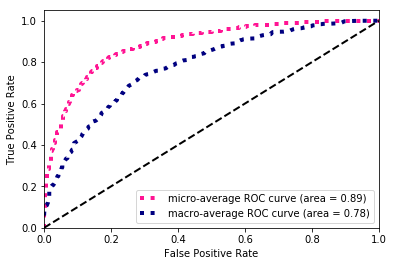

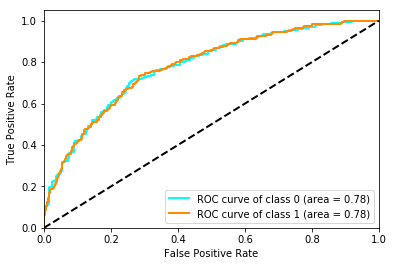

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.888037,0.431907,0.659972,0.812940,0.81294
precision,0.888037,0.431907,0.659972,0.812940,0.81294
recall,0.888037,0.431907,0.659972,0.812940,0.81294
support,1304.000000,257.000000,1561.000000,1561.000000,1561.00000
auc,0.779684,0.779684,0.780686,0.886008,NaN


******************** RNN_embed ********************
**********  round  2
load and test: shapes for train and test, X/Y
(7671, 251)
(7671, 2)
(1561, 251)
(1561, 2)
(7671, 8, 17)
(7671, 14)
(7671, 100)
(7671,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 17)        0                                            
__________________________________________________________________________________________________
embedding_9 (Embedding)         (None, 1, 128)       119680      geo_code[0][0]                   
__________________________________________________________________________________________________


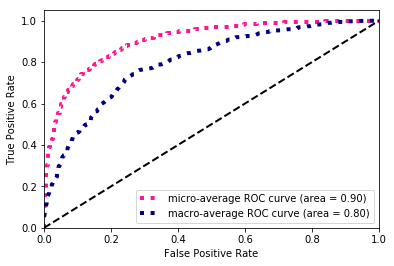

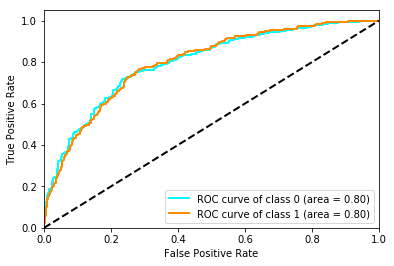

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.892225,0.465649,0.678937,0.820628,0.821994
precision,0.895672,0.456929,0.676301,0.820628,0.823438
recall,0.888804,0.474708,0.681756,0.820628,0.820628
support,1304.000000,257.000000,1561.000000,1561.000000,1561.000000
auc,0.798680,0.798680,0.799682,0.903231,NaN


******************** RNN_embed ********************
**********  round  0
load and test: shapes for train and test, X/Y
(7671, 235)
(7671, 2)
(1561, 235)
(1561, 2)
(7671, 8, 15)
(7671, 14)
(7671, 100)
(7671,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 15)        0                                            
__________________________________________________________________________________________________
embedding_10 (Embedding)        (None, 1, 128)       119680      geo_code[0][0]                   
__________________________________________________________________________________________________


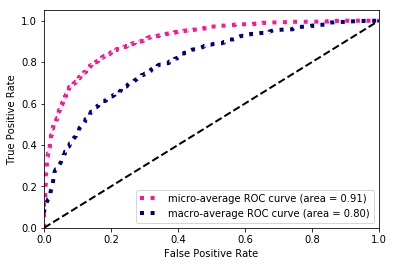

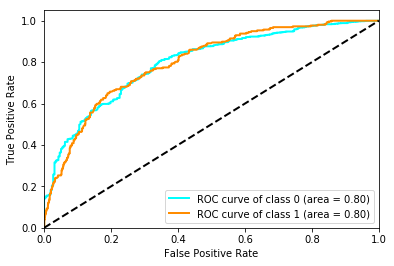

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.895260,0.458498,0.676879,0.824471,0.823352
precision,0.892530,0.465863,0.679197,0.824471,0.822285
recall,0.898006,0.451362,0.674684,0.824471,0.824471
support,1304.000000,257.000000,1561.000000,1561.000000,1561.000000
auc,0.798929,0.798929,0.799532,0.905897,NaN


******************** RNN_embed ********************
**********  round  1
load and test: shapes for train and test, X/Y
(7671, 235)
(7671, 2)
(1561, 235)
(1561, 2)
(7671, 8, 15)
(7671, 14)
(7671, 100)
(7671,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 15)        0                                            
__________________________________________________________________________________________________
embedding_11 (Embedding)        (None, 1, 128)       119680      geo_code[0][0]                   
__________________________________________________________________________________________________


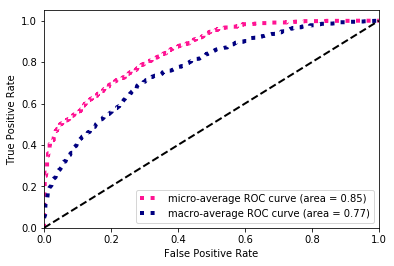

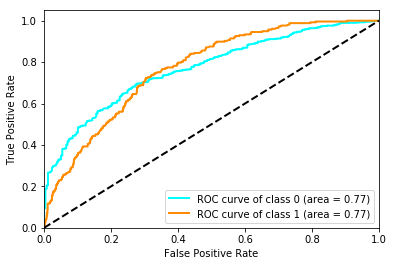

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.837761,0.411852,0.624806,0.745676,0.767640
precision,0.896763,0.332536,0.614649,0.745676,0.803870
recall,0.786043,0.540856,0.663449,0.745676,0.745676
support,1304.000000,257.000000,1561.000000,1561.000000,1561.000000
auc,0.769716,0.769716,0.770343,0.852801,NaN


******************** RNN_embed ********************
**********  round  2
load and test: shapes for train and test, X/Y
(7671, 235)
(7671, 2)
(1561, 235)
(1561, 2)
(7671, 8, 15)
(7671, 14)
(7671, 100)
(7671,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 15)        0                                            
__________________________________________________________________________________________________
embedding_12 (Embedding)        (None, 1, 128)       119680      geo_code[0][0]                   
__________________________________________________________________________________________________


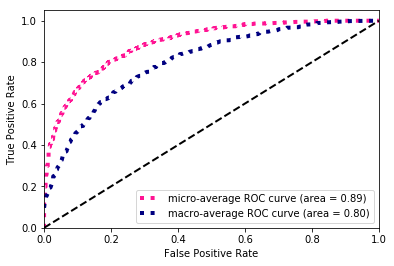

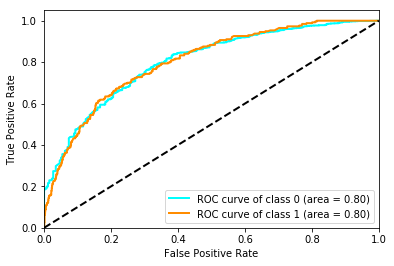

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.877235,0.489256,0.683246,0.802050,0.813359
precision,0.910140,0.425287,0.667714,0.802050,0.830315
recall,0.846626,0.575875,0.711251,0.802050,0.802050
support,1304.000000,257.000000,1561.000000,1561.000000,1561.000000
auc,0.801892,0.801892,0.802493,0.889864,NaN


******************** RNN_embed ********************
**********  round  0
load and test: shapes for train and test, X/Y
(7671, 259)
(7671, 2)
(1561, 259)
(1561, 2)
(7671, 8, 18)
(7671, 14)
(7671, 100)
(7671,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 18)        0                                            
__________________________________________________________________________________________________
embedding_13 (Embedding)        (None, 1, 128)       119680      geo_code[0][0]                   
__________________________________________________________________________________________________


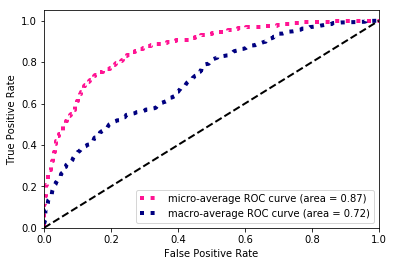

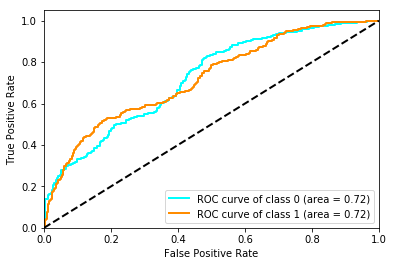

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.870247,0.420315,0.645281,0.787956,0.796171
precision,0.890136,0.382166,0.636151,0.787956,0.806505
recall,0.851227,0.466926,0.659077,0.787956,0.787956
support,1304.000000,257.000000,1561.000000,1561.000000,1561.000000
auc,0.720483,0.720483,0.721506,0.869091,NaN


******************** RNN_embed ********************
**********  round  1
load and test: shapes for train and test, X/Y
(7671, 259)
(7671, 2)
(1561, 259)
(1561, 2)
(7671, 8, 18)
(7671, 14)
(7671, 100)
(7671,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 18)        0                                            
__________________________________________________________________________________________________
embedding_14 (Embedding)        (None, 1, 128)       119680      geo_code[0][0]                   
__________________________________________________________________________________________________


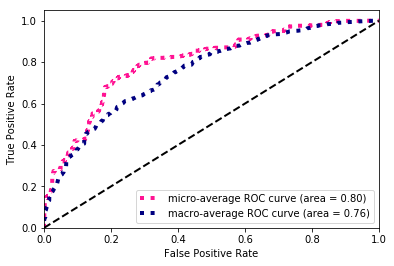

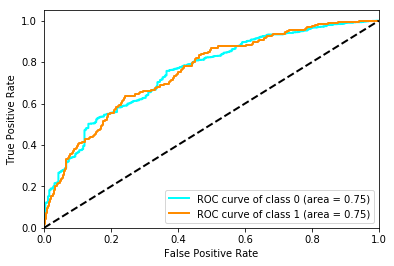

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.830487,0.435506,0.632997,0.739270,0.765458
precision,0.908842,0.338362,0.623602,0.739270,0.814920
recall,0.764571,0.610895,0.687733,0.739270,0.739270
support,1304.000000,257.000000,1561.000000,1561.000000,1561.000000
auc,0.754031,0.754031,0.755036,0.801312,NaN


******************** RNN_embed ********************
**********  round  2
load and test: shapes for train and test, X/Y
(7671, 259)
(7671, 2)
(1561, 259)
(1561, 2)
(7671, 8, 18)
(7671, 14)
(7671, 100)
(7671,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 18)        0                                            
__________________________________________________________________________________________________
embedding_15 (Embedding)        (None, 1, 128)       119680      geo_code[0][0]                   
__________________________________________________________________________________________________


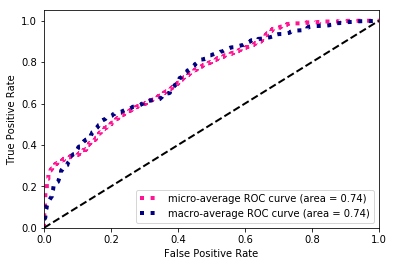

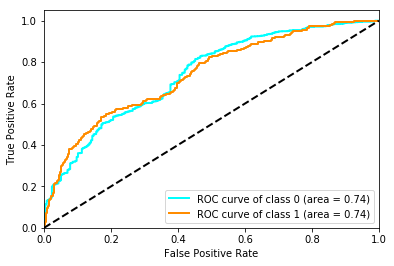

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.755120,0.372146,0.563633,0.647662,0.692068
precision,0.900212,0.263328,0.581770,0.647662,0.795357
recall,0.650307,0.634241,0.642274,0.647662,0.647662
support,1304.000000,257.000000,1561.000000,1561.000000,1561.000000
auc,0.740256,0.740257,0.741189,0.741853,NaN


******************** RNN_embed_wo_geo ********************
**********  round  0
load and test: shapes for train and test, X/Y
(7671, 251)
(7671, 2)
(1561, 251)
(1561, 2)
(7671, 8, 17)
(7671,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 17)        0                                            
__________________________________________________________________________________________________
embedding_16 (Embedding)        (None, 1, 128)       119680      geo_code[0][0]                   
__________________________________________________________________________________________________
lstm_67 (LSTM)  

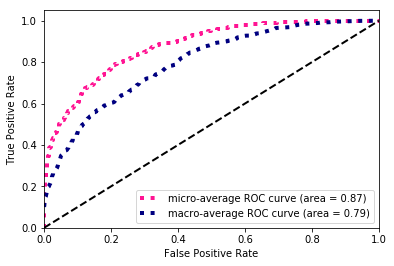

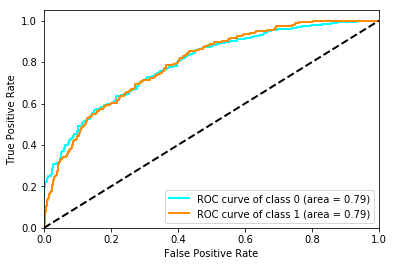

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.866987,0.469649,0.668318,0.787316,0.801570
precision,0.907718,0.398374,0.653046,0.787316,0.823861
recall,0.829755,0.571984,0.700870,0.787316,0.787316
support,1304.000000,257.000000,1561.000000,1561.000000,1561.000000
auc,0.793885,0.793885,0.794834,0.874774,NaN


******************** RNN_embed_wo_geo ********************
**********  round  1
load and test: shapes for train and test, X/Y
(7671, 251)
(7671, 2)
(1561, 251)
(1561, 2)
(7671, 8, 17)
(7671,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 17)        0                                            
__________________________________________________________________________________________________
embedding_17 (Embedding)        (None, 1, 128)       119680      geo_code[0][0]                   
__________________________________________________________________________________________________
lstm_69 (LSTM)  

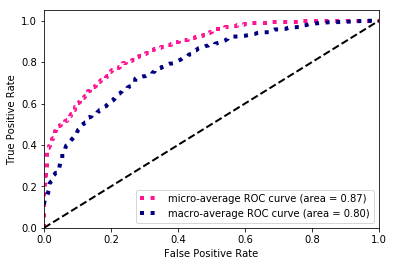

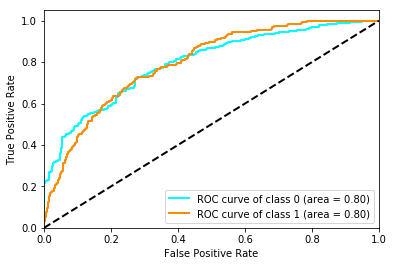

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.857259,0.470588,0.663924,0.775144,0.793598
precision,0.912554,0.384236,0.648395,0.775144,0.825573
recall,0.808282,0.607004,0.707643,0.775144,0.775144
support,1304.000000,257.000000,1561.000000,1561.000000,1561.000000
auc,0.796349,0.796349,0.797209,0.869138,NaN


******************** RNN_embed_wo_geo ********************
**********  round  2
load and test: shapes for train and test, X/Y
(7671, 251)
(7671, 2)
(1561, 251)
(1561, 2)
(7671, 8, 17)
(7671,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 17)        0                                            
__________________________________________________________________________________________________
embedding_18 (Embedding)        (None, 1, 128)       119680      geo_code[0][0]                   
__________________________________________________________________________________________________
lstm_71 (LSTM)  

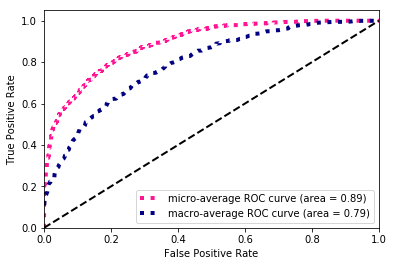

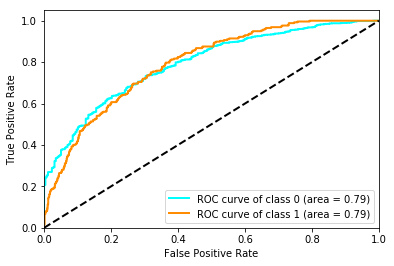

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.875049,0.458120,0.666584,0.796925,0.806407
precision,0.900243,0.408537,0.654390,0.796925,0.819290
recall,0.851227,0.521401,0.686314,0.796925,0.796925
support,1304.000000,257.000000,1561.000000,1561.000000,1561.000000
auc,0.792436,0.792436,0.793367,0.889509,NaN


In [21]:
Miami = compare_models(city='Miami',classname='RNN_embed')

In [22]:
Miami.to_hdf('Miami.h5',key='RNN_embed')
Miami

,NL,geohash,traffic,weather,time,geo
0_f1-score,0.875153,0.873380,0.890032,0.870085,0.818618,0.866432
1_f1-score,0.318763,0.468085,0.454948,0.453202,0.409323,0.466119
weighted avg_f1-score,0.783550,0.806653,0.818401,0.801450,0.751233,0.800525
micro avg_f1-score,0.796284,0.796498,0.816998,0.790732,0.724963,0.786462
macro avg_f1-score,0.596958,0.670732,0.672490,0.661644,0.613970,0.666275
0_precision,0.888562,0.904611,0.893608,0.899811,0.899730,0.906839
1_precision,0.262074,0.422001,0.446159,0.407896,0.327952,0.397049
weighted avg_precision,0.785418,0.825155,0.819941,0.818823,0.805594,0.822908
micro avg_precision,0.796284,0.796498,0.816998,0.790732,0.724963,0.786462
macro avg_precision,0.575318,0.663306,0.669884,0.653853,0.613841,0.651944
